In [1]:
import pandas as pd
import scipy.io
import scipy.sparse
import anndata
import numpy as np
import scipy.io
import pandas as pd
import anndata

def load_adata(path, sample_name):
    matrix_file = f"{path}{sample_name}_matrix.mtx.gz"
    barcodes_file = f"{path}{sample_name}_barcodes.tsv.gz"
    genes_file = f"{path}{sample_name}_genes.tsv.gz"
    
    matrix = scipy.io.mmread(matrix_file).tocsc()
    barcodes = pd.read_csv(barcodes_file, header=None, sep="\t")[0].values
    genes = pd.read_csv(genes_file, header=None, sep="\t")[1].values
    
    adata = anndata.AnnData(X=matrix.T, obs=pd.DataFrame(index=barcodes), var=pd.DataFrame(index=genes))
    adata.obs["sample"] = sample_name
    adata.obs_names = [f"{sample_name}_{cell}" for cell in adata.obs_names]
    adata.var_names_make_unique()
    
    return adata

path = "/home/Data_Drive_8TB/kykim/colon/Macspectrum/"
sample_names = ["GSM3272970_M2_BMDM", "GSM3272969_M1_BMDM", "GSM3272968_M0_BMDM"]
adata_list = [load_adata(path, name) for name in sample_names]
Ladata = anndata.concat(adata_list, join="outer", merge="unique", keys=sample_names)

path = "/home/Data_Drive_8TB/kykim/colon/Macspectrum/"
sample_names = ["GSM3272967_obATM","GSM3272966_lnATM"]
adata_list = [load_adata(path, name) for name in sample_names]
Padata = anndata.concat(adata_list, join="outer", merge="unique", keys=sample_names)


adata = anndata.concat([Ladata, Padata], join="outer", merge="unique", label="batch", keys=["Ladata", "Padata"])

/home/Data_Drive_8TB/kykim/.local/lib/python3.10/site-packages/anndata/_core/anndata.py:1758: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/home/Data_Drive_8TB/kykim/.local/lib/python3.10/site-packages/anndata/_core/anndata.py:1758: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/home/Data_Drive_8TB/kykim/.local/lib/python3.10/site-packages/anndata/_core/anndata.py:1758: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/home/Data_Drive_8TB/kykim/.local/lib/python3.10/site-packages/anndata/_core/anndata.py:1758: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/home/Data_Drive_8TB/kykim/.local/lib/python3.10/site-packages/anndata/_core/anndata.py:1758

/tmp/ipykernel_2098346/2946696039.py:23: FutureWarning: In the future, the default backend for leiden will be igraph instead of leidenalg.

 To achieve the future defaults please pass: flavor="igraph" and n_iterations=2.  directed must also be False to work with igraph's implementation.
  sc.tl.leiden(adata)


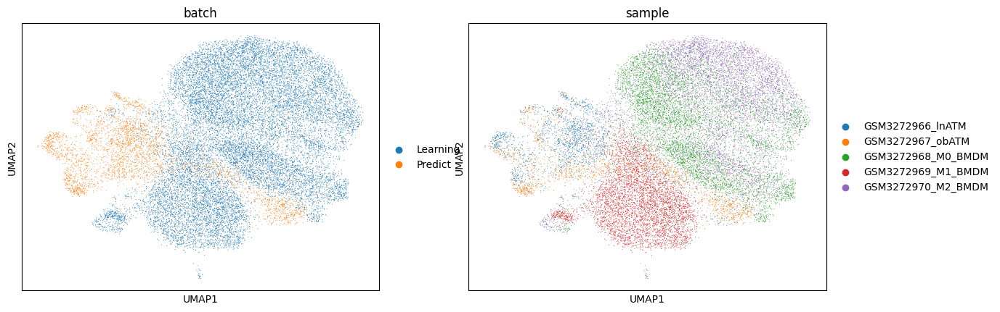

In [2]:
import scanpy as sc
import harmonypy as hm
import anndata as ad
import scanpy as sc
import scanpy.external as sce

Ladata.obs['batch'] = 'Learning'
Padata.obs['batch'] = 'Predict'

adata = ad.concat([Ladata, Padata], axis=0, join="outer")
adata.layers["counts"] = adata.X.copy()

sc.pp.normalize_total(adata)
sc.pp.log1p(adata)
# 3. PCA
sc.tl.pca(adata, svd_solver='arpack')

# 4. BBKNN 실행 (batch_key는 batch 정보 담은 obs column 이름)
sce.pp.bbknn(adata, batch_key='sample')  # 또는 'sample' 등

# 5. UMAP 등 downstream 분석
sc.tl.umap(adata)
sc.tl.leiden(adata)

# 6. 시각화
sc.pl.umap(adata, color=['batch', 'sample'], size=2)

📜 Retrieving model list from server https://celltypist.cog.sanger.ac.uk/models/models.json
📚 Total models in list: 54
📂 Storing models in /home/Data_Drive_8TB/kykim/.celltypist/data/models
💾 Downloading model [1/54]: Immune_All_Low.pkl
💾 Downloading model [2/54]: Immune_All_High.pkl
💾 Downloading model [3/54]: Adult_COVID19_PBMC.pkl
💾 Downloading model [4/54]: Adult_CynomolgusMacaque_Hippocampus.pkl
💾 Downloading model [5/54]: Adult_Human_MTG.pkl
💾 Downloading model [6/54]: Adult_Human_PancreaticIslet.pkl
💾 Downloading model [7/54]: Adult_Human_PrefrontalCortex.pkl
💾 Downloading model [8/54]: Adult_Human_Skin.pkl
💾 Downloading model [9/54]: Adult_Human_Vascular.pkl
💾 Downloading model [10/54]: Adult_Mouse_Gut.pkl
💾 Downloading model [11/54]: Adult_Mouse_OlfactoryBulb.pkl
💾 Downloading model [12/54]: Adult_Pig_Hippocampus.pkl
💾 Downloading model [13/54]: Adult_RhesusMacaque_Hippocampus.pkl
💾 Downloading model [14/54]: Autopsy_COVID19_Lung.pkl
💾 Downloading model [15/54]: COVID19_HumanCh

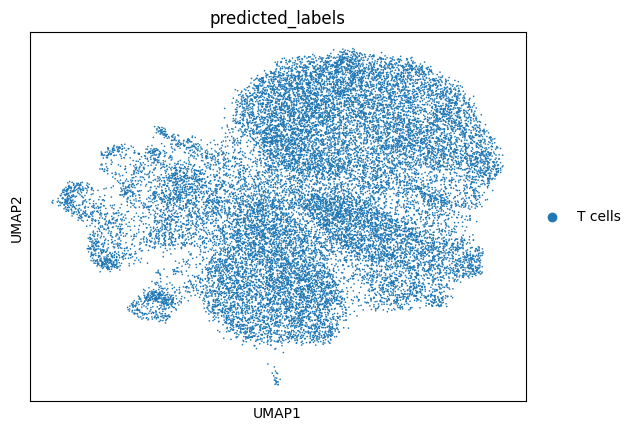

In [3]:
import scanpy as sc
import celltypist
from celltypist import models
models.download_models(force_update = True)
predictions = celltypist.annotate(adata, model = 'Immune_All_High.pkl', majority_voting = True)
adata = predictions.to_adata()
sc.pl.umap(adata, color = ['predicted_labels'])


⚠️ Warning: invalid expression matrix, expect ALL genes and log1p normalized expression to 10000 counts per cell. The prediction result may not be accurate
🔬 Input data has 21574 cells and 27998 genes
🔗 Matching reference genes in the model
🧬 7 features used for prediction
⚖️ Scaling input data
🖋️ Predicting labels
✅ Prediction done!
👀 Detected a neighborhood graph in the input object, will run over-clustering on the basis of it
⛓️ Over-clustering input data with resolution set to 15
🗳️ Majority voting the predictions
✅ Majority voting done!


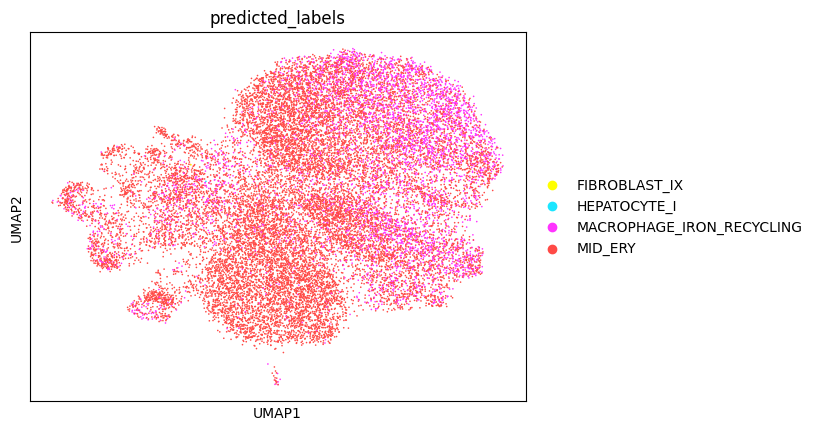

In [71]:
predictions = celltypist.annotate(adata, model = 'Pan_Fetal_Human.pkl', majority_voting = True)
adata = predictions.to_adata()
sc.pl.umap(adata, color = ['predicted_labels'])

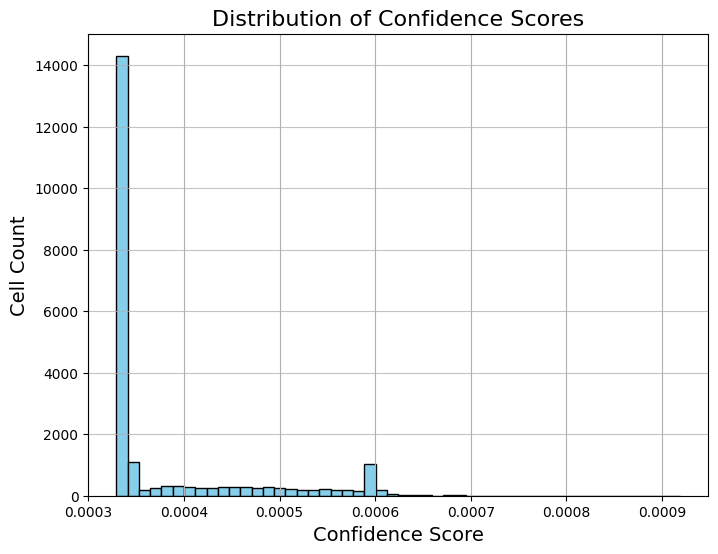

In [74]:
import matplotlib.pyplot as plt

# Check if 'conf_score' exists in Iadata.obs
if 'conf_score' in adata.obs:
    # Plot a histogram of conf_score
    plt.figure(figsize=(8, 6))
    adata.obs['conf_score'].hist(bins=50, color='skyblue', edgecolor='black')
    plt.title('Distribution of Confidence Scores', fontsize=16)
    plt.xlabel('Confidence Score', fontsize=14)
    plt.ylabel('Cell Count', fontsize=14)
    plt.grid(axis='y', alpha=0.75)
    plt.show()
else:
    print("The 'conf_score' column does not exist in Iadata.obs.")

In [75]:
# 'Final' 컬럼 복사
adata.obs['Final'] = adata.obs['predicted_labels'].copy()

# 'No defined' 카테고리를 추가
adata.obs['Final'] = adata.obs['Final'].cat.add_categories('No defined')

# 조건에 따라 값 변경
adata.obs.loc[adata.obs['conf_score'] < 0.7, 'Final'] = 'No defined'
adata.obs['Final'].value_counts()

Final
No defined                   21574
FIBROBLAST_IX                    0
HEPATOCYTE_I                     0
MACROPHAGE_IRON_RECYCLING        0
MID_ERY                          0
Name: count, dtype: int64

In [76]:
import pandas as pd
import scipy.io
import scipy.sparse
import anndata
import numpy as np
import scipy.io
import pandas as pd
import anndata

def load_adata(path, sample_name):
    matrix_file = f"{path}{sample_name}_matrix.mtx.gz"
    barcodes_file = f"{path}{sample_name}_barcodes.tsv.gz"
    genes_file = f"{path}{sample_name}_genes.tsv.gz"
    
    matrix = scipy.io.mmread(matrix_file).tocsc()
    barcodes = pd.read_csv(barcodes_file, header=None, sep="\t")[0].values
    genes = pd.read_csv(genes_file, header=None, sep="\t")[1].values
    
    adata = anndata.AnnData(X=matrix.T, obs=pd.DataFrame(index=barcodes), var=pd.DataFrame(index=genes))
    adata.obs["sample"] = sample_name
    adata.obs_names = [f"{sample_name}_{cell}" for cell in adata.obs_names]
    adata.var_names_make_unique()
    
    return adata

path = "/home/Data_Drive_8TB/kykim/colon/Macspectrum/"
sample_names = ["GSM3272970_M2_BMDM", "GSM3272969_M1_BMDM", "GSM3272968_M0_BMDM"]
adata_list = [load_adata(path, name) for name in sample_names]
Ladata = anndata.concat(adata_list, join="outer", merge="unique", keys=sample_names)

path = "/home/Data_Drive_8TB/kykim/colon/Macspectrum/"
sample_names = ["GSM3272967_obATM","GSM3272966_lnATM"]
adata_list = [load_adata(path, name) for name in sample_names]
Padata = anndata.concat(adata_list, join="outer", merge="unique", keys=sample_names)

valid_genes = {
    "Ctnnd2": "CTNND2", "Kcne3": "KCNE3", "Igfbp4": "IGFBP4", "Dkk2": "DKK2", "Pcp4l1": "PCP4L1",
    "Kmo": "KMO", "Arap3": "ARAP3", "Gpr34": "GPR34", "Slc40a1": "SLC40A1", "Enho": "ENHO",
    "Arhgap19": "ARHGAP19", "Dnph1": "DNPH1", "Tox2": "TOX2", "Bmp2": "BMP2", "Cxcr3": "CXCR3",
    "Cxcl9": "CXCL9", "Ubd": "UBD", "Prm1": "PRM1", "Gm4841": "IRGM", "Krt16": "KRT16",
    "Pcp4": "PCP4", "Ido1": "IDO1", "Apol9b": "APOL2", "Il23r": "IL23R", "Sct": "SCT",
    "Heatr9": "HEATR9", "Serping1": "SERPING1", "Meikin": "MEIKIN", "Gp6": "GP6", "Ccl5": "CCL5",
    "Msx3": "MSX1", "Kcnd3": "KCND3", "Il31ra": "IL31RA", "Retnla": "RETNLB", "Rnase2a": "RNASE2",
    "Scn3a": "SCN3A", "Tmem26": "TMEM26", "Cdh1": "CDH1", "Arg1": "ARG1", "Chil3": "CHI3L1",
    "Rbp4": "RBP4", "Cldn11": "CLDN11", "Ccl17": "CCL17", "Mgl2": "CLEC10A", "Ang2": "ANGPT2",
    "Sh2d3c": "SH2D3C", "Slc13a3": "SLC13A3", "Rcan1": "RCAN1", "Vsir": "VSIR", "Trp53inp1": "TP53INP1",
    "Nr1d2": "NR1D2", "Fcgrt": "FCGRT", "Nfxl1": "NFXL1", "Il16": "IL16", "Cd38": "CD38",
    "Cfb": "CFB", "Slfn4": "SLFN12L", "H2-Q6": "HLA-A", "Fpr1": "FPR1", "Slfn1": "SLFN11",
    "Gpr18": "GPR18", "Ccrl2": "CCRL2", "Fpr2": "FPR2", "Cxcl10": "CXCL10", "Ptgs1": "PTGS1",
    "Egr2": "EGR2", "Olfm1": "OLFM1", "Flrt2": "FLRT2", "P2ry1": "P2RY1", "Vwf": "VWF",
    "Bcar3": "BCAR3", "Il6st": "IL6ST", "Tanc2": "TANC2", "Mmp12": "MMP12"
}

adata = anndata.concat([Ladata, Padata], join="outer", merge="unique", label="batch", keys=["Ladata", "Padata"])
valid_gene_list = list(valid_genes.keys())
valid_genes_in_adata = [gene for gene in valid_gene_list if gene in adata.var_names]
adata = adata[:, valid_genes_in_adata].copy()

... storing 'sample' as categorical
... storing 'batch' as categorical


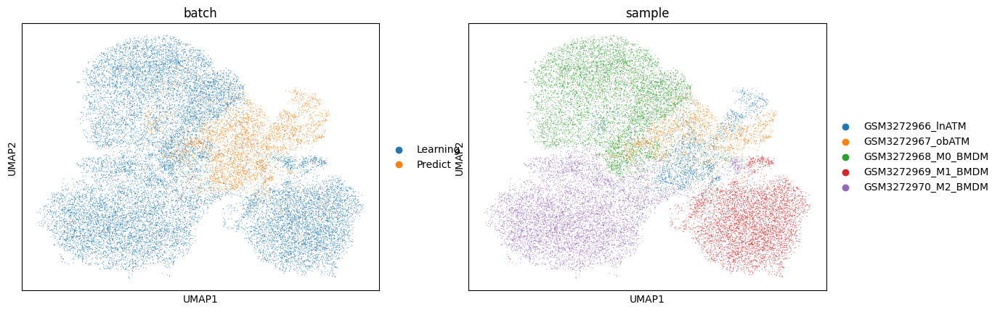

In [77]:
import scanpy as sc
import harmonypy as hm
import anndata as ad
import scanpy as sc
import scanpy.external as sce

Ladata.obs['batch'] = 'Learning'
Padata.obs['batch'] = 'Predict'

adata = ad.concat([Ladata, Padata], axis=0, join="outer")
adata.layers["counts"] = adata.X.copy()

sc.pp.normalize_total(adata)
sc.pp.log1p(adata)
# 3. PCA
sc.tl.pca(adata, svd_solver='arpack')

# 4. BBKNN 실행 (batch_key는 batch 정보 담은 obs column 이름)
sce.pp.bbknn(adata, batch_key='batch')  # 또는 'sample' 등

# 5. UMAP 등 downstream 분석
sc.tl.umap(adata)
sc.tl.leiden(adata)

# 6. 시각화
sc.pl.umap(adata, color=['batch', 'sample'], size=2)

In [78]:
adata.obs['sample'].value_counts()

sample
GSM3272968_M0_BMDM    6979
GSM3272970_M2_BMDM    6391
GSM3272969_M1_BMDM    4736
GSM3272967_obATM      1758
GSM3272966_lnATM      1710
Name: count, dtype: int64

📜 Retrieving model list from server https://celltypist.cog.sanger.ac.uk/models/models.json
📚 Total models in list: 54
📂 Storing models in /home/Data_Drive_8TB/kykim/.celltypist/data/models
💾 Downloading model [1/54]: Immune_All_Low.pkl
💾 Downloading model [2/54]: Immune_All_High.pkl
💾 Downloading model [3/54]: Adult_COVID19_PBMC.pkl
💾 Downloading model [4/54]: Adult_CynomolgusMacaque_Hippocampus.pkl
💾 Downloading model [5/54]: Adult_Human_MTG.pkl
💾 Downloading model [6/54]: Adult_Human_PancreaticIslet.pkl
💾 Downloading model [7/54]: Adult_Human_PrefrontalCortex.pkl
💾 Downloading model [8/54]: Adult_Human_Skin.pkl
💾 Downloading model [9/54]: Adult_Human_Vascular.pkl
💾 Downloading model [10/54]: Adult_Mouse_Gut.pkl
💾 Downloading model [11/54]: Adult_Mouse_OlfactoryBulb.pkl
💾 Downloading model [12/54]: Adult_Pig_Hippocampus.pkl
💾 Downloading model [13/54]: Adult_RhesusMacaque_Hippocampus.pkl
💾 Downloading model [14/54]: Autopsy_COVID19_Lung.pkl
💾 Downloading model [15/54]: COVID19_HumanCh

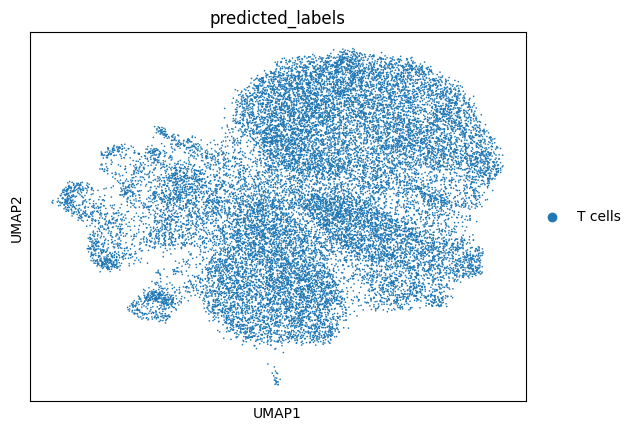

In [127]:
import scanpy as sc
import celltypist
from celltypist import models
models.download_models(force_update = True)
predictions = celltypist.annotate(adata, model = 'Immune_All_High.pkl', majority_voting = True)
adata = predictions.to_adata()
sc.pl.umap(adata, color = ['predicted_labels'])


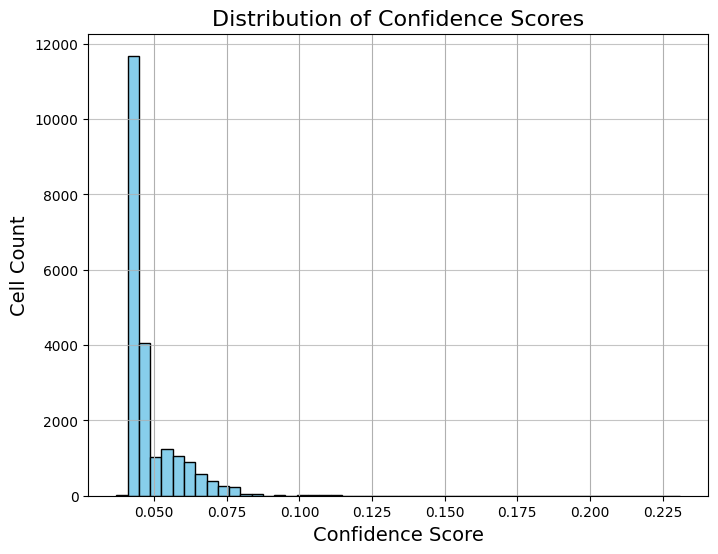

In [129]:
import matplotlib.pyplot as plt

# Check if 'conf_score' exists in Iadata.obs
if 'conf_score' in adata.obs:
    # Plot a histogram of conf_score
    plt.figure(figsize=(8, 6))
    adata.obs['conf_score'].hist(bins=50, color='skyblue', edgecolor='black')
    plt.title('Distribution of Confidence Scores', fontsize=16)
    plt.xlabel('Confidence Score', fontsize=14)
    plt.ylabel('Cell Count', fontsize=14)
    plt.grid(axis='y', alpha=0.75)
    plt.show()
else:
    print("The 'conf_score' column does not exist in Iadata.obs.")

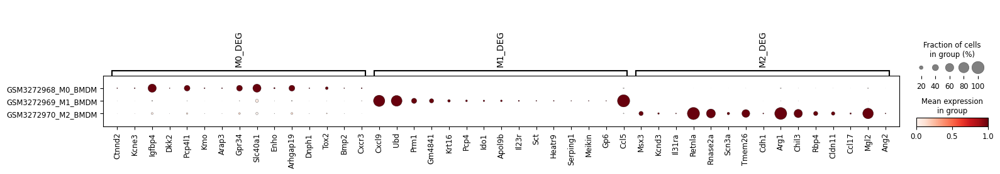

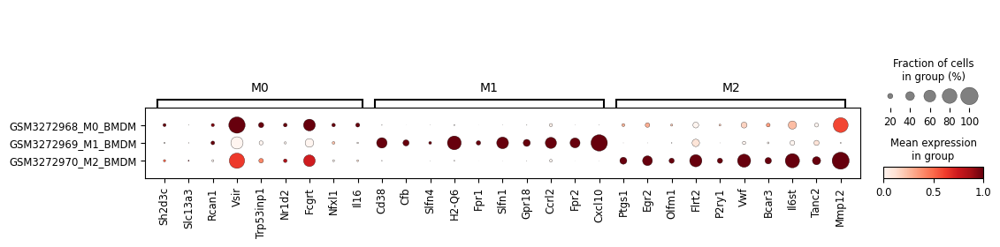

In [79]:
DEG_genes = {
    "M0_DEG": ['Ctnnd2', 'Kcne3', 'Igfbp4', 'Dkk2', 'Pcp4l1', 'Kmo', 'Arap3', 'Gpr34', 'Slc40a1', 'Enho', 'Arhgap19', 'Dnph1', 'Tox2', 'Bmp2', 'Cxcr3'],
    "M1_DEG": ['Cxcl9', 'Ubd', 'Prm1', 'Gm4841', 'Krt16', 'Pcp4', 'Ido1', 'Apol9b', 'Il23r', 'Sct', 'Heatr9', 'Serping1', 'Meikin', 'Gp6', 'Ccl5'],
    "M2_DEG": ['Msx3', 'Kcnd3', 'Il31ra', 'Retnla', 'Rnase2a', 'Scn3a', 'Tmem26', 'Cdh1', 'Arg1', 'Chil3', 'Rbp4', 'Cldn11', 'Ccl17', 'Mgl2', 'Ang2']
    
}

marker_genes = {
    "M0": ['Sh2d3c', 'Slc13a3', 'Rcan1', 'Vsir', 'Trp53inp1', 'Nr1d2', 'Fcgrt', 'Nfxl1', 'Il16'],
    "M1": ['Cd38', 'Cfb', 'Slfn4', 'H2-Q6', 'Fpr1', 'Slfn1', 'Gpr18', 'Ccrl2', 'Fpr2', 'Cxcl10'],
    "M2": ['Ptgs1', 'Egr2', 'Olfm1', 'Flrt2', 'P2ry1', 'Vwf', 'Bcar3', 'Il6st', 'Tanc2', 'Mmp12']
}


import scanpy as sc
Xadata = adata[adata.obs['sample'].isin(['GSM3272967_obATM','GSM3272966_lnATM'])].copy()
Madata = adata[adata.obs['sample'].isin(['GSM3272968_M0_BMDM', 'GSM3272970_M2_BMDM', 'GSM3272969_M1_BMDM'])].copy()


DEG_genes = {cat: [gene for gene in genes if gene in Madata.var_names] 
                  for cat, genes in DEG_genes.items()}
DEG_genes = {cat: genes for cat, genes in DEG_genes.items() if genes}

sc.pl.dotplot(Madata, DEG_genes, groupby="sample", standard_scale="var")




existing_genes = {cat: [gene for gene in genes if gene in Madata.var_names] 
                  for cat, genes in marker_genes.items()}
existing_genes = {cat: genes for cat, genes in marker_genes.items() if genes}
sc.pl.dotplot(Madata, marker_genes, groupby="sample", standard_scale="var")

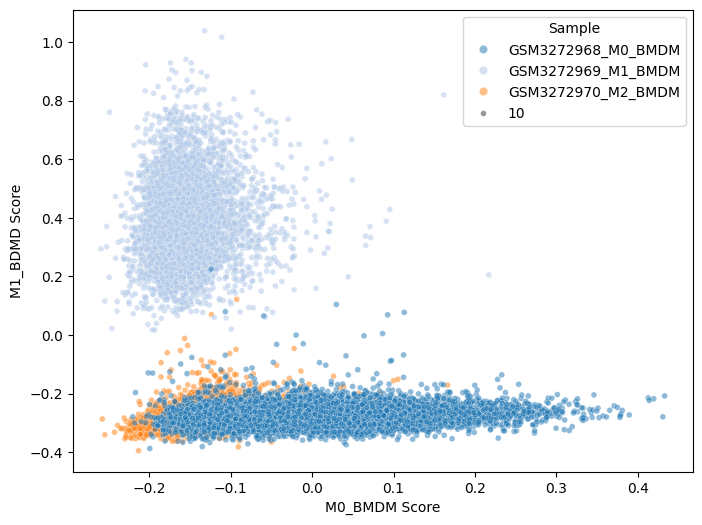

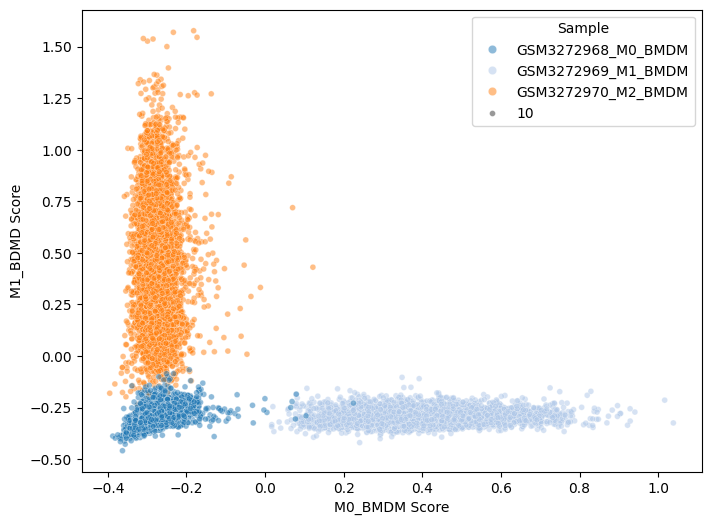

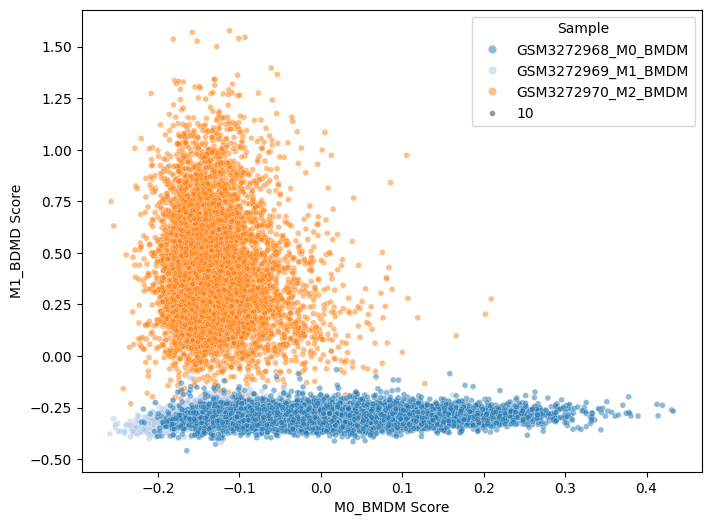

In [80]:
from itertools import combinations
import matplotlib.pyplot as plt
import seaborn as sns
M0_BMDM = ['Ctnnd2', 'Kcne3', 'Igfbp4', 'Dkk2', 'Pcp4l1', 'Kmo', 'Arap3', 'Gpr34', 'Slc40a1', 'Enho', 'Arhgap19', 'Dnph1', 'Tox2', 'Bmp2', 'Cxcr3']
M1_BDMD = ['Cxcl9', 'Ubd', 'Prm1', 'Gm4841', 'Krt16', 'Pcp4', 'Ido1', 'Apol9b', 'Il23r', 'Sct', 'Heatr9', 'Serping1', 'Meikin', 'Gp6', 'Ccl5']
M2_BDMD = ['Msx3', 'Kcnd3', 'Il31ra', 'Retnla', 'Rnase2a', 'Scn3a', 'Tmem26', 'Cdh1', 'Arg1', 'Chil3', 'Rbp4', 'Cldn11', 'Ccl17', 'Mgl2', 'Ang2']


sc.tl.score_genes(Madata, gene_list=M0_BMDM, score_name='M0_BMDM_score')
sc.tl.score_genes(Madata, gene_list=M1_BDMD, score_name='M1_BDMD_score')
sc.tl.score_genes(Madata, gene_list=M2_BDMD, score_name='M2_BDMD_score')


plt.figure(figsize=(8, 6))
sns.scatterplot(x='M0_BMDM_score', y='M1_BDMD_score', hue='sample', data=Madata.obs, palette='tab20', alpha=0.5, size=10)
plt.xlabel('M0_BMDM Score')
plt.ylabel('M1_BDMD Score')
plt.legend(title='Sample')
plt.show()

plt.figure(figsize=(8, 6))
sns.scatterplot(x='M1_BDMD_score', y='M2_BDMD_score', hue='sample', data=Madata.obs, palette='tab20', alpha=0.5, size=10)
plt.xlabel('M0_BMDM Score')
plt.ylabel('M1_BDMD Score')
plt.legend(title='Sample')
plt.show()

plt.figure(figsize=(8, 6))
sns.scatterplot(x='M0_BMDM_score', y='M2_BDMD_score', hue='sample', data=Madata.obs, palette='tab20', alpha=0.5, size=10)
plt.xlabel('M0_BMDM Score')
plt.ylabel('M1_BDMD Score')
plt.legend(title='Sample')
plt.show()

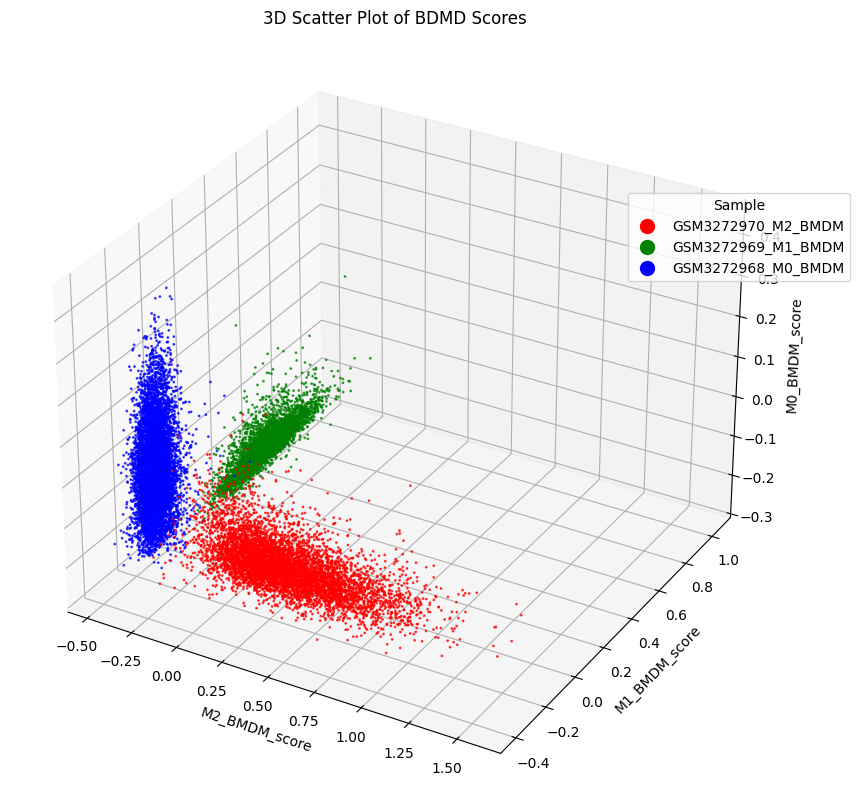

In [81]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from mpl_toolkits.mplot3d import Axes3D

# 3D 데이터 추출
x = Madata.obs['M2_BDMD_score'] 
y = Madata.obs['M1_BDMD_score'] 
z = Madata.obs['M0_BMDM_score']

# 샘플 그룹 정보 (컬러링 용도) - 문자열로 변환
samples = Madata.obs['sample'].astype(str)

# 색상 지정 (샘플별 컬러링)
unique_samples = samples.unique()
palette = sns.color_palette("tab10", len(unique_samples))
color_map = {
    'GSM3272968_M0_BMDM': 'blue',  # 파랑색
    'GSM3272969_M1_BMDM': 'green', # 녹색
    'GSM3272970_M2_BMDM': 'red'    # 빨강색
}
colors = samples.map(color_map)  # Categorical 대응 완료!

# 3D 플롯 생성
fig = plt.figure(figsize=(16, 10))
ax = fig.add_subplot(111, projection='3d')

# 산점도 플로팅
sc = ax.scatter(x, y, z, c=colors, alpha=0.7 , s = 1)

ax.set_ylabel('M1_BMDM_score')
ax.set_zlabel('M0_BMDM_score')
ax.set_xlabel('M2_BMDM_score')
ax.set_title('3D Scatter Plot of BDMD Scores')
# 범례 추가
handles = [plt.Line2D([0], [0], marker='o', color=color_map[sample], linestyle='', markersize=10) 
           for sample in unique_samples]
ax.legend(handles, unique_samples, title="Sample", bbox_to_anchor=(1.1, 0.8))

plt.show()


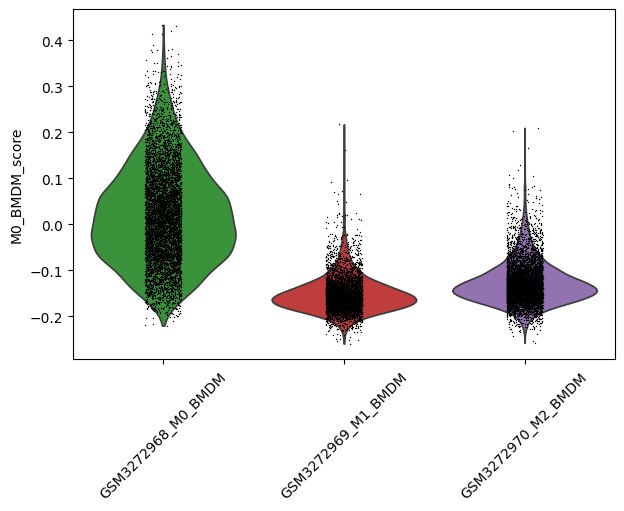

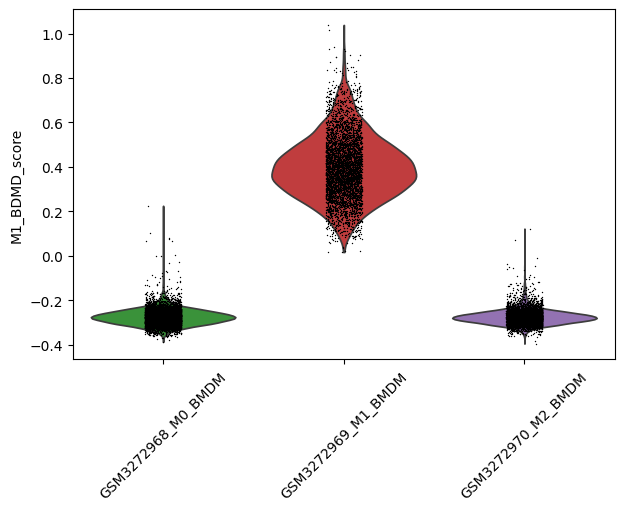

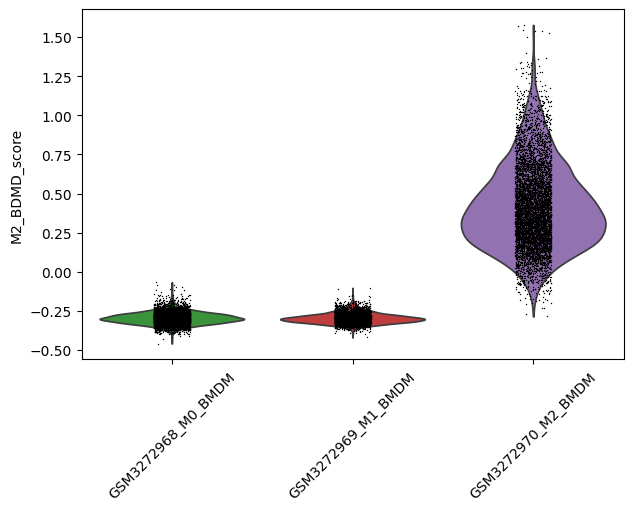

In [82]:
import scanpy as sc
sc.pl.violin(Madata, keys='M0_BMDM_score', groupby='sample', jitter=True, rotation=45)
sc.pl.violin(Madata, keys='M1_BDMD_score', groupby='sample', jitter=True, rotation=45)
sc.pl.violin(Madata, keys='M2_BDMD_score', groupby='sample', jitter=True, rotation=45)

In [83]:
#Parameter 0 - Regerence gene

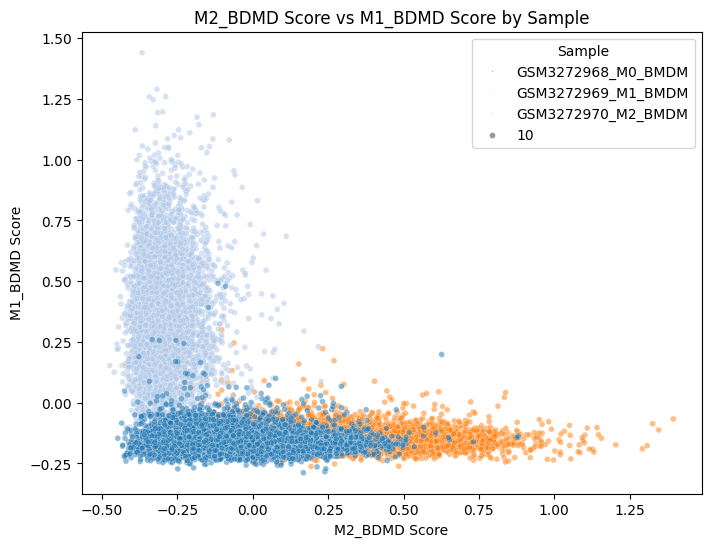

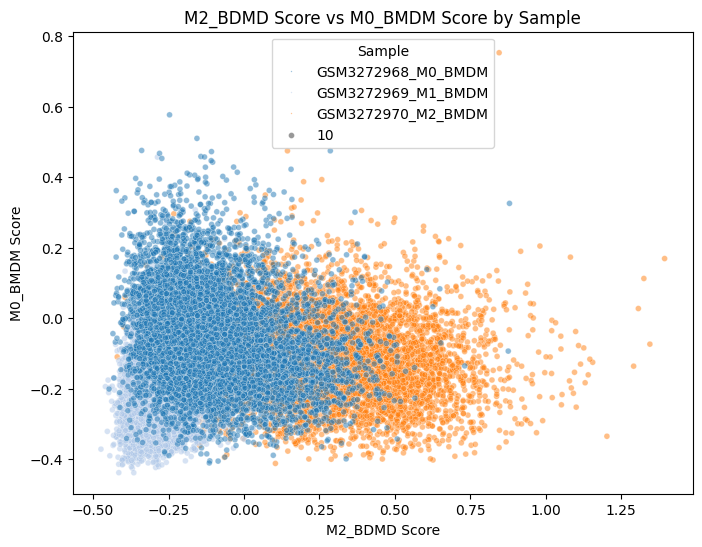

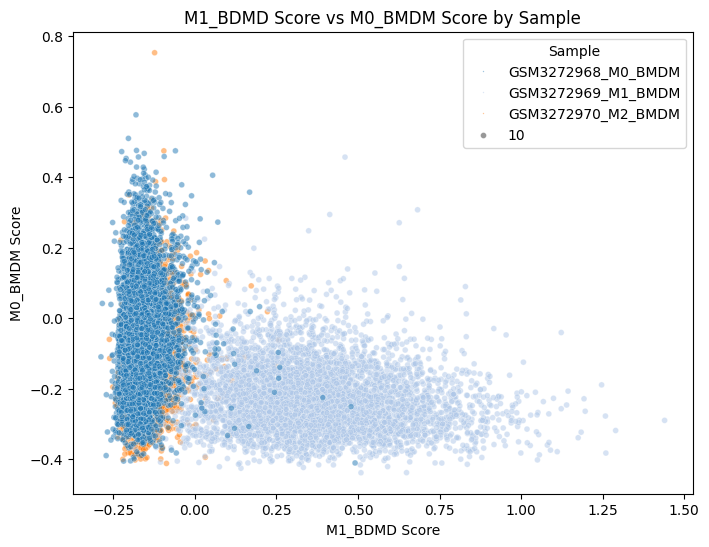

In [84]:
import matplotlib.pyplot as plt
from itertools import combinations
import seaborn as sns
import scanpy as sc

M0_BMDM_ref = ['Sh2d3c', 'Slc13a3', 'Rcan1', 'Vsir', 'Trp53inp1', 'Nr1d2', 'Fcgrt', 'Nfxl1', 'Il16']
M1_BDMD_ref = ['Cd38', 'Cfb', 'Slfn4', 'H2-Q6', 'Fpr1', 'Slfn1', 'Gpr18', 'Ccrl2', 'Fpr2', 'Cxcl10']
M2_BMDM_ref = ['Ptgs1', 'Egr2', 'Olfm1', 'Flrt2', 'P2ry1', 'Vwf', 'Bcar3', 'Il6st', 'Tanc2', 'Mmp12']


# Xadata.var_names의 유전자명들을 첫 글자만 대문자로 변환
var_names_capitalized = [gene.capitalize() for gene in Madata.var_names]

def filter_existing_genes(gene_list):
    return [gene for gene in gene_list if gene.capitalize() in var_names_capitalized]

# 비교할 조합 설정
comparisons = [("M2_BDMD", M2_BMDM_ref), ("M1_BDMD", M1_BDMD_ref), ("M0_BMDM", M0_BMDM_ref)]
for (name1, genes1), (name2, genes2) in combinations(comparisons, 2):
    existing_genes1 = filter_existing_genes(genes1)
    existing_genes2 = filter_existing_genes(genes2)
    
    sc.tl.score_genes(Madata, gene_list=existing_genes1, score_name=f'{name1}_ref_score')
    sc.tl.score_genes(Madata, gene_list=existing_genes2, score_name=f'{name2}_ref_score')
    
    plt.figure(figsize=(8, 6))
    sns.scatterplot(x=f'{name1}_ref_score', y=f'{name2}_ref_score', hue='sample', data=Madata.obs, palette='tab20', alpha=0.5, size=10, s = 1)
    
    plt.title(f'{name1} Score vs {name2} Score by Sample')
    plt.xlabel(f'{name1} Score')
    plt.ylabel(f'{name2} Score')
    plt.legend(title='Sample')
    plt.show()

In [85]:
Madata.obs['cell_type'] = Madata.obs['sample'].str[-7:]

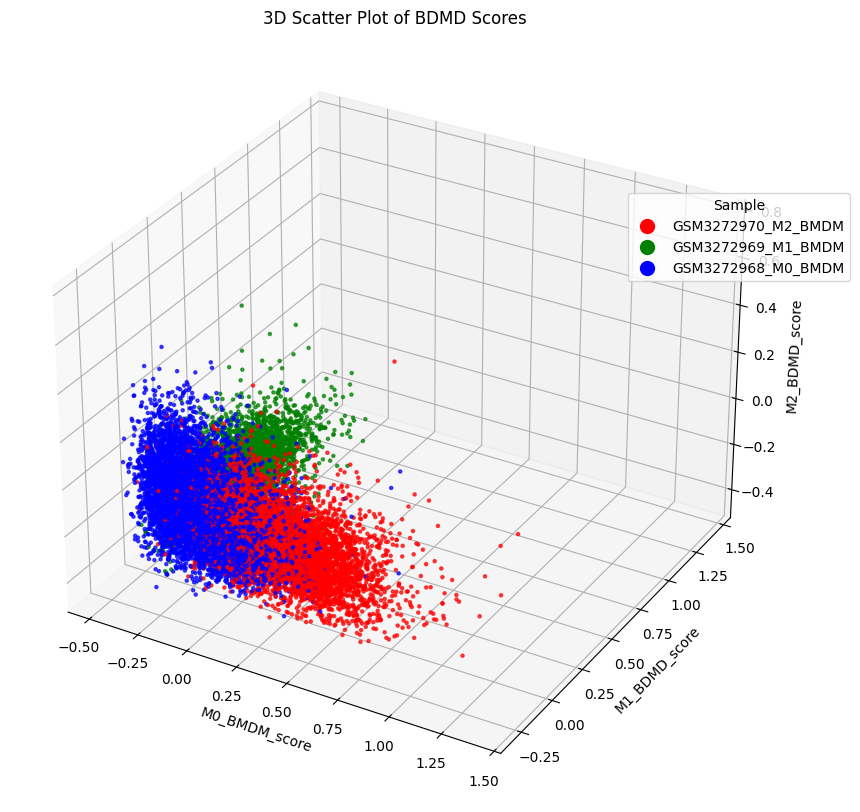

In [86]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from mpl_toolkits.mplot3d import Axes3D

# 3D 데이터 추출
x = Madata.obs['M2_BDMD_ref_score'] 
y = Madata.obs['M1_BDMD_ref_score'] 
z = Madata.obs['M0_BMDM_ref_score']

# 샘플 그룹 정보 (컬러링 용도) - 문자열로 변환
samples = Madata.obs['sample'].astype(str)

# 색상 지정 (샘플별 컬러링)
unique_samples = samples.unique()
palette = sns.color_palette("tab10", len(unique_samples))
color_map = {
    'GSM3272968_M0_BMDM': 'blue',  # 파랑색
    'GSM3272969_M1_BMDM': 'green', # 녹색
    'GSM3272970_M2_BMDM': 'red'    # 빨강색
}
colors = samples.map(color_map)  # Categorical 대응 완료!

# 3D 플롯 생성
fig = plt.figure(figsize=(16, 10))
ax = fig.add_subplot(111, projection='3d')

# 산점도 플로팅
sc = ax.scatter(x, y, z, c=colors, alpha=0.7 , s = 5)

# 축 및 제목 설정
# ax.set_xlabel('M2_BDMD_score')
# ax.set_ylabel('M1_BDMD_score')
# ax.set_zlabel('M0_BMDM_score')
# ax.set_title('3D Scatter Plot of BDMD Scores')

ax.set_ylabel('M1_BDMD_score')
ax.set_zlabel('M2_BDMD_score')
ax.set_xlabel('M0_BMDM_score')
ax.set_title('3D Scatter Plot of BDMD Scores')
# 범례 추가
handles = [plt.Line2D([0], [0], marker='o', color=color_map[sample], linestyle='', markersize=10) 
           for sample in unique_samples]
ax.legend(handles, unique_samples, title="Sample", bbox_to_anchor=(1.1, 0.8))

plt.show()


... storing 'cell_type' as categorical


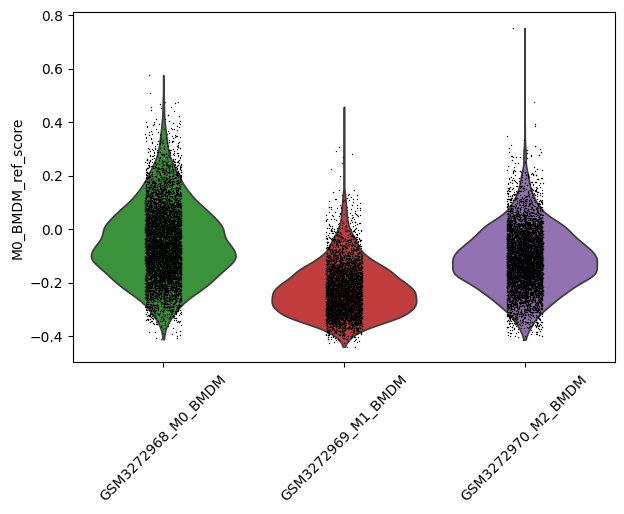

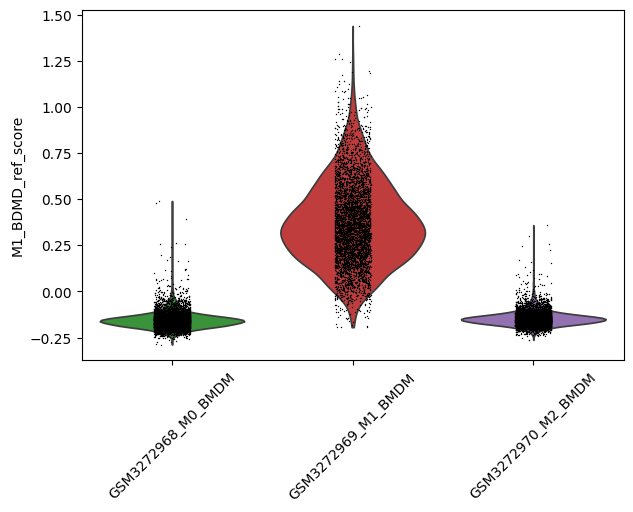

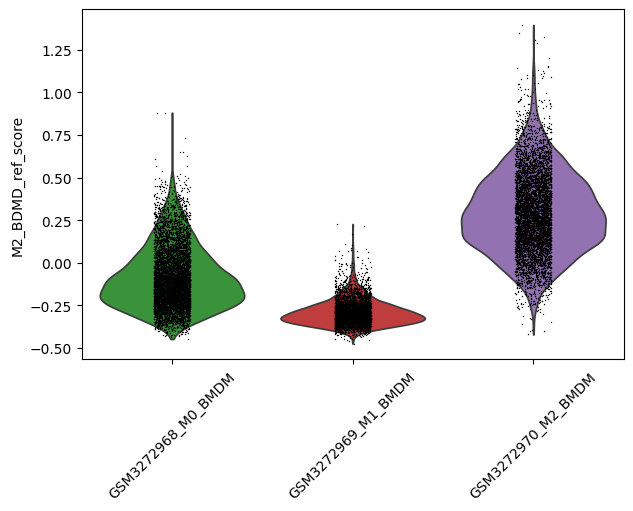

In [87]:
import scanpy as sc
# Violin plot 그리기
sc.pl.violin(Madata, keys='M0_BMDM_ref_score', groupby='sample', jitter=True, rotation=45)
sc.pl.violin(Madata, keys='M1_BDMD_ref_score', groupby='sample', jitter=True, rotation=45)
sc.pl.violin(Madata, keys='M2_BDMD_ref_score', groupby='sample', jitter=True, rotation=45)

In [88]:
#Parameter 1 : from cetroid to each dot - vector force

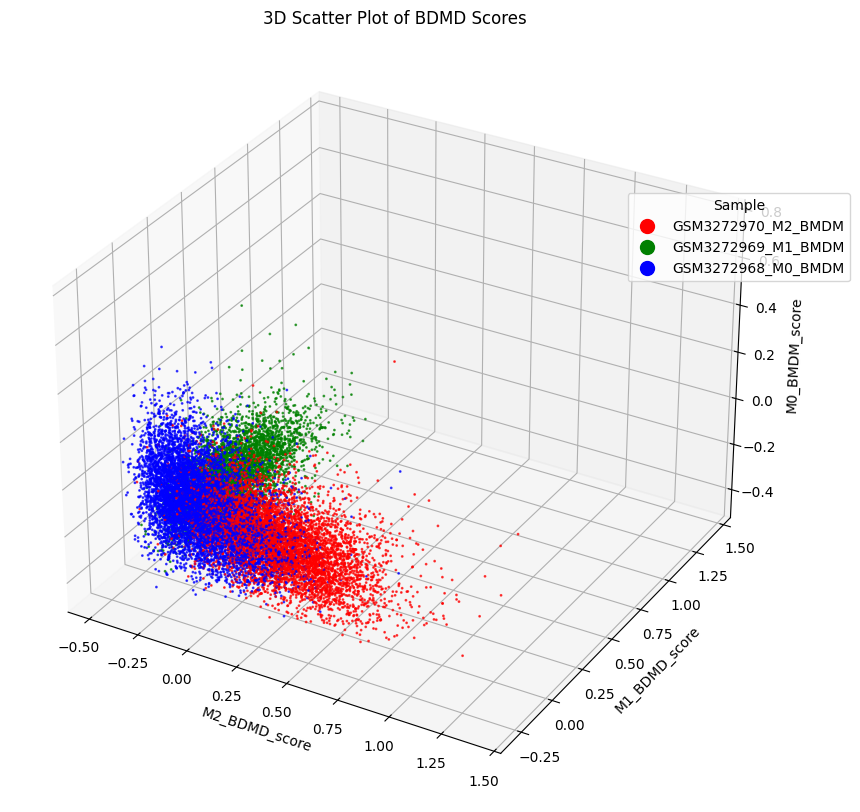

In [89]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from mpl_toolkits.mplot3d import Axes3D

# 3D 데이터 추출
x = Madata.obs['M2_BDMD_ref_score']
y = Madata.obs['M1_BDMD_ref_score']
z = Madata.obs['M0_BMDM_ref_score']

# 샘플 그룹 정보 (컬러링 용도) - 문자열로 변환
samples = Madata.obs['sample'].astype(str)

# 색상 지정 (샘플별 컬러링)
unique_samples = samples.unique()
palette = sns.color_palette("tab10", len(unique_samples))

colors = samples.map(color_map)  # Categorical 대응 완료!

# 3D 플롯 생성
fig = plt.figure(figsize=(16, 10))
ax = fig.add_subplot(111, projection='3d')

# 산점도 플로팅
sc = ax.scatter(x, y, z, c=colors, alpha=0.7 , s = 1)

# 축 및 제목 설정
ax.set_xlabel('M2_BDMD_score')
ax.set_ylabel('M1_BDMD_score')
ax.set_zlabel('M0_BMDM_score')
ax.set_title('3D Scatter Plot of BDMD Scores')

# 범례 추가
handles = [plt.Line2D([0], [0], marker='o', color=color_map[sample], linestyle='', markersize=10) 
           for sample in unique_samples]
ax.legend(handles, unique_samples, title="Sample", bbox_to_anchor=(1.1, 0.8))

plt.show()
ax.view_init(elev=50, azim=50)

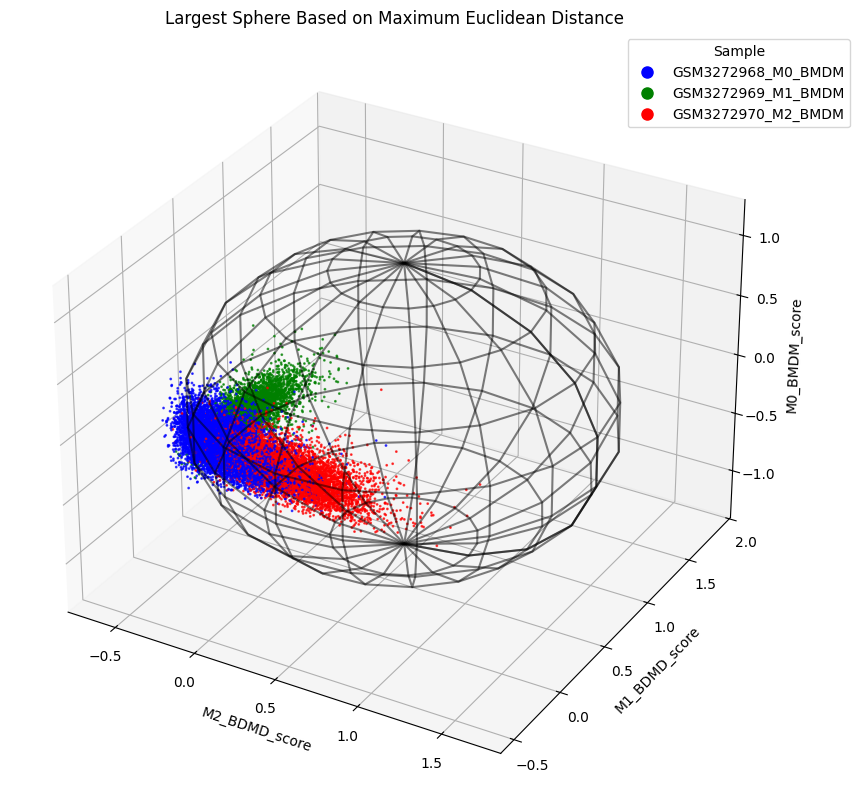

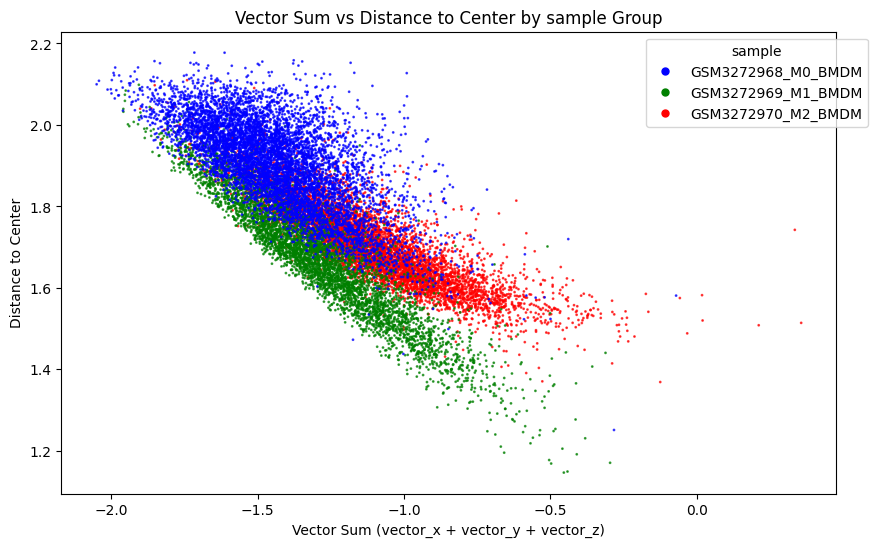

[ 0.51389503  0.68651207 -0.05999518]
=== 구의 방정식 ===
(x - 0.5139)² + (y - 0.6865)² + (z - -0.0600)² = 1.3958


In [90]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from scipy.spatial.distance import cdist

# 3D 데이터 추출
x = Madata.obs['M2_BDMD_ref_score'].values
y = Madata.obs['M1_BDMD_ref_score'].values
z = Madata.obs['M0_BMDM_ref_score'].values

# 3D 좌표 배열
points = np.vstack((x, y, z)).T

# 모든 점들 간의 유클리드 거리 계산
distances = cdist(points, points)

# 자기 자신을 제외한 최대 거리 찾기
np.fill_diagonal(distances, 0)  # 자기 자신은 제외 (0으로 설정)
max_dist_idx = np.unravel_index(np.argmax(distances), distances.shape)

# 가장 큰 유클리드 거리
max_distance = distances[max_dist_idx]

# 가장 큰 구의 반지름은 그 거리의 절반
radius = max_distance / 2

# 구의 중심은 두 점의 중간 지점
center = (points[max_dist_idx[0]] + points[max_dist_idx[1]]) / 2

# 구 좌표 생성
u = np.linspace(0, 2 * np.pi, 20)   # θ (방위각)
v = np.linspace(0, np.pi, 10)       # φ (경도각)
x_sphere = center[0] + radius * np.outer(np.cos(u), np.sin(v))
y_sphere = center[1] + radius * np.outer(np.sin(u), np.sin(v))
z_sphere = center[2] + radius * np.outer(np.ones(np.size(u)), np.cos(v))

# 구의 중심에서 각 점까지의 벡터와 거리 계산
vectors = points - center  # 구의 중심에서 각 점까지의 벡터
distances_to_center = np.linalg.norm(vectors, axis=1)  # 구의 중심에서 각 점까지의 거리

# XOadata.obs['final_predict'] 값 가져오기
sample = Madata.obs['sample'].values

# DataFrame 생성
dimension = pd.DataFrame({
    'x': x,
    'y': y,
    'z': z,
    'distance_to_center': distances_to_center,
    'vector_x': vectors[:, 0],
    'vector_y': vectors[:, 1],
    'vector_z': vectors[:, 2],
    'sample': sample
})


# 3D 플롯 생성
# fig = plt.figure(figsize=(16, 10))
# ax = fig.add_subplot(111, projection='3d')

# ##############################3
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# sample별 색상 지정
color_dict = {"GSM3272968_M0_BMDM": "blue", "GSM3272969_M1_BMDM": "green", "GSM3272970_M2_BMDM": "red"}

# sample별 색상 매핑
colors = dimension['sample'].map(color_dict)

# 3D 플롯 생성
fig = plt.figure(figsize=(16, 10))
ax = fig.add_subplot(111, projection='3d')

# 점 플로팅 (sample별 색상 적용)
ax.scatter(dimension['x'], dimension['y'], dimension['z'], c=colors, alpha=0.7, s=1)

# 가장 큰 구 플로팅
ax.plot_wireframe(x_sphere, y_sphere, z_sphere, color='black', alpha=0.5)

# 범례 추가
handles = [plt.Line2D([0], [0], marker='o', color=color, markersize=8, linestyle="None") 
           for key, color in color_dict.items()]
ax.legend(handles, color_dict.keys(), title="Sample", bbox_to_anchor=(1.1, 1))

# 축 및 제목 설정
ax.set_xlabel('M2_BDMD_score')
ax.set_ylabel('M1_BDMD_score')
ax.set_zlabel('M0_BMDM_score')
ax.set_title('Largest Sphere Based on Maximum Euclidean Distance')

plt.show()

########################################
# 가장 큰 구 플로팅
ax.plot_wireframe(x_sphere, y_sphere, z_sphere, color='black', alpha=0.5)

# 축 및 제목 설정
ax.set_xlabel('M2_BDMD_score')
ax.set_ylabel('M1_BDMD_score')
ax.set_zlabel('M0_BMDM_score')
ax.set_title('Largest Sphere Based on Maximum Euclidean Distance')

plt.show()

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
dimension['vector_sum'] = dimension['vector_x'] + dimension['vector_y'] + dimension['vector_z']

# 구의 중심을 계산 (dimension 객체에서 중간값으로 설정)
# center = np.array([0, 0, 0]) 

# 각 점에서 구의 중심까지의 거리 계산
dimension['distance_to_center'] = np.linalg.norm(
    np.vstack((dimension['vector_x'], dimension['vector_y'], dimension['vector_z'])).T - center, axis=1)

# final_predict 값에 따라 색상 지정

# 색상을 final_predict 값에 맞게 매핑
colors = dimension['sample'].map(color_map)

# 시각화
plt.figure(figsize=(10, 6))
scatter = plt.scatter(dimension['vector_sum'], dimension['distance_to_center'], c=colors, alpha=0.7, s = 1)

# 축 및 제목 설정
plt.xlabel('Vector Sum (vector_x + vector_y + vector_z)')
plt.ylabel('Distance to Center')
plt.title('Vector Sum vs Distance to Center by sample Group')

# 범례 설정
handles = [plt.Line2D([0], [0], marker='o', color=color_map[label], linestyle='', markersize=5) 
           for label in color_map]
plt.legend(handles, color_map.keys(), title="sample", bbox_to_anchor=(1.05, 1))

plt.show()
print(center)
center = (points[max_dist_idx[0]] + points[max_dist_idx[1]]) / 2
radius = max_distance / 2
# 구의 방정식 출력
a, b, c = center
r = radius

print("=== 구의 방정식 ===")
print(f"(x - {a:.4f})² + (y - {b:.4f})² + (z - {c:.4f})² = {r**2:.4f}")


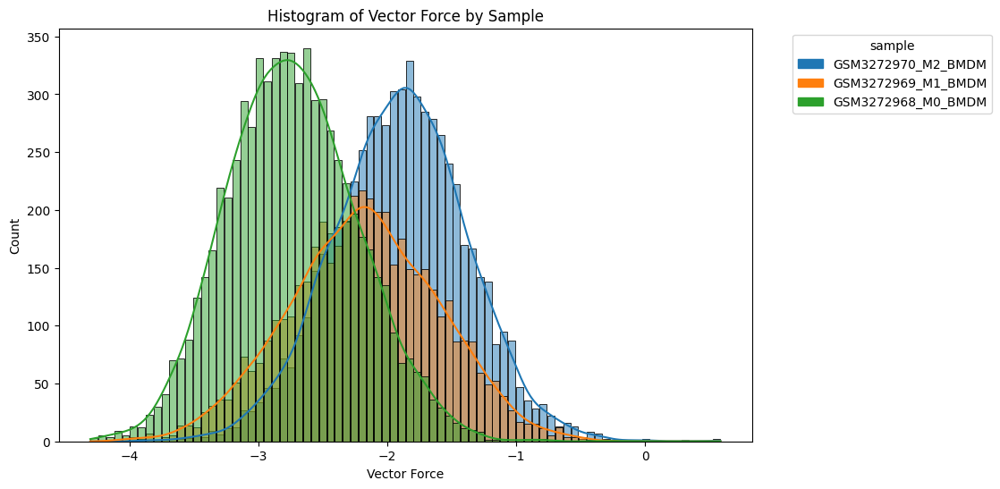

In [91]:
import matplotlib.pyplot as plt
import seaborn as sns

# vector_force 계산
dimension['vector_force'] = dimension['vector_sum'] * dimension['distance_to_center']

# 색상 팔레트 설정 (tab10 사용)
unique_classes = dimension['sample'].unique()
palette = sns.color_palette('tab10', n_colors=len(unique_classes))
color_dict = dict(zip(unique_classes, palette))

# 시각화
plt.figure(figsize=(10, 6))
sns.histplot(data=dimension, x='vector_force', hue='sample', kde=True, bins=80, palette=color_dict, shrink=0.9)

# 범례 설정
handles = [plt.Rectangle((0,0),1,1, color=color_dict[label]) for label in unique_classes]
plt.legend(handles, unique_classes, title='sample', bbox_to_anchor=(1.05, 1), loc='upper left')

plt.xlabel('Vector Force')
plt.ylabel('Count')
plt.title('Histogram of Vector Force by Sample')
plt.show()


In [92]:
dimension['celltype'] = dimension['sample'].astype(str).str[-7:]
dimension

,x,y,z,distance_to_center,vector_x,vector_y,vector_z,sample,vector_sum,vector_force,celltype
0,0.178902,-0.111930,-0.160854,1.710956,-0.334993,-0.798442,-0.100859,GSM3272970_M2_BMDM,-1.234294,-2.111822,M2_BMDM
1,0.677836,-0.144716,-0.204914,1.559877,0.163941,-0.831228,-0.144919,GSM3272970_M2_BMDM,-0.812207,-1.266942,M2_BMDM
2,0.466043,-0.164089,-0.265511,1.643001,-0.047852,-0.850601,-0.205516,GSM3272970_M2_BMDM,-1.103969,-1.813822,M2_BMDM
3,0.205931,-0.188437,-0.174697,1.765391,-0.307964,-0.874949,-0.114701,GSM3272970_M2_BMDM,-1.297614,-2.290797,M2_BMDM
4,0.284417,-0.208943,-0.129549,1.747946,-0.229478,-0.895455,-0.069554,GSM3272970_M2_BMDM,-1.194486,-2.087897,M2_BMDM
...,...,...,...,...,...,...,...,...,...,...,...
18101,-0.195173,-0.188187,-0.196268,1.984650,-0.709068,-0.874699,-0.136273,GSM3272968_M0_BMDM,-1.720040,-3.413677,M0_BMDM
18102,-0.280468,-0.156106,-0.209624,2.014401,-0.794363,-0.842618,-0.149629,GSM3272968_M0_BMDM,-1.786610,-3.598948,M0_BMDM
18103,-0.294076,-0.119591,0.052900,2.001280,-0.807971,-0.806103,0.112896,GSM3272968_M0_BMDM,-1.501178,-3.004277,M0_BMDM
18104,-0.048766,-0.162189,-0.196321,1.876613,-0.562661,-0.848701,-0.136326,GSM3272968_M0_BMDM,-1.547688,-2.904412,M0_BMDM


In [110]:
df = pd.DataFrame()
df['sample'] =dimension['celltype'].values
df['M0_BMDM_score'] = Madata.obs['M0_BMDM_score'].values 
df['M1_BDMD_score'] = Madata.obs['M1_BDMD_score'].values
df['M2_BDMD_score'] = Madata.obs['M2_BDMD_score'].values
# df['vector_force'] = dimension['vector_force'].values
df['M0_BMDM_ref_score'] = Madata.obs['M0_BMDM_ref_score'].values 
df['M1_BDMD_ref_score'] = Madata.obs['M1_BDMD_ref_score'].values
df['M2_BDMD_ref_score'] = Madata.obs['M2_BDMD_ref_score'].values
# 결과 확인

df

,sample,M0_BMDM_score,M1_BDMD_score,M2_BDMD_score,M0_BMDM_ref_score,M1_BDMD_ref_score,M2_BDMD_ref_score
0,M2_BMDM,-0.142365,-0.333340,0.234430,-0.160854,-0.111930,0.178902
1,M2_BMDM,-0.136287,-0.253102,0.862514,-0.204914,-0.144716,0.677836
2,M2_BMDM,-0.171665,-0.315289,0.419586,-0.265511,-0.164089,0.466043
3,M2_BMDM,-0.136896,-0.273577,0.107437,-0.174697,-0.188437,0.205931
4,M2_BMDM,-0.199536,-0.281258,0.562588,-0.129549,-0.208943,0.284417
...,...,...,...,...,...,...,...
18101,M0_BMDM,-0.034389,-0.321438,-0.354942,-0.196268,-0.188187,-0.195173
18102,M0_BMDM,0.062332,-0.262529,-0.298119,-0.209624,-0.156106,-0.280468
18103,M0_BMDM,0.008360,-0.294643,-0.247096,0.052900,-0.119591,-0.294076
18104,M0_BMDM,0.040917,-0.288831,-0.307436,-0.196321,-0.162189,-0.048766


(18106, 7)
테스트 정확도: 0.9989


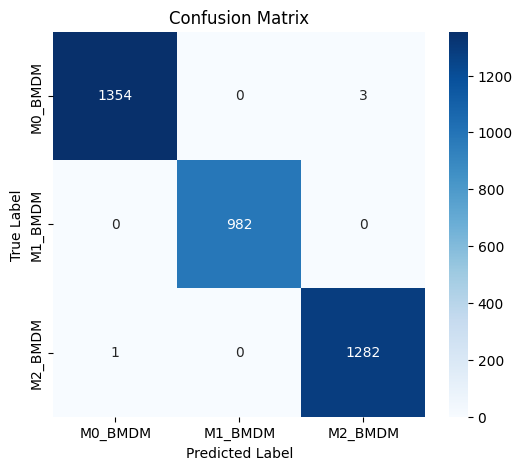

In [111]:
df_trains = df

print(df_trains.shape)
import numpy as np
import pandas as pd
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix,roc_auc_score,classification_report,roc_curve, auc
import seaborn as sns
from sklearn.metrics import classification_report
from sklearn.preprocessing import label_binarize


# 데이터 준비 (df는 예시로 데이터프레임이라고 가정)
X = df_trains.drop(columns=['sample'])  # 입력 변수
y = df_trains['sample']  # 타겟 변수

# 학습/테스트 데이터 분리
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
# RandomForest 모델 학습
clf = RandomForestClassifier(n_estimators=500, random_state=200,max_depth=10)
clf.fit(X_train, y_train)

# 예측 및 정확도 계산
y_pred = clf.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
## 5.1 정확도 출력
accuracy = accuracy_score(y_test, y_pred)
print(f"테스트 정확도: {accuracy:.4f}")

## 5.2 혼동 행렬 출력
conf_matrix = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(6, 5))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=clf.classes_, yticklabels=clf.classes_)
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Confusion Matrix')
plt.show()


🔹 Classification Report:
              precision    recall  f1-score   support

     M0_BMDM       1.00      1.00      1.00      1357
     M1_BMDM       1.00      1.00      1.00       982
     M2_BMDM       1.00      1.00      1.00      1283

    accuracy                           1.00      3622
   macro avg       1.00      1.00      1.00      3622
weighted avg       1.00      1.00      1.00      3622



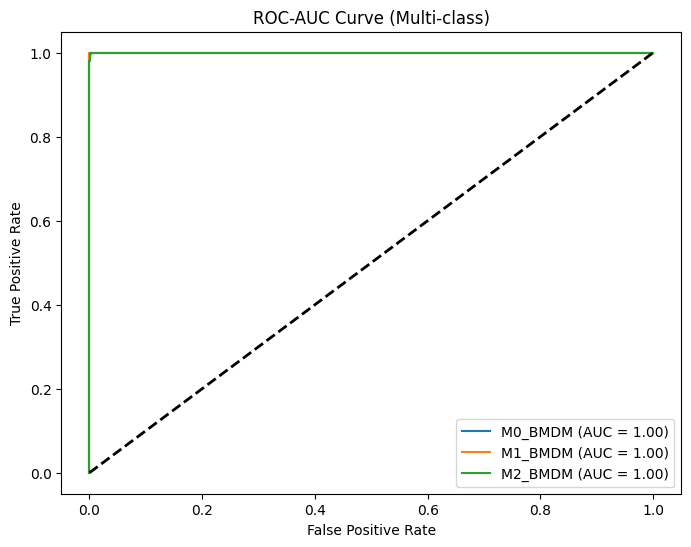

Text(0.5, 1.0, 'Top 20 Feature Importances')

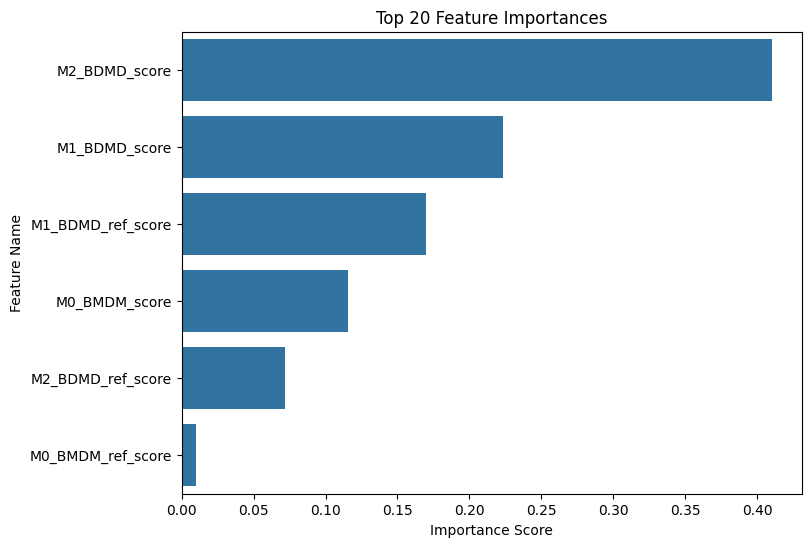

In [112]:
# 5.2 정밀도, 재현율, F1 점수 출력
print("🔹 Classification Report:")
print(classification_report(y_test, y_pred))

y_test_binarized = label_binarize(y_test, classes=clf.classes_)  # 다중 클래스 원핫 인코딩
y_pred_proba = clf.predict_proba(X_test)
roc_auc_scores = roc_auc_score(y_test_binarized, y_pred_proba, average=None)

plt.figure(figsize=(8, 6))
for i, class_label in enumerate(clf.classes_):
    fpr, tpr, _ = roc_curve(y_test_binarized[:, i], y_pred_proba[:, i])
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, label=f"{class_label} (AUC = {roc_auc:.2f})")

plt.plot([0, 1], [0, 1], 'k--', lw=2)  # 대각선 기준선
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC-AUC Curve (Multi-class)')
plt.legend()
plt.show()

## 5.5 Feature Importance (특성 중요도 시각화)
feature_importance = pd.Series(clf.feature_importances_, index=X.columns).sort_values(ascending=False)
plt.figure(figsize=(8, 6))
sns.barplot(x=feature_importance.values[:20], y=feature_importance.index[:20])  # 상위 20개만 표시
plt.xlabel("Importance Score")
plt.ylabel("Feature Name")
plt.title("Top 20 Feature Importances")

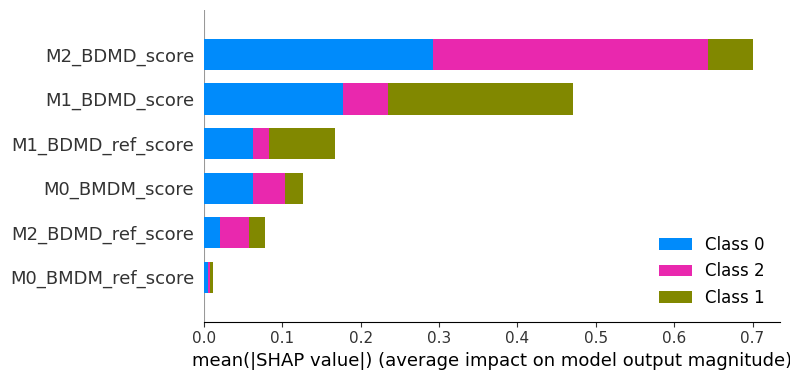

In [113]:
import shap

explainer = shap.TreeExplainer(clf)
shap_values = explainer.shap_values(X_test)

shap.summary_plot(shap_values, X_test, plot_type="bar")  # 클래스별 Feature Importance 비교

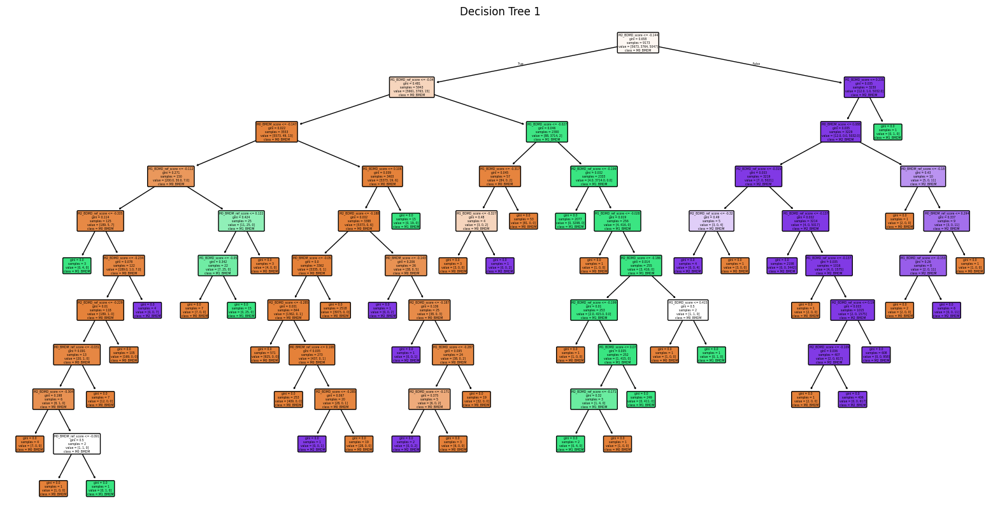

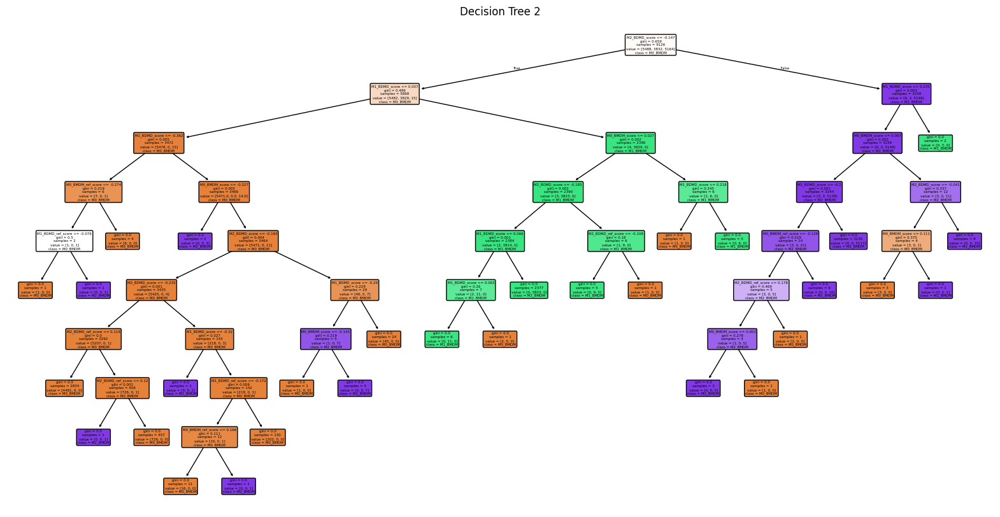

Fontsize 0.98 < 1.0 pt not allowed by FreeType. Setting fontsize = 1 pt
Fontsize 0.98 < 1.0 pt not allowed by FreeType. Setting fontsize = 1 pt
Fontsize 0.98 < 1.0 pt not allowed by FreeType. Setting fontsize = 1 pt
Fontsize 0.98 < 1.0 pt not allowed by FreeType. Setting fontsize = 1 pt
Fontsize 0.98 < 1.0 pt not allowed by FreeType. Setting fontsize = 1 pt
Fontsize 0.98 < 1.0 pt not allowed by FreeType. Setting fontsize = 1 pt
Fontsize 0.98 < 1.0 pt not allowed by FreeType. Setting fontsize = 1 pt
Fontsize 0.98 < 1.0 pt not allowed by FreeType. Setting fontsize = 1 pt
Fontsize 0.98 < 1.0 pt not allowed by FreeType. Setting fontsize = 1 pt
Fontsize 0.98 < 1.0 pt not allowed by FreeType. Setting fontsize = 1 pt
Fontsize 0.98 < 1.0 pt not allowed by FreeType. Setting fontsize = 1 pt
Fontsize 0.98 < 1.0 pt not allowed by FreeType. Setting fontsize = 1 pt
Fontsize 0.98 < 1.0 pt not allowed by FreeType. Setting fontsize = 1 pt
Fontsize 0.98 < 1.0 pt not allowed by FreeType. Setting fontsize

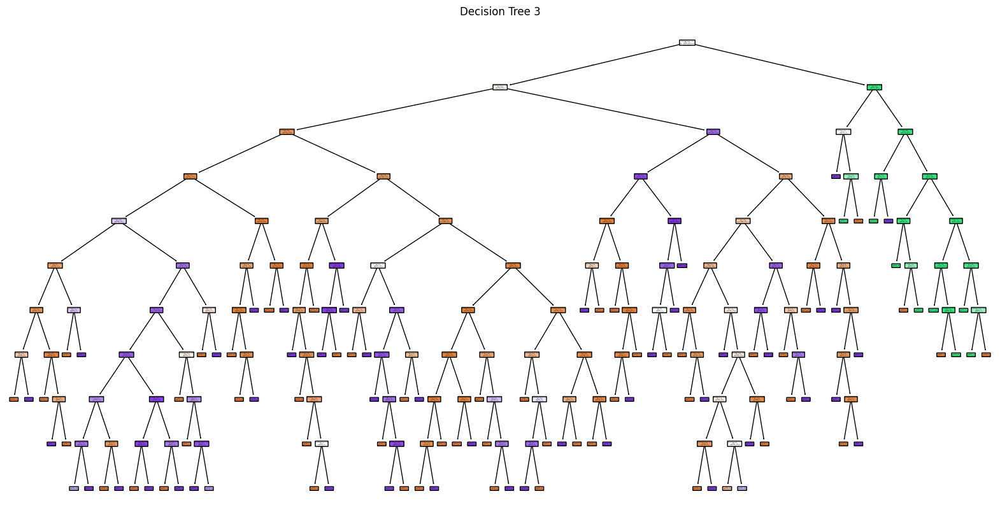

In [114]:
import matplotlib.pyplot as plt
from sklearn.tree import plot_tree

# 첫 번째 트리 시각화
plt.figure(figsize=(20, 10))
plot_tree(clf.estimators_[0], filled=True, feature_names=X_train.columns, class_names=clf.classes_, rounded=True)
plt.title('Decision Tree 1')
plt.show()

# 두 번째 트리 시각화
plt.figure(figsize=(20, 10))
plot_tree(clf.estimators_[1], filled=True, feature_names=X_train.columns, class_names=clf.classes_, rounded=True)
plt.title('Decision Tree 2')
plt.show()

# 세 번째 트리 시각화
plt.figure(figsize=(20, 10))
plot_tree(clf.estimators_[2], filled=True, feature_names=X_train.columns, class_names=clf.classes_, rounded=True)
plt.title('Decision Tree 3')
plt.show()


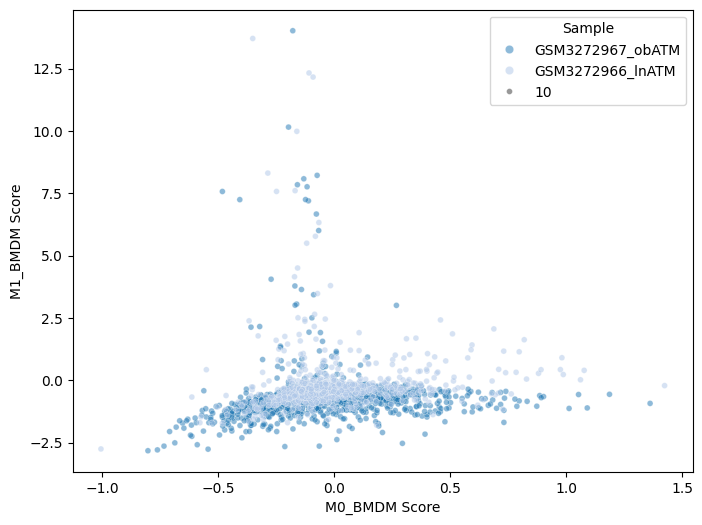

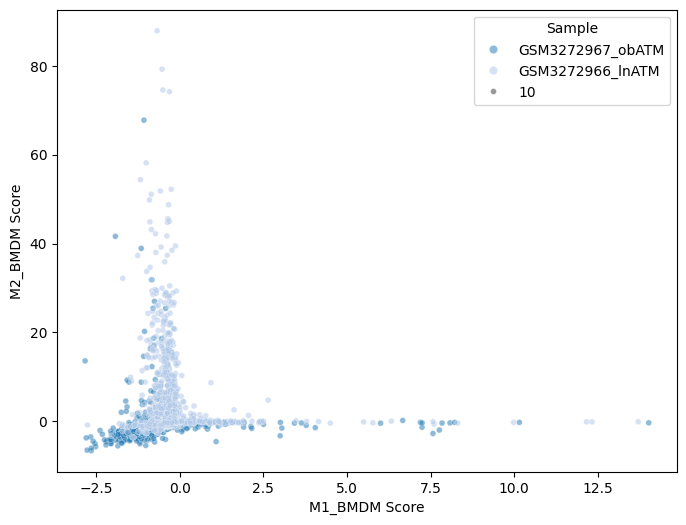

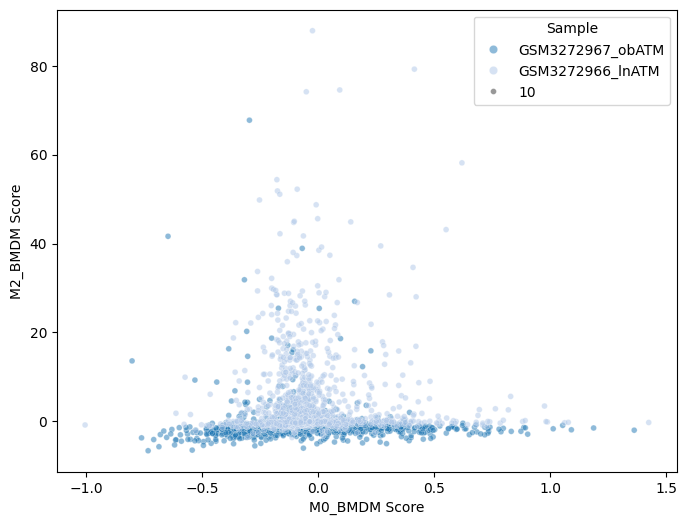

In [115]:
import scanpy as sc
sc.tl.score_genes(Padata, gene_list=M0_BMDM, score_name='M0_BMDM_score')
sc.tl.score_genes(Padata, gene_list=M1_BDMD, score_name='M1_BDMD_score')
sc.tl.score_genes(Padata, gene_list=M2_BDMD, score_name='M2_BDMD_score')


plt.figure(figsize=(8, 6))
sns.scatterplot(x='M0_BMDM_score', y='M1_BDMD_score', hue='sample', data=Padata.obs, palette='tab20', alpha=0.5, size=10)
plt.xlabel('M0_BMDM Score')
plt.ylabel('M1_BMDM Score')
plt.legend(title='Sample')
plt.show()

plt.figure(figsize=(8, 6))
sns.scatterplot(x='M1_BDMD_score', y='M2_BDMD_score', hue='sample', data=Padata.obs, palette='tab20', alpha=0.5, size=10)
plt.xlabel('M1_BMDM Score')
plt.ylabel('M2_BMDM Score')
plt.legend(title='Sample')
plt.show()

plt.figure(figsize=(8, 6))
sns.scatterplot(x='M0_BMDM_score', y='M2_BDMD_score', hue='sample', data=Padata.obs, palette='tab20', alpha=0.5, size=10)
plt.xlabel('M0_BMDM Score')
plt.ylabel('M2_BMDM Score')
plt.legend(title='Sample')
plt.show()

In [116]:
Padata.obs

,sample,batch,M0_BMDM_score,M1_BDMD_score,M2_BDMD_score,M2_BDMD_ref_score,M1_BDMD_ref_score,M0_BMDM_ref_score
GSM3272967_obATM_AAACCTGCACCTATCC-1,GSM3272967_obATM,Predict,-0.325000,-0.924444,-0.065000,-0.853333,0.102857,0.860000
GSM3272967_obATM_AAACCTGCAGCCAATT-1,GSM3272967_obATM,Predict,-0.085000,-0.288889,-0.682500,-0.276667,0.022857,-0.057778
GSM3272967_obATM_AAACCTGGTAAGGATT-1,GSM3272967_obATM,Predict,0.119167,-0.297778,-0.835833,-0.360000,-0.140000,0.412222
GSM3272967_obATM_AAACCTGGTCAGAAGC-1,GSM3272967_obATM,Predict,-0.076667,-0.613333,-0.897500,-0.846667,-0.251429,0.052222
GSM3272967_obATM_AAACCTGTCCAGGGCT-1,GSM3272967_obATM,Predict,0.175833,-0.375556,-0.785000,-0.610000,-0.177143,0.396667
...,...,...,...,...,...,...,...,...
GSM3272966_lnATM_TTTGCGCCACACATGT-1,GSM3272966_lnATM,Predict,-0.097500,-0.355556,-0.410833,-0.490000,-0.137143,-0.261111
GSM3272966_lnATM_TTTGGTTCAGGAATGC-1,GSM3272966_lnATM,Predict,-0.037500,-0.100000,-0.096667,-0.120000,-0.054286,0.011111
GSM3272966_lnATM_TTTGGTTTCCGCGTTT-1,GSM3272966_lnATM,Predict,-0.035000,-0.153333,-0.045000,-0.256667,0.057143,-0.152222
GSM3272966_lnATM_TTTGTCACATGCAACT-1,GSM3272966_lnATM,Predict,0.764167,-0.546667,2.801667,-0.593333,-0.194286,-0.540000


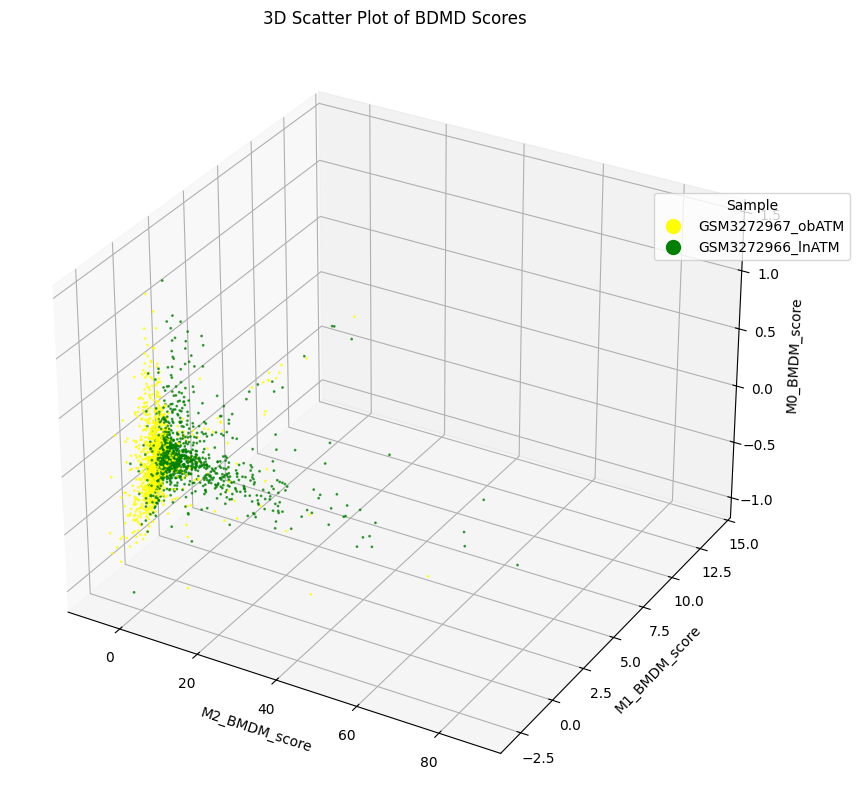

In [117]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from mpl_toolkits.mplot3d import Axes3D

# 3D 데이터 추출
x = Padata.obs['M2_BDMD_score'] 
y = Padata.obs['M1_BDMD_score'] 
z = Padata.obs['M0_BMDM_score']

# 샘플 그룹 정보 (컬러링 용도) - 문자열로 변환
samples = Padata.obs['sample'].astype(str)

# 색상 지정 (샘플별 컬러링)
unique_samples = samples.unique()
palette = sns.color_palette("tab10", len(unique_samples))
color_map = {
    'GSM3272967_obATM': 'yellow',  # 파랑색
    'GSM3272966_lnATM': 'green', # 녹색
}
colors = samples.map(color_map)  # Categorical 대응 완료!

# 3D 플롯 생성
fig = plt.figure(figsize=(16, 10))
ax = fig.add_subplot(111, projection='3d')

# 산점도 플로팅
sc = ax.scatter(x, y, z, c=colors, alpha=0.7 , s = 1)

ax.set_ylabel('M1_BMDM_score')
ax.set_zlabel('M0_BMDM_score')
ax.set_xlabel('M2_BMDM_score')
ax.set_title('3D Scatter Plot of BDMD Scores')
# 범례 추가
handles = [plt.Line2D([0], [0], marker='o', color=color_map[sample], linestyle='', markersize=10) 
           for sample in unique_samples]
ax.legend(handles, unique_samples, title="Sample", bbox_to_anchor=(1.1, 0.8))

plt.show()


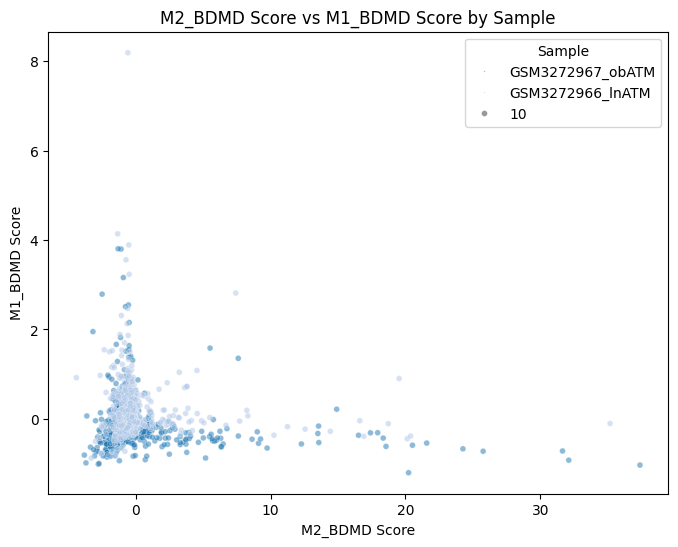

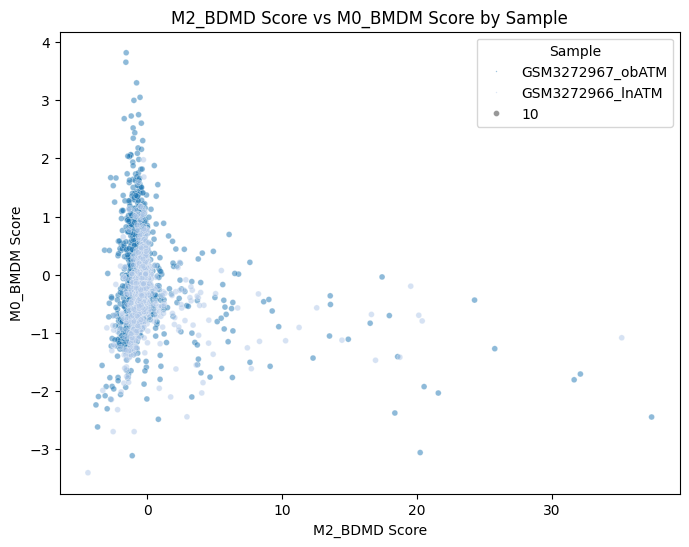

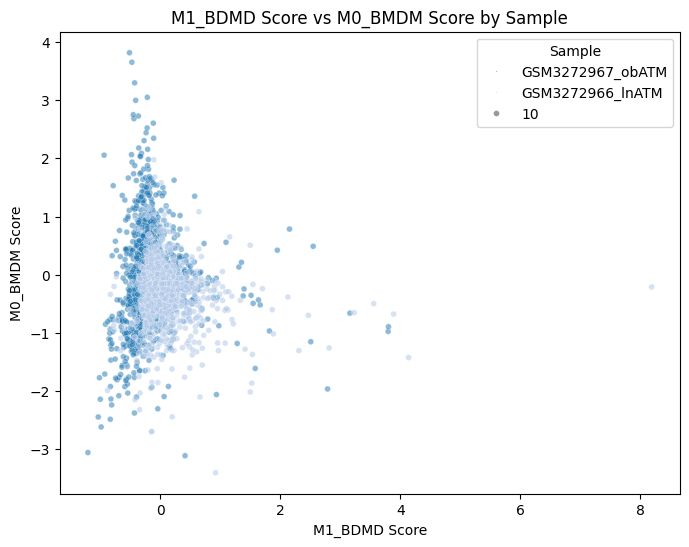

In [118]:
import matplotlib.pyplot as plt
from itertools import combinations
import seaborn as sns
import scanpy as sc

# M0_BMDM_ref = ["SH2D3C", "SLC13A3", "RCAN1", "VSIR", "TP53INP1", "NR1D2", "FCGRT","SLC40A1", "NFXL1", "IL16"]
# M1_BDMD_ref = ["CD38", "CFB", "SLFN12L", "HLA-A", "FPR1", "SLFN11", "GPR18", "CCRL2","FPR2", "CXCL10"]
# M2_BMDM_ref = ["PTGS1", "EGR2", "OLFM1", "FLRT2", "P2RY1", "VWF", "BCAR3", "IL6ST", "TANC2", "MMP12"]



# Xadata.var_names의 유전자명들을 첫 글자만 대문자로 변환
var_names_capitalized = [gene.capitalize() for gene in Padata.var_names]

def filter_existing_genes(gene_list):
    return [gene for gene in gene_list if gene.capitalize() in var_names_capitalized]

# 비교할 조합 설정
comparisons = [("M2_BDMD", M2_BMDM_ref), ("M1_BDMD", M1_BDMD_ref), ("M0_BMDM", M0_BMDM_ref)]
for (name1, genes1), (name2, genes2) in combinations(comparisons, 2):
    existing_genes1 = filter_existing_genes(genes1)
    existing_genes2 = filter_existing_genes(genes2)
    
    sc.tl.score_genes(Padata, gene_list=existing_genes1, score_name=f'{name1}_ref_score')
    sc.tl.score_genes(Padata, gene_list=existing_genes2, score_name=f'{name2}_ref_score')
    
    plt.figure(figsize=(8, 6))
    sns.scatterplot(x=f'{name1}_ref_score', y=f'{name2}_ref_score', hue='sample', data=Padata.obs, palette='tab20', alpha=0.5, size=10, s = 1)
    
    plt.title(f'{name1} Score vs {name2} Score by Sample')
    plt.xlabel(f'{name1} Score')
    plt.ylabel(f'{name2} Score')
    plt.legend(title='Sample')
    plt.show()

In [119]:
Padata.obs['sample'].unique()

array(['GSM3272967_obATM', 'GSM3272966_lnATM'], dtype=object)

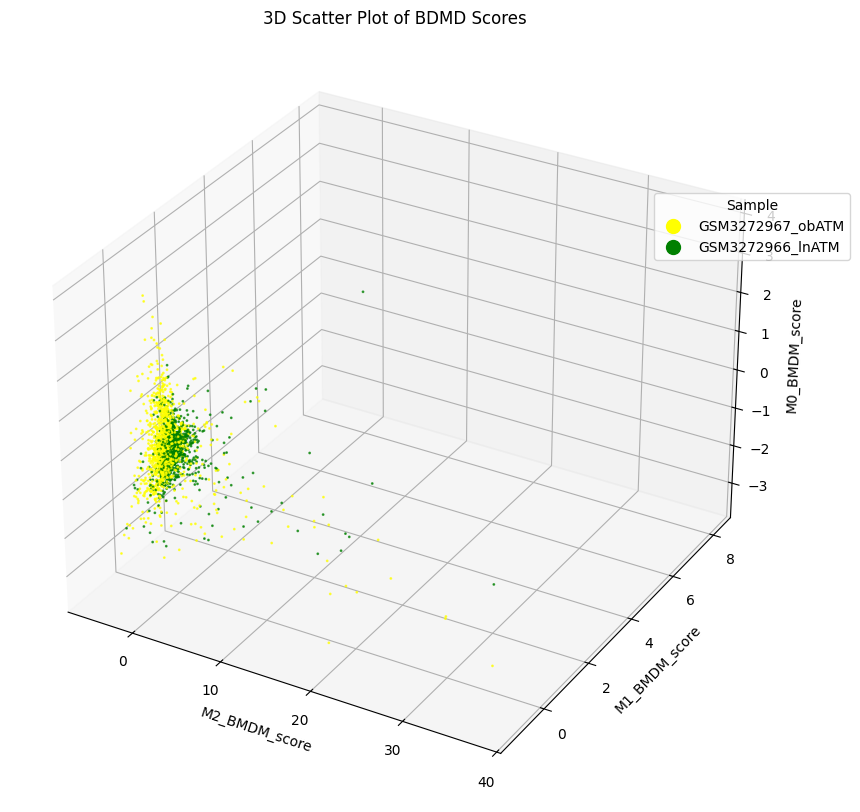

In [120]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from mpl_toolkits.mplot3d import Axes3D

# 3D 데이터 추출
x = Padata.obs['M2_BDMD_ref_score'] 
y = Padata.obs['M1_BDMD_ref_score'] 
z = Padata.obs['M0_BMDM_ref_score']

# 샘플 그룹 정보 (컬러링 용도) - 문자열로 변환
samples = Padata.obs['sample'].astype(str)

# 색상 지정 (샘플별 컬러링)
unique_samples = samples.unique()
palette = sns.color_palette("tab10", len(unique_samples))
color_map = {
    'GSM3272967_obATM': 'yellow',  # 파랑색
    'GSM3272966_lnATM': 'green', # 녹색
}
colors = samples.map(color_map)  # Categorical 대응 완료!

# 3D 플롯 생성
fig = plt.figure(figsize=(16, 10))
ax = fig.add_subplot(111, projection='3d')

# 산점도 플로팅
sc = ax.scatter(x, y, z, c=colors, alpha=0.7 , s = 1)

ax.set_ylabel('M1_BMDM_score')
ax.set_zlabel('M0_BMDM_score')
ax.set_xlabel('M2_BMDM_score')
ax.set_title('3D Scatter Plot of BDMD Scores')
# 범례 추가
handles = [plt.Line2D([0], [0], marker='o', color=color_map[sample], linestyle='', markersize=10) 
           for sample in unique_samples]
ax.legend(handles, unique_samples, title="Sample", bbox_to_anchor=(1.1, 0.8))

plt.show()


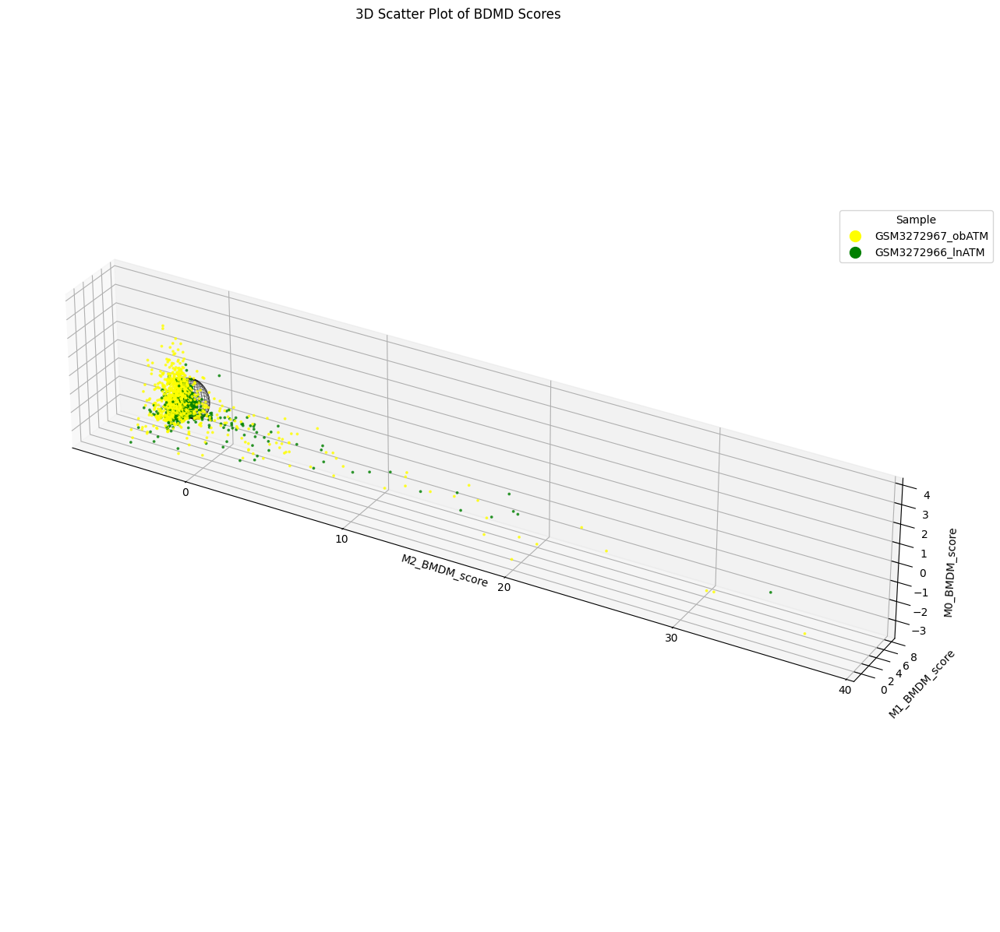

In [121]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from mpl_toolkits.mplot3d import Axes3D

# 3D 데이터 추출
x = Padata.obs['M2_BDMD_ref_score'] 
y = Padata.obs['M1_BDMD_ref_score'] 
z = Padata.obs['M0_BMDM_ref_score']

# 샘플 그룹 정보 (컬러링 용도) - 문자열로 변환
samples = Padata.obs['sample'].astype(str)

# 색상 지정 (샘플별 컬러링)
unique_samples = samples.unique()
palette = sns.color_palette("tab10", len(unique_samples))
color_map = {
    'GSM3272967_obATM': 'yellow',  # 파랑색
    'GSM3272966_lnATM': 'green', # 녹색
}
colors = samples.map(color_map)  # Categorical 대응 완료!

# 3D 플롯 생성
fig = plt.figure(figsize=(15, 15))
ax = fig.add_subplot(111, projection='3d')

# 산점도 플로팅
sc = ax.scatter(x, y, z, c=colors, alpha=0.7 , s = 3)

ax.set_ylabel('M1_BMDM_score')
ax.set_zlabel('M0_BMDM_score')
ax.set_xlabel('M2_BMDM_score')
ax.set_title('3D Scatter Plot of BDMD Scores')

# === 구 파라미터 정의 ===
center = np.array([0.0858, -0.0872, 0.2342])
radius = np.sqrt(1.1249)

# 구의 표면 좌표 생성
u = np.linspace(0, 2 * np.pi, 30)
v = np.linspace(0, np.pi, 20)
x_sphere = center[0] + radius * np.outer(np.cos(u), np.sin(v))
y_sphere = center[1] + radius * np.outer(np.sin(u), np.sin(v))
z_sphere = center[2] + radius * np.outer(np.ones(np.size(u)), np.cos(v))

# 구의 wireframe 플로팅
ax.plot_wireframe(x_sphere, y_sphere, z_sphere, color='black', alpha=0.4, linewidth=0.5)

# 범례 추가
handles = [plt.Line2D([0], [0], marker='o', color=color_map[sample], linestyle='', markersize=10) 
           for sample in unique_samples]
ax.legend(handles, unique_samples, title="Sample", bbox_to_anchor=(1.1, 0.8))
ax.set_box_aspect([100, 10, 20])
plt.show()


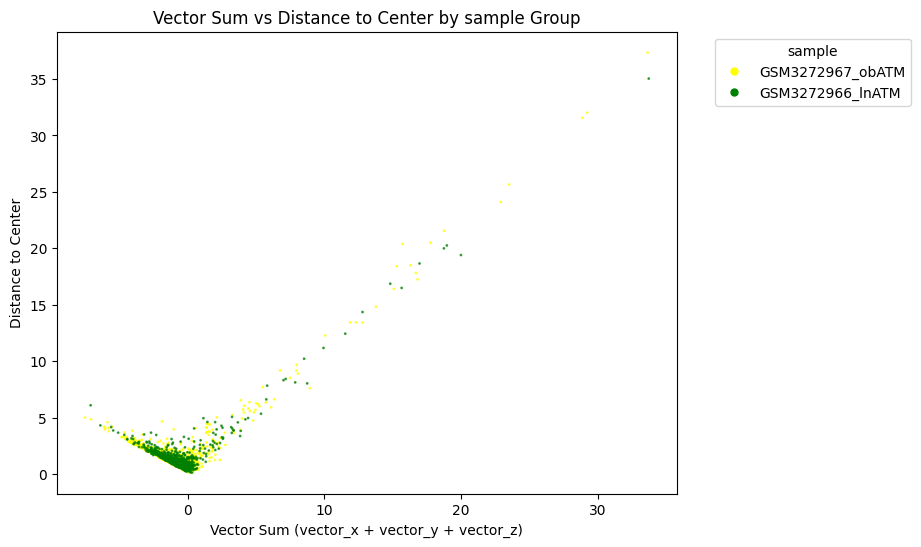

[ 0.0858 -0.0872  0.2342]


In [122]:
points = np.vstack((x, y, z)).T
vectors = points - center  # 구의 중심에서 각 점까지의 벡터
distances_to_center = np.linalg.norm(vectors, axis=1)  # 구의 중심에서 각 점까지의 거리

Pdimension = pd.DataFrame({
    'x': x,
    'y': y,
    'z': z,
    'distance_to_center': distances_to_center,
    'vector_x': vectors[:, 0],
    'vector_y': vectors[:, 1],
    'vector_z': vectors[:, 2],
})

Pdimension['vector_sum'] = Pdimension['vector_x'] + Pdimension['vector_y'] + Pdimension['vector_z']

# 구의 중심을 계산 (dimension 객체에서 중간값으로 설정)
# center = np.array([0, 0, 0]) 

# 각 점에서 구의 중심까지의 거리 계산
Pdimension['distance_to_center'] = np.linalg.norm(
    np.vstack((Pdimension['vector_x'], Pdimension['vector_y'], Pdimension['vector_z'])).T - center, axis=1)


# colors = Pdimension['sample'].map(color_map)

# 시각화
plt.figure(figsize=(8, 6))
scatter = plt.scatter(Pdimension['vector_sum'], Pdimension['distance_to_center'], c=colors, alpha=0.7, s = 1)

# 축 및 제목 설정
plt.xlabel('Vector Sum (vector_x + vector_y + vector_z)')
plt.ylabel('Distance to Center')
plt.title('Vector Sum vs Distance to Center by sample Group')

# 범례 설정
handles = [plt.Line2D([0], [0], marker='o', color=color_map[label], linestyle='', markersize=5) 
           for label in color_map]
plt.legend(handles, color_map.keys(), title="sample", bbox_to_anchor=(1.05, 1))

plt.show()
print(center)

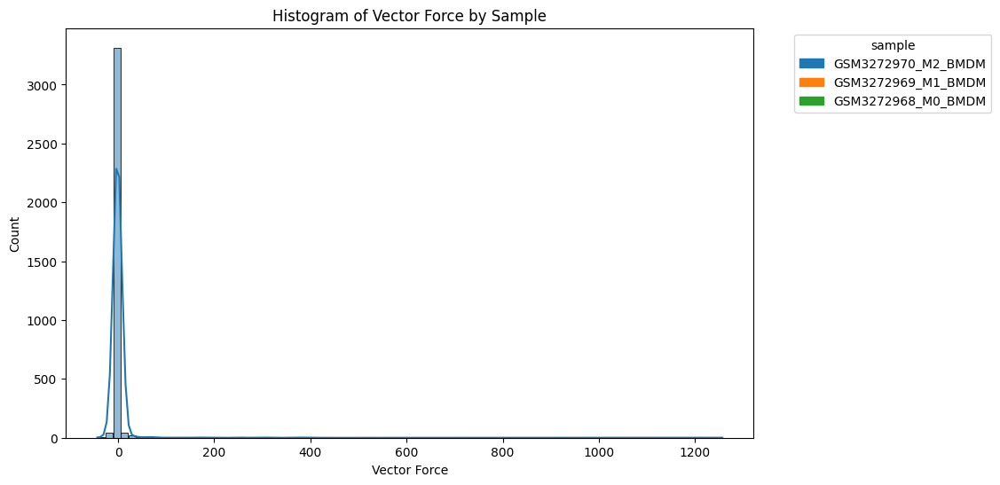

In [123]:
import matplotlib.pyplot as plt
import seaborn as sns

# vector_force 계산
Pdimension['vector_force'] = Pdimension['vector_sum'] * Pdimension['distance_to_center']


# 시각화
plt.figure(figsize=(10, 6))
sns.histplot(data=Pdimension, x='vector_force', kde=True, bins=80, palette=color_dict, shrink=0.9)

# 범례 설정
handles = [plt.Rectangle((0,0),1,1, color=color_dict[label]) for label in unique_classes]
plt.legend(handles, unique_classes, title='sample', bbox_to_anchor=(1.05, 1), loc='upper left')

plt.xlabel('Vector Force')
plt.ylabel('Count')
plt.title('Histogram of Vector Force by Sample')
plt.show()


In [124]:
Padata.obs

,sample,batch,M0_BMDM_score,M1_BDMD_score,M2_BDMD_score,M2_BDMD_ref_score,M1_BDMD_ref_score,M0_BMDM_ref_score
GSM3272967_obATM_AAACCTGCACCTATCC-1,GSM3272967_obATM,Predict,-0.325000,-0.924444,-0.065000,-0.853333,0.102857,0.860000
GSM3272967_obATM_AAACCTGCAGCCAATT-1,GSM3272967_obATM,Predict,-0.085000,-0.288889,-0.682500,-0.276667,0.022857,-0.057778
GSM3272967_obATM_AAACCTGGTAAGGATT-1,GSM3272967_obATM,Predict,0.119167,-0.297778,-0.835833,-0.360000,-0.140000,0.412222
GSM3272967_obATM_AAACCTGGTCAGAAGC-1,GSM3272967_obATM,Predict,-0.076667,-0.613333,-0.897500,-0.846667,-0.251429,0.052222
GSM3272967_obATM_AAACCTGTCCAGGGCT-1,GSM3272967_obATM,Predict,0.175833,-0.375556,-0.785000,-0.610000,-0.177143,0.396667
...,...,...,...,...,...,...,...,...
GSM3272966_lnATM_TTTGCGCCACACATGT-1,GSM3272966_lnATM,Predict,-0.097500,-0.355556,-0.410833,-0.490000,-0.137143,-0.261111
GSM3272966_lnATM_TTTGGTTCAGGAATGC-1,GSM3272966_lnATM,Predict,-0.037500,-0.100000,-0.096667,-0.120000,-0.054286,0.011111
GSM3272966_lnATM_TTTGGTTTCCGCGTTT-1,GSM3272966_lnATM,Predict,-0.035000,-0.153333,-0.045000,-0.256667,0.057143,-0.152222
GSM3272966_lnATM_TTTGTCACATGCAACT-1,GSM3272966_lnATM,Predict,0.764167,-0.546667,2.801667,-0.593333,-0.194286,-0.540000


In [125]:
predict = pd.DataFrame()

predict['M0_BMDM_score'] = Padata.obs['M0_BMDM_score'].values 
predict['M1_BDMD_score'] = Padata.obs['M1_BDMD_score'].values
predict['M2_BDMD_score'] = Padata.obs['M2_BDMD_score'].values
# predict['vector_force'] = Pdimension['vector_force'].values
predict['M0_BMDM_ref_score'] = Padata.obs['M0_BMDM_ref_score'].values 
predict['M1_BDMD_ref_score'] = Padata.obs['M1_BDMD_ref_score'].values
predict['M2_BDMD_ref_score'] = Padata.obs['M2_BDMD_ref_score'].values
predict

,M0_BMDM_score,M1_BDMD_score,M2_BDMD_score,M0_BMDM_ref_score,M1_BDMD_ref_score,M2_BDMD_ref_score
0,-0.325000,-0.924444,-0.065000,0.860000,0.102857,-0.853333
1,-0.085000,-0.288889,-0.682500,-0.057778,0.022857,-0.276667
2,0.119167,-0.297778,-0.835833,0.412222,-0.140000,-0.360000
3,-0.076667,-0.613333,-0.897500,0.052222,-0.251429,-0.846667
4,0.175833,-0.375556,-0.785000,0.396667,-0.177143,-0.610000
...,...,...,...,...,...,...
3463,-0.097500,-0.355556,-0.410833,-0.261111,-0.137143,-0.490000
3464,-0.037500,-0.100000,-0.096667,0.011111,-0.054286,-0.120000
3465,-0.035000,-0.153333,-0.045000,-0.152222,0.057143,-0.256667
3466,0.764167,-0.546667,2.801667,-0.540000,-0.194286,-0.593333


In [126]:
# adata.X를 DataFrame으로 변환
prediction = clf.predict(predict)
prediction_series = pd.Series(prediction)

prediction_series.value_counts()


M0_BMDM    2227
M2_BMDM    1108
M1_BMDM     133
Name: count, dtype: int64

In [127]:
prediction = clf.predict(predict)
proba = clf.predict_proba(predict)
Padata.obs["M0_prob"] = proba[:, 0]  # 첫 번째 열 (M1 확률)
Padata.obs["M1_prob"] = proba[:, 1]  # 두 번째 열 (M2 확률)
Padata.obs["M2_prob"] = proba[:, 2]  # 두 번째 열 (M2 확률)
Padata.obs['predict'] = prediction_series.values
Padata.obs

,sample,batch,M0_BMDM_score,M1_BDMD_score,M2_BDMD_score,M2_BDMD_ref_score,M1_BDMD_ref_score,M0_BMDM_ref_score,M0_prob,M1_prob,M2_prob,predict
GSM3272967_obATM_AAACCTGCACCTATCC-1,GSM3272967_obATM,Predict,-0.325000,-0.924444,-0.065000,-0.853333,0.102857,0.860000,0.138000,0.036000,0.826000,M2_BMDM
GSM3272967_obATM_AAACCTGCAGCCAATT-1,GSM3272967_obATM,Predict,-0.085000,-0.288889,-0.682500,-0.276667,0.022857,-0.057778,0.944036,0.026000,0.029964,M0_BMDM
GSM3272967_obATM_AAACCTGGTAAGGATT-1,GSM3272967_obATM,Predict,0.119167,-0.297778,-0.835833,-0.360000,-0.140000,0.412222,0.991946,0.004000,0.004054,M0_BMDM
GSM3272967_obATM_AAACCTGGTCAGAAGC-1,GSM3272967_obATM,Predict,-0.076667,-0.613333,-0.897500,-0.846667,-0.251429,0.052222,0.915960,0.000000,0.084040,M0_BMDM
GSM3272967_obATM_AAACCTGTCCAGGGCT-1,GSM3272967_obATM,Predict,0.175833,-0.375556,-0.785000,-0.610000,-0.177143,0.396667,0.997228,0.000000,0.002772,M0_BMDM
...,...,...,...,...,...,...,...,...,...,...,...,...
GSM3272966_lnATM_TTTGCGCCACACATGT-1,GSM3272966_lnATM,Predict,-0.097500,-0.355556,-0.410833,-0.490000,-0.137143,-0.261111,0.974337,0.002042,0.023621,M0_BMDM
GSM3272966_lnATM_TTTGGTTCAGGAATGC-1,GSM3272966_lnATM,Predict,-0.037500,-0.100000,-0.096667,-0.120000,-0.054286,0.011111,0.392984,0.002000,0.605016,M2_BMDM
GSM3272966_lnATM_TTTGGTTTCCGCGTTT-1,GSM3272966_lnATM,Predict,-0.035000,-0.153333,-0.045000,-0.256667,0.057143,-0.152222,0.109787,0.004000,0.886213,M2_BMDM
GSM3272966_lnATM_TTTGTCACATGCAACT-1,GSM3272966_lnATM,Predict,0.764167,-0.546667,2.801667,-0.593333,-0.194286,-0.540000,0.171978,0.000000,0.828022,M2_BMDM


In [128]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# Final_pred 기준으로 데이터프레임 4개로 분리 후 정렬
df_M0 = Padata.obs[Padata.obs["predict"] == "M0_BMDM"].sort_values(by="M0_prob", ascending=False)
df_M1 = Padata.obs[Padata.obs["predict"] == "M1_BMDM"].sort_values(by="M1_prob", ascending=False)
df_M2 = Padata.obs[Padata.obs["predict"] == "M2_BMDM"].sort_values(by="M2_prob", ascending=False)
# df_Other = Padata.obs[Padata.obs["predict"] == "Other"]

# 4개 그룹을 다시 합치기
Padata_sorted = pd.concat([df_M0, df_M1, df_M2, df_Other], ignore_index=True)

# Stacked Bar Plot 그리기
fig, ax = plt.subplots(figsize=(25, 5))

# 각 퍼센티지 값
M0_values = Padata_sorted["M0_prob"]
M1_values = Padata_sorted["M1_prob"]
M2_values = Padata_sorted["M2_prob"]

# X축 인덱스
x = np.arange(len(Padata_sorted))

# 각 그룹에 따라 'bottom' 값을 다르게 설정
for i, row in Padata_sorted.iterrows():
    # 그룹별로 'bottom' 설정하기
    if row["predict"] == "M0_BMDM":
        # label은 첫 번째로 그릴 때만 추가
        ax.bar(x[i], row["M0_prob"], color="blue", bottom=0, label="M0_prob" if i == 0 else "")  # M0_prob는 바닥
        ax.bar(x[i], row["M1_prob"], color="red", bottom=row["M0_prob"], label="M1_prob" if i == 0 else "")  # M1_prob는 M0_prob 위에
        ax.bar(x[i], row["M2_prob"], color="green", bottom=row["M0_prob"] + row["M1_prob"], label="M2_prob" if i == 0 else "")  # M2_prob는 M0_prob + M1_prob 위에
    elif row["predict"] == "M1_BMDM":
        # label은 첫 번째로 그릴 때만 추가
        ax.bar(x[i], row["M1_prob"], color="red", bottom=0, label="M1_prob" if i == 0 else "")  # M1_prob는 바닥
        ax.bar(x[i], row["M0_prob"], color="blue", bottom=row["M1_prob"], label="M0_prob" if i == 0 else "")  # M0_prob는 M1_prob 위에
        ax.bar(x[i], row["M2_prob"], color="green", bottom=row["M0_prob"] + row["M1_prob"], label="M2_prob" if i == 0 else "")  # M2_prob는 M0_prob + M1_prob 위에
    elif row["predict"] == "M2_BMDM":
        # label은 첫 번째로 그릴 때만 추가
        ax.bar(x[i], row["M2_prob"], color="green", bottom=0, label="M2_prob" if i == 0 else "")  # M2_prob는 바닥
        ax.bar(x[i], row["M0_prob"], color="blue", bottom=row["M2_prob"], label="M0_prob" if i == 0 else "")  # M0_prob는 M2_prob 위에
        ax.bar(x[i], row["M1_prob"], color="red", bottom=row["M0_prob"] + row["M2_prob"], label="M1_prob" if i == 0 else "")  # M1_prob는 M0_prob + M2_prob 위에
    else:
        # Other 그룹의 경우 별도로 처리
        ax.bar(x[i], row["M0_prob"], color="blue", bottom=0, label="M0_prob" if i == 0 else "")
        ax.bar(x[i], row["M1_prob"], color="red", bottom=row["M0_prob"], label="M1_prob" if i == 0 else "")
        ax.bar(x[i], row["M2_prob"], color="green", bottom=row["M0_prob"] + row["M1_prob"], label="M2_prob" if i == 0 else "")

# 그래프 설정
ax.set_xlabel("Samples")
ax.set_ylabel("Probability")
ax.set_title("Stacked Bar Plot of M0, M1, M2 Probabilities")

# 범례 설정
handles, labels = ax.get_legend_handles_labels()
ax.legend(handles[:3], labels[:3])  # 첫 번째 3개의 범례만 표시 (M0_prob, M1_prob, M2_prob)

# X축 숨기기 (샘플이 많으면 보기 어려우므로)
ax.set_xticks([])

plt.show()


NameError: name 'df_Other' is not defined

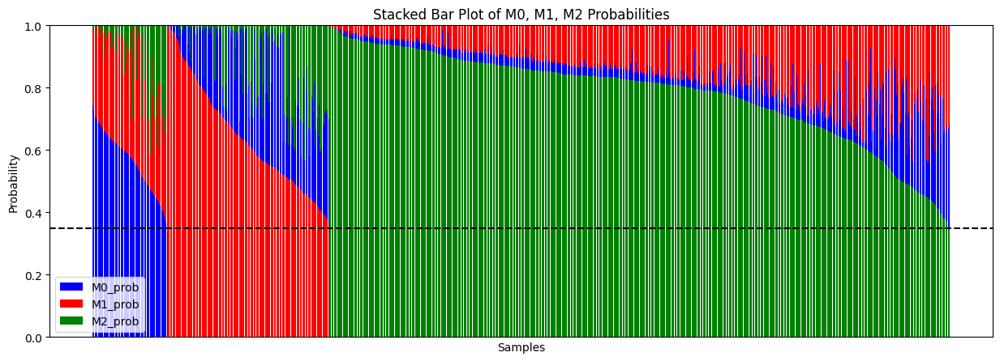

In [171]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# Final_pred 기준으로 데이터프레임 4개로 분리 후 정렬
df_M0 = Xadata.obs[Xadata.obs["predict"] == "M0_BMDM"].sort_values(by="M0_prob", ascending=False)
df_M1 = Xadata.obs[Xadata.obs["predict"] == "M1_BDMD"].sort_values(by="M1_prob", ascending=False)
df_M2 = Xadata.obs[Xadata.obs["predict"] == "M2_BDMD"].sort_values(by="M2_prob", ascending=False)
df_Other = Xadata.obs[Xadata.obs["predict"] == "Other"]  # Other는 정렬 없이 그대로 사용

# 4개 그룹을 다시 합치기
Xadata_sorted = pd.concat([df_M0, df_M1, df_M2, df_Other], ignore_index=True)

# Stacked Bar Plot 그리기
fig, ax = plt.subplots(figsize=(15, 5))

# 각 퍼센티지 값
M0_values = Xadata_sorted["M0_prob"]
M1_values = Xadata_sorted["M1_prob"]
M2_values = Xadata_sorted["M2_prob"]

# X축 인덱스
x = np.arange(len(Xadata_sorted))

# 각 그룹에 따라 'bottom' 값을 다르게 설정
for i, row in Xadata_sorted.iterrows():
    # 그룹별로 'bottom' 설정하기
    if row["predict"] == "M0_BMDM":
        # label은 첫 번째로 그릴 때만 추가
        ax.bar(x[i], row["M0_prob"], color="blue", bottom=0, label="M0_prob" if i == 0 else "")  # M0_prob는 바닥
        ax.bar(x[i], row["M1_prob"], color="red", bottom=row["M0_prob"], label="M1_prob" if i == 0 else "")  # M1_prob는 M0_prob 위에
        ax.bar(x[i], row["M2_prob"], color="green", bottom=row["M0_prob"] + row["M1_prob"], label="M2_prob" if i == 0 else "")  # M2_prob는 M0_prob + M1_prob 위에
    elif row["predict"] == "M1_BDMD":
        # label은 첫 번째로 그릴 때만 추가
        ax.bar(x[i], row["M1_prob"], color="red", bottom=0, label="M1_prob" if i == 0 else "")  # M1_prob는 바닥
        ax.bar(x[i], row["M0_prob"], color="blue", bottom=row["M1_prob"], label="M0_prob" if i == 0 else "")  # M0_prob는 M1_prob 위에
        ax.bar(x[i], row["M2_prob"], color="green", bottom=row["M0_prob"] + row["M1_prob"], label="M2_prob" if i == 0 else "")  # M2_prob는 M0_prob + M1_prob 위에
    elif row["predict"] == "M2_BDMD":
        # label은 첫 번째로 그릴 때만 추가
        ax.bar(x[i], row["M2_prob"], color="green", bottom=0, label="M2_prob" if i == 0 else "")  # M2_prob는 바닥
        ax.bar(x[i], row["M0_prob"], color="blue", bottom=row["M2_prob"], label="M0_prob" if i == 0 else "")  # M0_prob는 M2_prob 위에
        ax.bar(x[i], row["M1_prob"], color="red", bottom=row["M0_prob"] + row["M2_prob"], label="M1_prob" if i == 0 else "")  # M1_prob는 M0_prob + M2_prob 위에
    else:
        # Other 그룹의 경우 별도로 처리
        ax.bar(x[i], row["M0_prob"], color="blue", bottom=0, label="M0_prob" if i == 0 else "")
        ax.bar(x[i], row["M1_prob"], color="red", bottom=row["M0_prob"], label="M1_prob" if i == 0 else "")
        ax.bar(x[i], row["M2_prob"], color="green", bottom=row["M0_prob"] + row["M1_prob"], label="M2_prob" if i == 0 else "")

# y=0.35에 검은색 점선 추가
ax.axhline(y=0.35, color="black", linestyle="--")

# 그래프 설정
ax.set_xlabel("Samples")
ax.set_ylabel("Probability")
ax.set_title("Stacked Bar Plot of M0, M1, M2 Probabilities")

# 범례 설정
handles, labels = ax.get_legend_handles_labels()
ax.legend(handles[:3], labels[:3])  # 첫 번째 3개의 범례만 표시 (M0_prob, M1_prob, M2_prob)

# X축 숨기기 (샘플이 많으면 보기 어려우므로)
ax.set_xticks([])

plt.show()


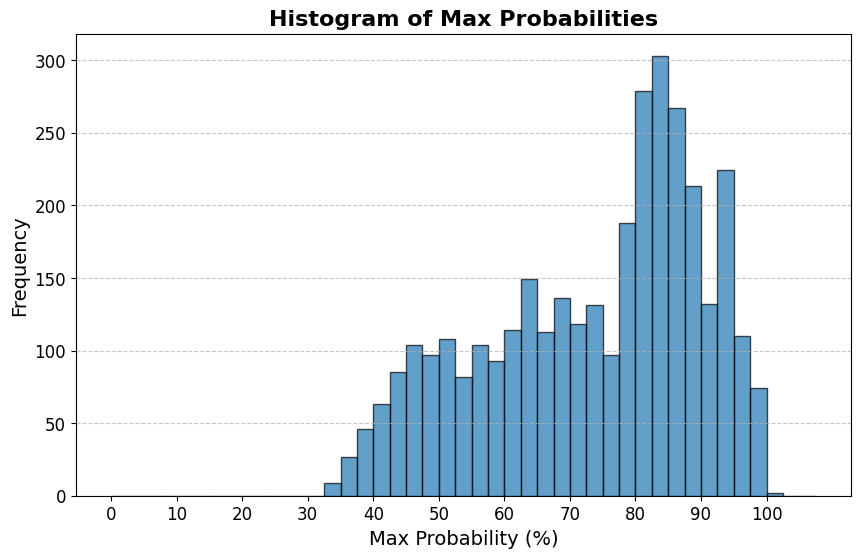

0.0 ~ 2.5 : 0.00%
2.5 ~ 5.0 : 0.00%
5.0 ~ 7.5 : 0.00%
7.5 ~ 10.0 : 0.00%
10.0 ~ 12.5 : 0.00%
12.5 ~ 15.0 : 0.00%
15.0 ~ 17.5 : 0.00%
17.5 ~ 20.0 : 0.00%
20.0 ~ 22.5 : 0.00%
22.5 ~ 25.0 : 0.00%
25.0 ~ 27.5 : 0.00%
27.5 ~ 30.0 : 0.00%
30.0 ~ 32.5 : 0.00%
32.5 ~ 35.0 : 0.26%
35.0 ~ 37.5 : 0.78%
37.5 ~ 40.0 : 1.33%
40.0 ~ 42.5 : 1.82%
42.5 ~ 45.0 : 2.45%
45.0 ~ 47.5 : 3.00%
47.5 ~ 50.0 : 2.80%
50.0 ~ 52.5 : 3.11%
52.5 ~ 55.0 : 2.36%
55.0 ~ 57.5 : 3.00%
57.5 ~ 60.0 : 2.68%
60.0 ~ 62.5 : 3.29%
62.5 ~ 65.0 : 4.30%
65.0 ~ 67.5 : 3.26%
67.5 ~ 70.0 : 3.92%
70.0 ~ 72.5 : 3.40%
72.5 ~ 75.0 : 3.78%
75.0 ~ 77.5 : 2.80%
77.5 ~ 80.0 : 5.42%
80.0 ~ 82.5 : 8.04%
82.5 ~ 85.0 : 8.74%
85.0 ~ 87.5 : 7.70%
87.5 ~ 90.0 : 6.14%
90.0 ~ 92.5 : 3.81%
92.5 ~ 95.0 : 6.46%
95.0 ~ 97.5 : 3.17%
97.5 ~ 100.0 : 2.13%
100.0 ~ 102.5 : 0.06%
102.5 ~ 105.0 : 0.00%
105.0 ~ 107.5 : 0.00%


In [172]:
df_probs = pd.DataFrame({
    "M0_prob": M0_values,
    "M1_prob": M1_values,
    "M2_prob": M2_values
})

df_probs["max"] = df_probs.max(axis=1)

import matplotlib.pyplot as plt
import numpy as np

# 히스토그램 구간 설정 (0~100을 2.5 단위로 나눔)
bins = np.arange(0, 110, 2.5)  # 0, 2.5, 5, ..., 100

# 히스토그램 그리기
plt.figure(figsize=(10, 6))
plt.hist(df_probs["max"] * 100, bins=bins, edgecolor="black", alpha=0.7)

# 그래프 설정 (글자 크기 조정)
plt.xticks(bins[::4], fontsize=12)  # X축 눈금 (4칸마다 표시)
plt.yticks(fontsize=12)  # Y축 눈금
plt.xlabel("Max Probability (%)", fontsize=14)  # X축 라벨
plt.ylabel("Frequency", fontsize=14)  # Y축 라벨
plt.title("Histogram of Max Probabilities", fontsize=16, fontweight="bold")  # 제목

# 격자 설정
plt.grid(axis="y", linestyle="--", alpha=0.7)

# 그래프 출력
plt.show()
hist, bin_edges = np.histogram(df_probs["max"] * 100, bins=bins)
total_count = len(df_probs)
percentage = (hist / total_count) * 100

# 구간별 점유율 출력
for i in range(len(hist)):
    print(f"{bin_edges[i]:.1f} ~ {bin_edges[i+1]:.1f} : {percentage[i]:.2f}%")

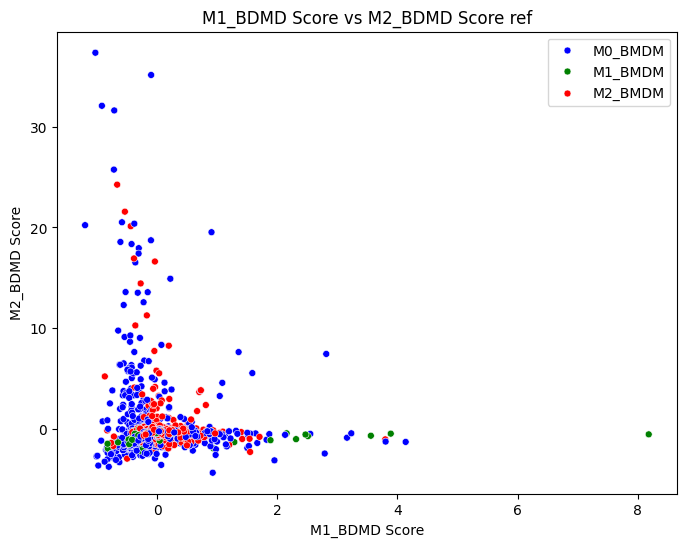

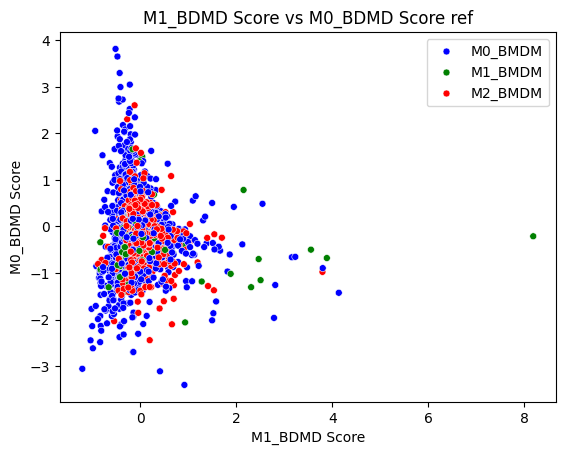

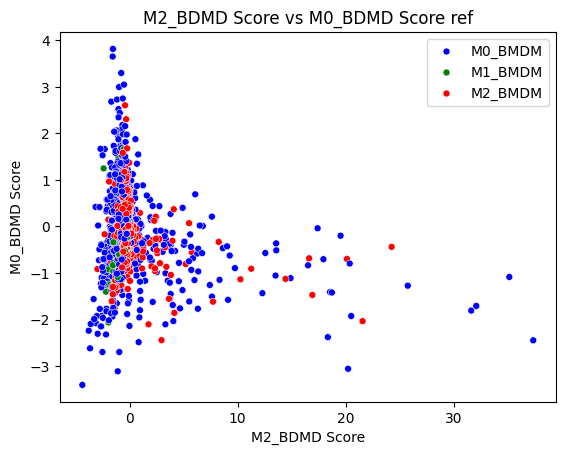

In [91]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(8, 6))
unique_classes = Padata.obs['predict'].unique()
palette = {'M0_BMDM': 'blue', 'M1_BMDM': 'green', 'M2_BMDM': 'red'}

# 산점도 그리기 (hue로 범례 자동 추가)
sns.scatterplot(
    x=Padata.obs['M1_BDMD_ref_score'],
    y=Padata.obs['M2_BDMD_ref_score'],
    hue=Padata.obs['predict'],
    palette=palette,
    s=25
)
plt.title('M1_BDMD Score vs M2_BDMD Score ref')
plt.xlabel('M1_BDMD Score')
plt.ylabel('M2_BDMD Score')
plt.legend()
plt.show()
#############################################################

sns.scatterplot(
    x=Padata.obs['M1_BDMD_ref_score'],
    y=Padata.obs['M0_BMDM_ref_score'],
    hue=Padata.obs['predict'],
    palette=palette,
    s=25
)
plt.title('M1_BDMD Score vs M0_BDMD Score ref')
plt.xlabel('M1_BDMD Score')
plt.ylabel('M0_BDMD Score')
plt.legend()
plt.show()
#############################################################

sns.scatterplot(
    x=Padata.obs['M2_BDMD_ref_score'],
    y=Padata.obs['M0_BMDM_ref_score'],
    hue=Padata.obs['predict'],
    palette=palette,
    s=25
)
plt.title('M2_BDMD Score vs M0_BDMD Score ref')
plt.xlabel('M2_BDMD Score')
plt.ylabel('M0_BDMD Score')
plt.legend()
plt.show()

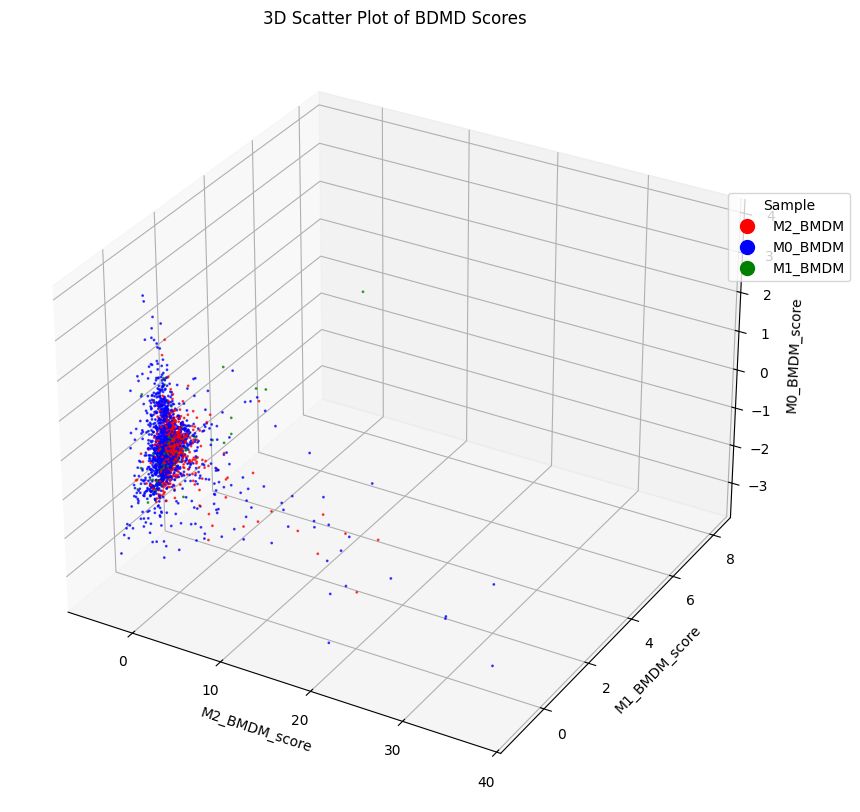

In [83]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from mpl_toolkits.mplot3d import Axes3D

# 3D 데이터 추출
x = Padata.obs['M2_BDMD_ref_score'] 
y = Padata.obs['M1_BDMD_ref_score'] 
z = Padata.obs['M0_BMDM_ref_score']

# 샘플 그룹 정보 (컬러링 용도) - 문자열로 변환
samples = Padata.obs['predict'].astype(str)

# 색상 지정 (샘플별 컬러링)
unique_samples = samples.unique()
palette = sns.color_palette("tab10", len(unique_samples))
color_map = {
    'M2_BMDM': 'red',  # 파랑색
    'M1_BMDM': 'green', # 녹색
    'M0_BMDM': 'blue'    # 빨강색
}
colors = samples.map(color_map)  # Categorical 대응 완료!

# 3D 플롯 생성
fig = plt.figure(figsize=(16, 10))
ax = fig.add_subplot(111, projection='3d')

# 산점도 플로팅
sc = ax.scatter(x, y, z, c=colors, alpha=0.7 , s = 1)

ax.set_ylabel('M1_BMDM_score')
ax.set_zlabel('M0_BMDM_score')
ax.set_xlabel('M2_BMDM_score')
ax.set_title('3D Scatter Plot of BDMD Scores')
# 범례 추가
handles = [plt.Line2D([0], [0], marker='o', color=color_map[sample], linestyle='', markersize=10) 
           for sample in unique_samples]
ax.legend(handles, unique_samples, title="Sample", bbox_to_anchor=(1.1, 0.8))

plt.show()


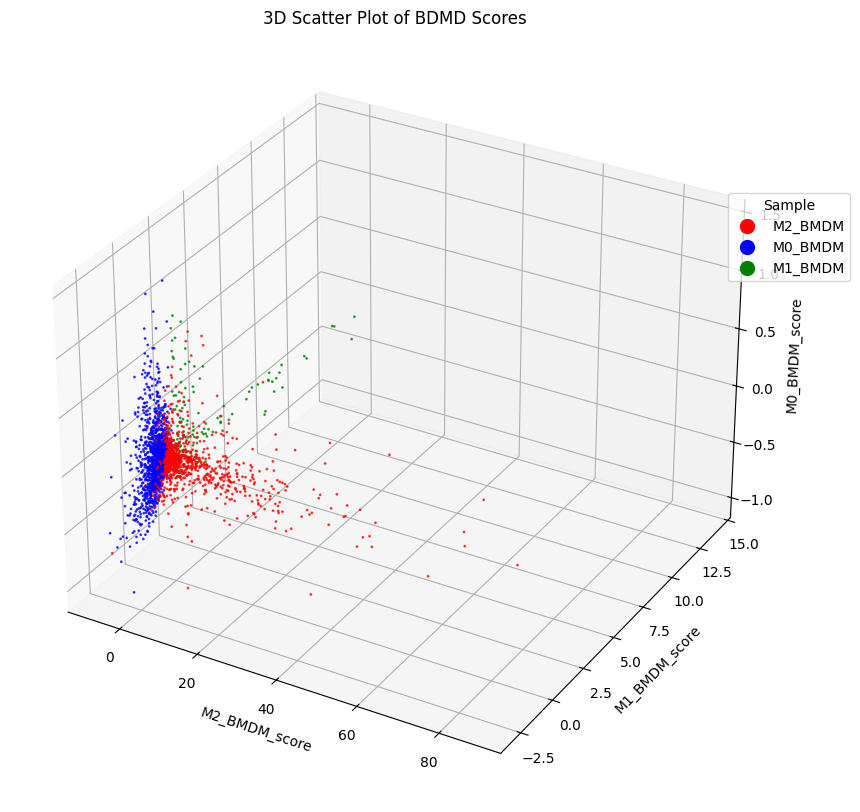

In [84]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from mpl_toolkits.mplot3d import Axes3D

# 3D 데이터 추출
x = Padata.obs['M2_BDMD_score'] 
y = Padata.obs['M1_BDMD_score'] 
z = Padata.obs['M0_BMDM_score']

# 샘플 그룹 정보 (컬러링 용도) - 문자열로 변환
samples = Padata.obs['predict'].astype(str)

# 색상 지정 (샘플별 컬러링)
unique_samples = samples.unique()
palette = sns.color_palette("tab10", len(unique_samples))
color_map = {
    'M2_BMDM': 'red',  # 파랑색
    'M1_BMDM': 'green', # 녹색
    'M0_BMDM': 'blue'    # 빨강색
}
colors = samples.map(color_map)  # Categorical 대응 완료!

# 3D 플롯 생성
fig = plt.figure(figsize=(16, 10))
ax = fig.add_subplot(111, projection='3d')

# 산점도 플로팅
sc = ax.scatter(x, y, z, c=colors, alpha=0.7 , s = 1)

ax.set_ylabel('M1_BMDM_score')
ax.set_zlabel('M0_BMDM_score')
ax.set_xlabel('M2_BMDM_score')
ax.set_title('3D Scatter Plot of BDMD Scores')
# 범례 추가
handles = [plt.Line2D([0], [0], marker='o', color=color_map[sample], linestyle='', markersize=10) 
           for sample in unique_samples]
ax.legend(handles, unique_samples, title="Sample", bbox_to_anchor=(1.1, 0.8))

plt.show()


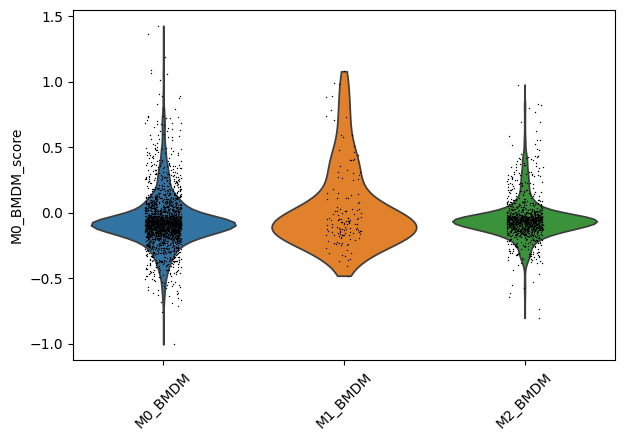

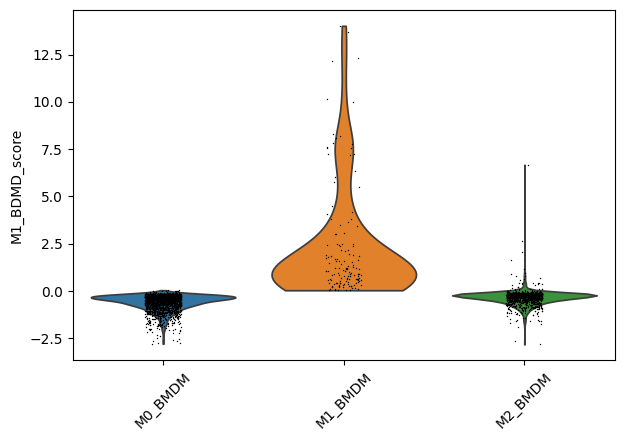

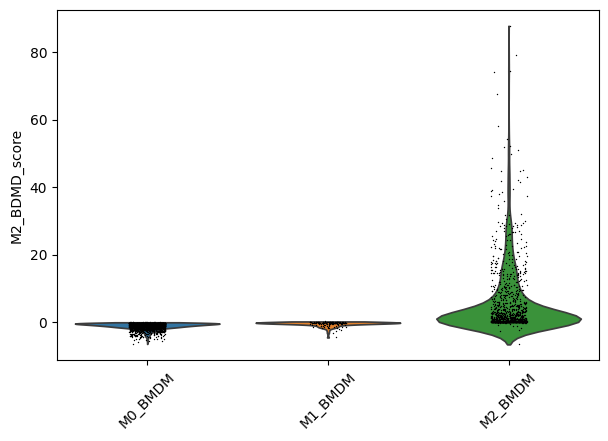

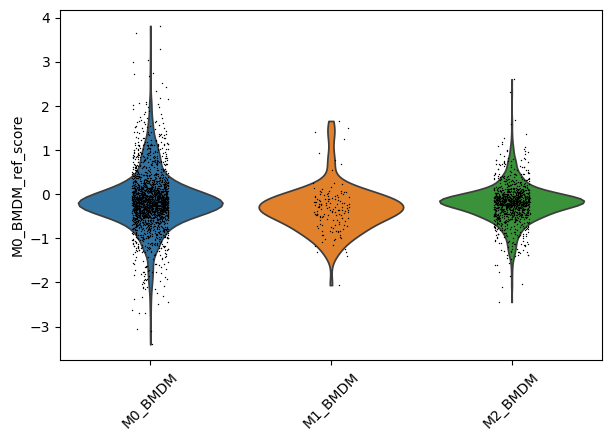

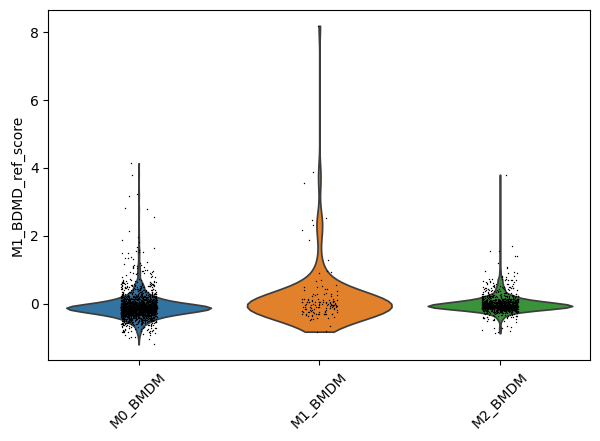

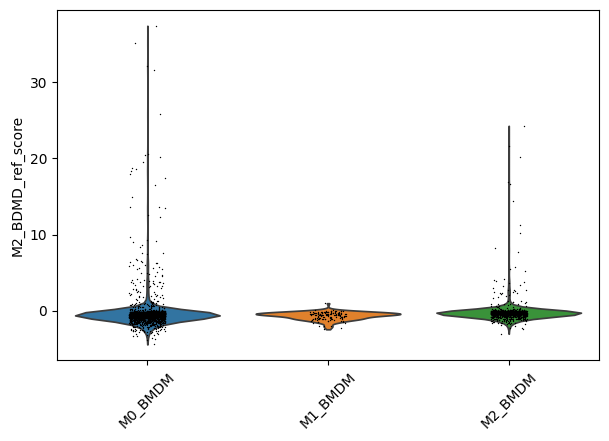

In [85]:
import scanpy as sc
# Violin plot 그리기
sc.pl.violin(Padata, keys='M0_BMDM_score', groupby='predict', jitter=True, rotation=45)
sc.pl.violin(Padata, keys='M1_BDMD_score', groupby='predict', jitter=True, rotation=45)
sc.pl.violin(Padata, keys='M2_BDMD_score', groupby='predict', jitter=True, rotation=45)
import scanpy as sc
# Violin plot 그리기
sc.pl.violin(Padata, keys='M0_BMDM_ref_score', groupby='predict', jitter=True, rotation=45)
sc.pl.violin(Padata, keys='M1_BDMD_ref_score', groupby='predict', jitter=True, rotation=45)
sc.pl.violin(Padata, keys='M2_BDMD_ref_score', groupby='predict', jitter=True, rotation=45)

In [174]:
condition = (
    (Xadata.obs[['M1_prob', 'M2_prob', 'M0_prob']].max(axis=1) < 0.45)  # 추가 조건
)
Xadata.obs['Final_pred'] = Xadata.obs['predict']
Xadata.obs.loc[condition, 'Final_pred'] = 'Other'
Xadata.obs['Final_pred'].value_counts()


Final_pred
M2_BDMD    2416
M1_BDMD     570
M0_BMDM     252
Other       230
Name: count, dtype: int64

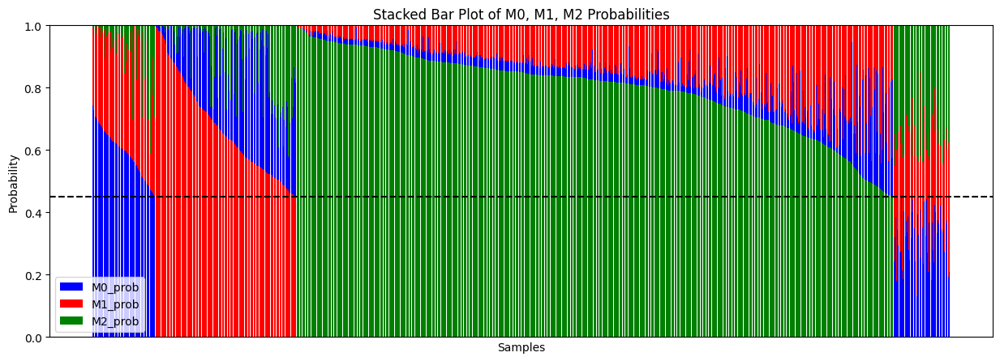

In [175]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# Final_pred 기준으로 데이터프레임 4개로 분리 후 정렬
df_M0 = Xadata.obs[Xadata.obs["Final_pred"] == "M0_BMDM"].sort_values(by="M0_prob", ascending=False)
df_M1 = Xadata.obs[Xadata.obs["Final_pred"] == "M1_BDMD"].sort_values(by="M1_prob", ascending=False)
df_M2 = Xadata.obs[Xadata.obs["Final_pred"] == "M2_BDMD"].sort_values(by="M2_prob", ascending=False)
df_Other = Xadata.obs[Xadata.obs["Final_pred"] == "Other"]  # Other는 정렬 없이 그대로 사용

# 4개 그룹을 다시 합치기
Xadata_sorted = pd.concat([df_M0, df_M1, df_M2, df_Other], ignore_index=True)

# Stacked Bar Plot 그리기
fig, ax = plt.subplots(figsize=(15, 5))

# 각 퍼센티지 값
M0_values = Xadata_sorted["M0_prob"]
M1_values = Xadata_sorted["M1_prob"]
M2_values = Xadata_sorted["M2_prob"]

# X축 인덱스
x = np.arange(len(Xadata_sorted))

# 각 그룹에 따라 'bottom' 값을 다르게 설정
for i, row in Xadata_sorted.iterrows():
    # 그룹별로 'bottom' 설정하기
    if row["Final_pred"] == "M0_BMDM":
        # label은 첫 번째로 그릴 때만 추가
        ax.bar(x[i], row["M0_prob"], color="blue", bottom=0, label="M0_prob" if i == 0 else "")  # M0_prob는 바닥
        ax.bar(x[i], row["M1_prob"], color="red", bottom=row["M0_prob"], label="M1_prob" if i == 0 else "")  # M1_prob는 M0_prob 위에
        ax.bar(x[i], row["M2_prob"], color="green", bottom=row["M0_prob"] + row["M1_prob"], label="M2_prob" if i == 0 else "")  # M2_prob는 M0_prob + M1_prob 위에
    elif row["Final_pred"] == "M1_BDMD":
        # label은 첫 번째로 그릴 때만 추가
        ax.bar(x[i], row["M1_prob"], color="red", bottom=0, label="M1_prob" if i == 0 else "")  # M1_prob는 바닥
        ax.bar(x[i], row["M0_prob"], color="blue", bottom=row["M1_prob"], label="M0_prob" if i == 0 else "")  # M0_prob는 M1_prob 위에
        ax.bar(x[i], row["M2_prob"], color="green", bottom=row["M0_prob"] + row["M1_prob"], label="M2_prob" if i == 0 else "")  # M2_prob는 M0_prob + M1_prob 위에
    elif row["Final_pred"] == "M2_BDMD":
        # label은 첫 번째로 그릴 때만 추가
        ax.bar(x[i], row["M2_prob"], color="green", bottom=0, label="M2_prob" if i == 0 else "")  # M2_prob는 바닥
        ax.bar(x[i], row["M0_prob"], color="blue", bottom=row["M2_prob"], label="M0_prob" if i == 0 else "")  # M0_prob는 M2_prob 위에
        ax.bar(x[i], row["M1_prob"], color="red", bottom=row["M0_prob"] + row["M2_prob"], label="M1_prob" if i == 0 else "")  # M1_prob는 M0_prob + M2_prob 위에
    else:
        # Other 그룹의 경우 별도로 처리
        ax.bar(x[i], row["M0_prob"], color="blue", bottom=0, label="M0_prob" if i == 0 else "")
        ax.bar(x[i], row["M1_prob"], color="red", bottom=row["M0_prob"], label="M1_prob" if i == 0 else "")
        ax.bar(x[i], row["M2_prob"], color="green", bottom=row["M0_prob"] + row["M1_prob"], label="M2_prob" if i == 0 else "")

# y=0.35에 검은색 점선 추가
ax.axhline(y=0.45, color="black", linestyle="--")

# 그래프 설정
ax.set_xlabel("Samples")
ax.set_ylabel("Probability")
ax.set_title("Stacked Bar Plot of M0, M1, M2 Probabilities")

# 범례 설정
handles, labels = ax.get_legend_handles_labels()
ax.legend(handles[:3], labels[:3])  # 첫 번째 3개의 범례만 표시 (M0_prob, M1_prob, M2_prob)

# X축 숨기기 (샘플이 많으면 보기 어려우므로)
ax.set_xticks([])

plt.show()


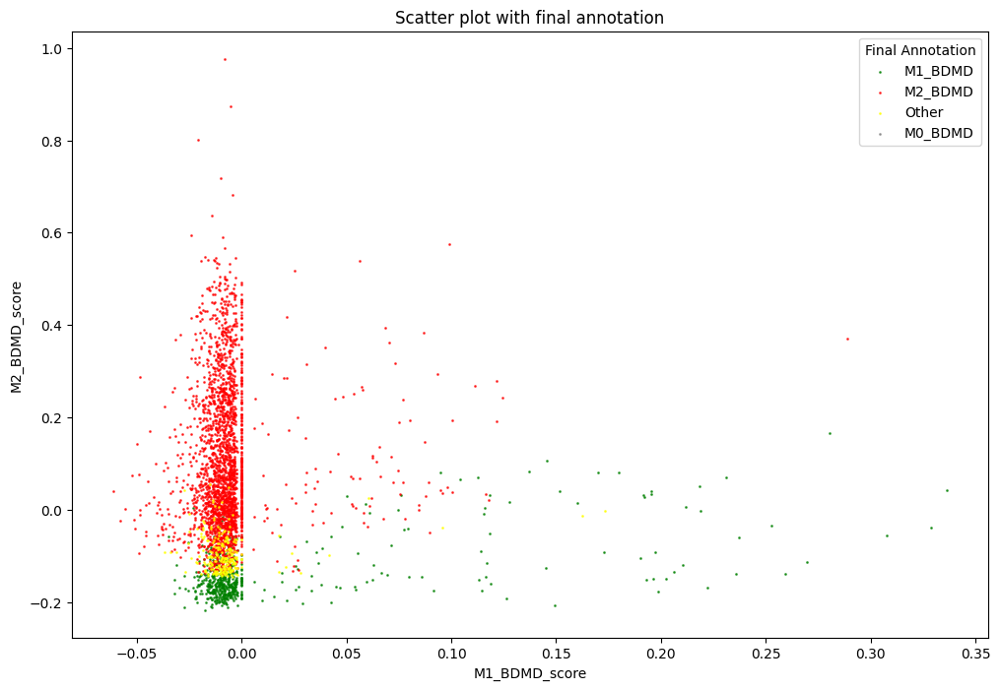

In [176]:
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches

# X와 Y 값 설정
X_all = Xadata.obs['M1_BDMD_score']  # X 좌표
Y_all = Xadata.obs['M2_BDMD_score']  # Y 좌표

# 그룹별 색상 매핑
color_map = {
    'M1_BDMD': 'green',  # M1은 초록
    'M2_BDMD': 'red',
    'Other': 'yellow',     # Other는 노랑# M2는 빨강
    'M0_BDMD': 'gray'    # M0는 회색

}

# 플롯 그리기
plt.figure(figsize=(12, 8))

# 각 그룹별로 따로 scatter 그리기 (범례 추가를 위함)
for group, color in color_map.items():
    mask = Xadata.obs['Final_pred'] == group
    plt.scatter(X_all[mask], Y_all[mask], c=color, label=group, alpha=0.7, s=1)

# 범례 추가
plt.legend(title="Final Annotation")

# 축 및 제목 설정
plt.xlabel('M1_BDMD_score')
plt.ylabel('M2_BDMD_score')
plt.title('Scatter plot with final annotation')

plt.show()


In [177]:
final_counts = Xadata.obs.groupby('sample')['Final_pred'].value_counts(normalize=True).unstack(fill_value=0)

# 비율 출력
print(final_counts)


Final_pred   M0_BMDM   M1_BDMD   M2_BDMD     Other
sample                                            
lnATM       0.005848  0.028070  0.950292  0.015789
obATM       0.137656  0.296928  0.449943  0.115472


/tmp/ipykernel_2138370/48575931.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  final_counts = Xadata.obs.groupby('sample')['Final_pred'].value_counts(normalize=True).unstack(fill_value=0)


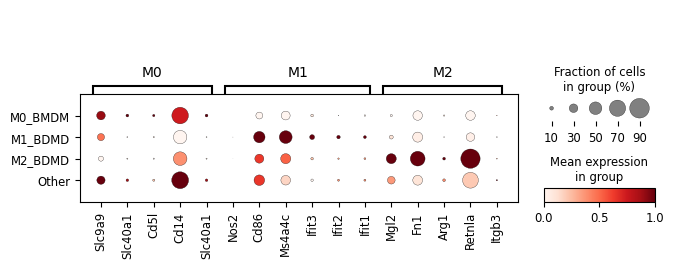

In [178]:
import scanpy as sc

marker_genes = {
    "M0": ['Slc9a9','Slc40a1','Cd5l','Cd14','Slc40a1'],
    "M1": ['Nos2','Cd86','Ms4a4c','Ifit3','Ifit2','Ifit1'],
    "M2": ['Mgl2','Fn1','Arg1','Retnla','Itgb3'],

}
# adata.var_names에서 실제로 존재하는 유전자만 필터링
existing_genes = {cat: [gene for gene in genes if gene in Xadata.var_names] 
                  for cat, genes in marker_genes.items()}

# 빈 리스트가 아닌 카테고리만 유지
existing_genes = {cat: genes for cat, genes in existing_genes.items() if genes}

sc.pl.dotplot(Xadata, existing_genes, groupby="Final_pred", standard_scale="var")

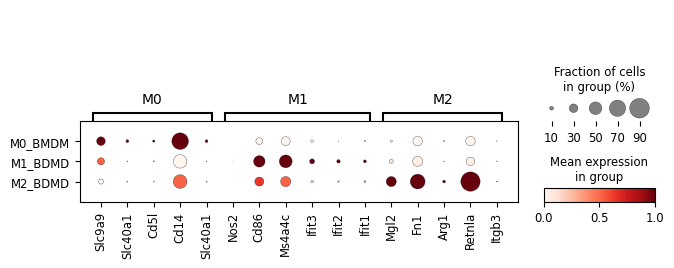

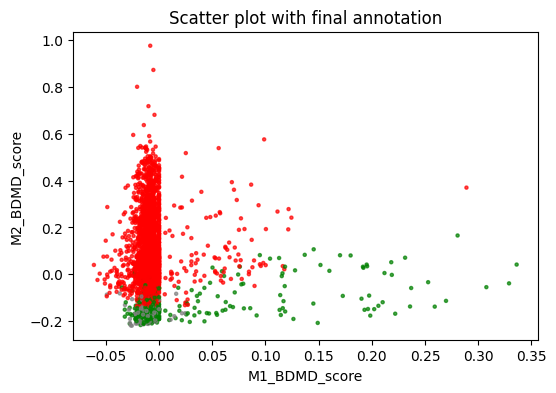

/tmp/ipykernel_2138370/1781349866.py:43: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x=XOadata.obs['Final_pred'], y=XOadata.obs['PSG_score'], palette="Set2", inner=None)


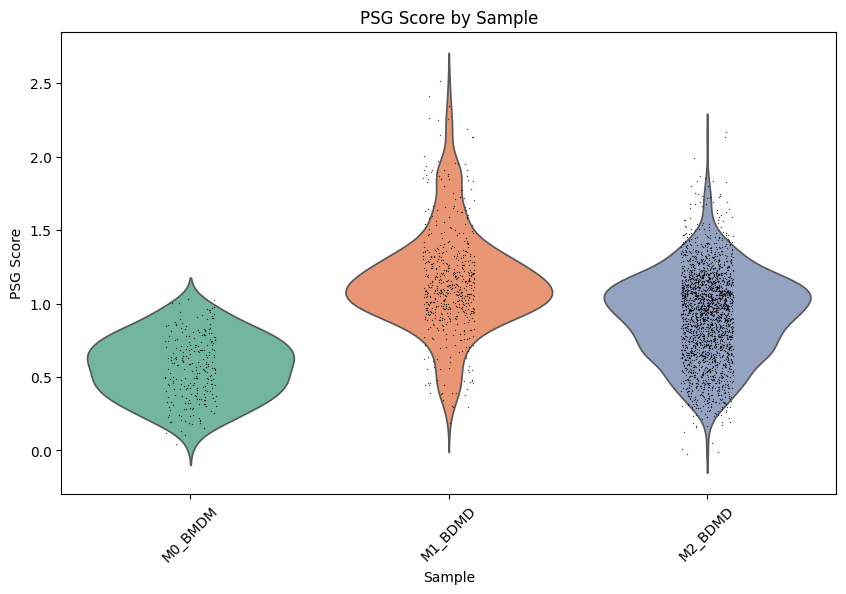

Final_pred
M2_BDMD    2416
M1_BDMD     570
M0_BMDM     252
Name: count, dtype: int64

In [180]:
import scanpy as sc

# 'final_final'이 'Other'가 아닌 데이터만 필터링하여 새로운 AnnData 생성
XOadata = Xadata[Xadata.obs['Final_pred'] != 'Other'].copy()
marker_genes = {
    "M0": ['Slc9a9','Slc40a1','Cd5l','Cd14','Slc40a1'],
    "M1": ['Nos2','Cd86','Ms4a4c','Ifit3','Ifit2','Ifit1'],
    "M2": ['Mgl2','Fn1','Arg1','Retnla','Itgb3'],
}
existing_genes = {cat: [gene for gene in genes if gene in Xadata.var_names] 
                  for cat, genes in marker_genes.items()}

# 빈 리스트가 아닌 카테고리만 유지
existing_genes = {cat: genes for cat, genes in existing_genes.items() if genes}

sc.pl.dotplot(XOadata, existing_genes, groupby="Final_pred", standard_scale="var")
# X와 Y 값 설정
X_all = XOadata.obs['M1_BDMD_score']  # X 좌표
Y_all = XOadata.obs['M2_BDMD_score']  # Y 좌표

# final 컬럼을 색상으로 설정 (NaN 값은 회색으로 처리)
colors = XOadata.obs['Final_pred'].map({
    'M1_BDMD': 'green',  # M1은 초록
    'M2_BDMD': 'red',    # M2는 빨강
    'M0_BDMD': 'gray',    # M0는 회색
    'Other' : 'yellow'
}).fillna('gray')  # NaN 값은 회색으로 설정

# 그래프 그리기
plt.figure(figsize=(6, 4))
plt.scatter(X_all, Y_all, c=colors, alpha=0.7, s=5)
plt.xlabel('M1_BDMD_score')
plt.ylabel('M2_BDMD_score')
plt.title('Scatter plot with final annotation')
plt.show()


sc.tl.score_genes(XOadata, gene_list=PSG, score_name='PSG_score')
# Figure 설정
plt.figure(figsize=(10, 6))

# Violin plot (샘플별 다른 색상 적용)
sns.violinplot(x=XOadata.obs['Final_pred'], y=XOadata.obs['PSG_score'], palette="Set2", inner=None) 

# Strip plot (각 데이터 점 표시)
sns.stripplot(x=XOadata.obs['Final_pred'], y=XOadata.obs['PSG_score'], color="black", size=1, jitter=True, alpha=0.7)

# 그래프 제목 및 축 레이블 설정
plt.title("PSG Score by Sample")
plt.xlabel("Sample")
plt.ylabel("PSG Score")
plt.xticks(rotation=45)  # X축 라벨 회전 (라벨이 많을 경우 가독성 향상)

plt.show()
XOadata.obs['Final_pred'].value_counts()

In [295]:
XOadata.write_loom("/home/Data_Drive_8TB/kykim/colon/Macspectrum/M0M1M2_file.loom", write_obsm_varm=True)

/tmp/ipykernel_2138370/3629088131.py:28: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.violinplot(data=XOadata.obs, x=groupby_col, y=score_key, inner=None, palette='pastel')
/tmp/ipykernel_2138370/3629088131.py:31: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  group_medians = XOadata.obs.groupby(groupby_col)[score_key].median()


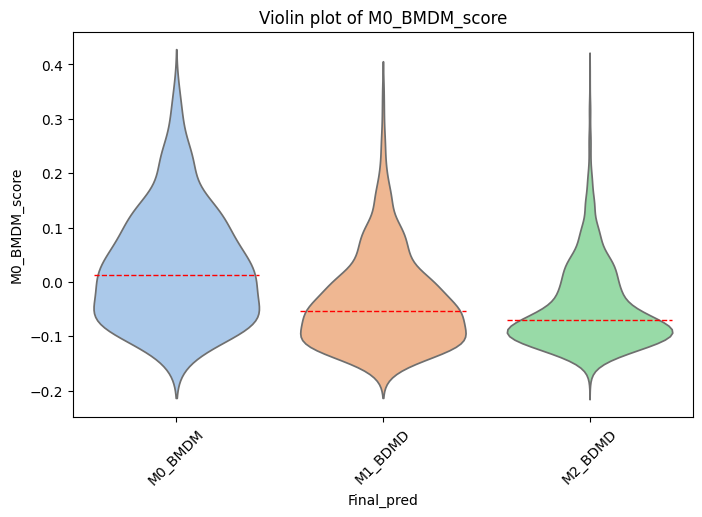

/tmp/ipykernel_2138370/3629088131.py:28: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.violinplot(data=XOadata.obs, x=groupby_col, y=score_key, inner=None, palette='pastel')
/tmp/ipykernel_2138370/3629088131.py:31: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  group_medians = XOadata.obs.groupby(groupby_col)[score_key].median()


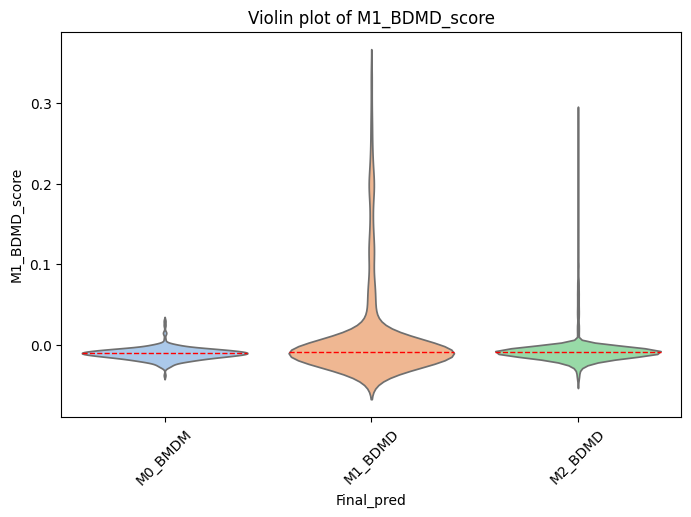

/tmp/ipykernel_2138370/3629088131.py:28: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.violinplot(data=XOadata.obs, x=groupby_col, y=score_key, inner=None, palette='pastel')
/tmp/ipykernel_2138370/3629088131.py:31: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  group_medians = XOadata.obs.groupby(groupby_col)[score_key].median()


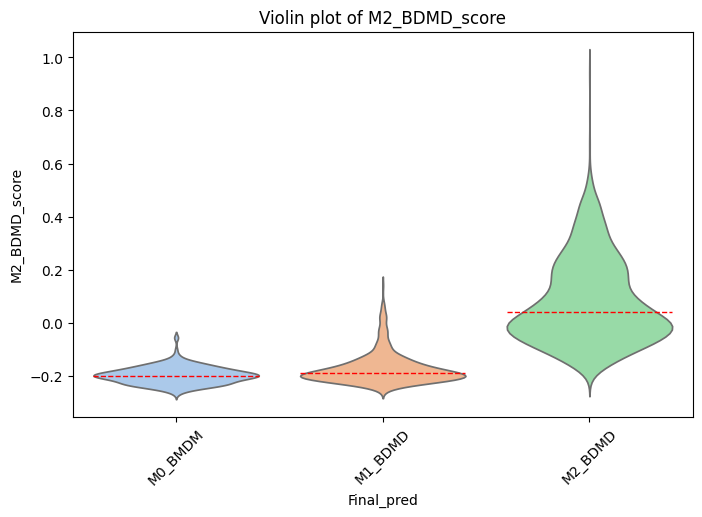

In [181]:
import scanpy as sc
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# 유효한 유전자 필터링
var_names_capitalized = [gene.capitalize() for gene in XOadata.var_names]

def filter_existing_genes(gene_list):
    return [gene for gene in gene_list if gene.capitalize() in var_names_capitalized]

# M0_BMDM 유전자 필터링
existing_genes = filter_existing_genes(M0_BMDM)

# Score 계산
sc.tl.score_genes(XOadata, gene_list=existing_genes, score_name='M0_BMDM_score')
sc.tl.score_genes(XOadata, gene_list=M2_BDMD, score_name='M2_BDMD_score')
sc.tl.score_genes(XOadata, gene_list=M1_BDMD, score_name='M1_BDMD_score')

# Violin plot을 위한 데이터 추출
score_keys = ['M0_BMDM_score', 'M1_BDMD_score', 'M2_BDMD_score']
groupby_col = 'Final_pred'

for score_key in score_keys:
    plt.figure(figsize=(8, 5))
    
    # Violin plot 그리기
    ax = sns.violinplot(data=XOadata.obs, x=groupby_col, y=score_key, inner=None, palette='pastel')
    
    # 각 그룹의 중앙값 계산 후 표시
    group_medians = XOadata.obs.groupby(groupby_col)[score_key].median()
    
    for i, median_value in enumerate(group_medians):
        plt.axhline(median_value, color='red', linestyle='--', linewidth=1, xmin=(i + 0.1) / len(group_medians), xmax=(i + 0.9) / len(group_medians))

    # 제목 및 스타일 설정
    plt.title(f'Violin plot of {score_key}')
    plt.xticks(rotation=45)
    plt.show()

sc.tl.score_genes(XOadata, gene_list=PSG, score_name='PSG_score')
plt.show()

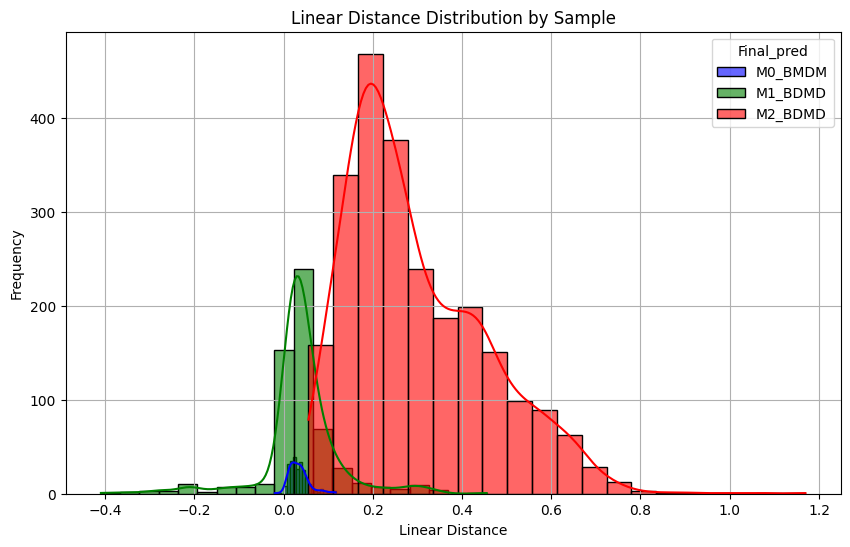

In [182]:
import matplotlib.pyplot as plt
import seaborn as sns

# 색상 맵 정의
color_map = {
    'M0_BMDM': 'blue',  # 파랑색
    'M1_BDMD': 'green', # 녹색
    'M2_BDMD': 'red'    # 빨강색
}

# 샘플별로 Linear_distance 히스토그램을 그리기 위한 함수
plt.figure(figsize=(10, 6))

# 'sample' 별로 색상 매핑을 가져오기
for sample in color_map.keys():
    # 해당 샘플의 Linear_distance 데이터 추출
    sample_data = XOadata[XOadata.obs['Final_pred'] == sample]
    
    # 히스토그램 그리기
    sns.histplot(sample_data.obs['Linear_distance'], kde=True, color=color_map[sample], label=sample, bins=20, alpha=0.6)

# 제목과 축 레이블 추가
plt.title('Linear Distance Distribution by Sample')
plt.xlabel('Linear Distance')
plt.ylabel('Frequency')

# 범례 추가
plt.legend(title='Final_pred')

# 보조선 추가
plt.grid(True)

# 플롯 표시
plt.show()


/tmp/ipykernel_1369993/2648605017.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x=XOadata.obs['Final_pred'], y=XOadata.obs['Linear_distance'], palette="Set2", inner=None)


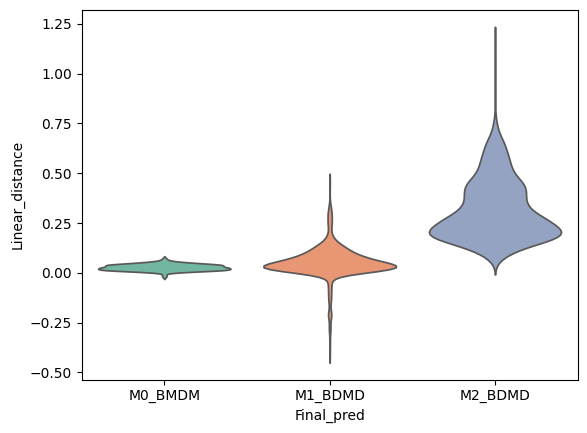

In [752]:
sns.violinplot(x=XOadata.obs['Final_pred'], y=XOadata.obs['Linear_distance'], palette="Set2", inner=None) 
plt.show()

In [631]:
import numpy as np
matched_samples = np.isin(Xadata.obs_names, XOadata.obs_names)  # XOadata와 일치하는 인덱스를 확인

# 일치하는 인덱스를 사용하여 raw.layers["counts"]에서 해당 데이터를 추출
matched_counts = Xadata.layers["counts"][matched_samples, :]

# XOadata.X에 매칭된 데이터를 할당
XOadata.X = matched_counts

# 확인: XOadata.X의 shape이 맞는지 확인
print(XOadata.X.shape)


(3459, 27998)


In [632]:
# 경로 지정
file_path = '/home/Data_Drive_8TB/kykim/colon/Macspectrum/XOadata.h5ad'

# XOadata 객체를 지정된 경로에 저장
XOadata.write(file_path)

# 저장 완료 메시지 출력
print(f"XOadata 객체가 {file_path}에 성공적으로 저장되었습니다.")


XOadata 객체가 /home/Data_Drive_8TB/kykim/colon/Macspectrum/XOadata.h5ad에 성공적으로 저장되었습니다.


In [90]:
import scanpy as sc

# M0_BMDM과 M1_BDMD가 포함된 객체 생성
M0M1 = XOadata[XOadata.obs['Final_pred'].isin(['M0_BMDM', 'M1_BDMD'])]

# M0_BMDM과 M2_BDMD가 포함된 객체 생성
M0M2 = XOadata[XOadata.obs['Final_pred'].isin(['M0_BMDM', 'M2_BDMD'])]

# 확인을 위해 각 객체의 상태를 출력

M0M1.write('/home/Data_Drive_8TB/kykim/colon/Macspectrum/M0M1.h5ad')
print("M0M1_adata saved")

M0M2.write('/home/Data_Drive_8TB/kykim/colon/Macspectrum/M0M2.h5ad')
print("M0M2_adata saved")

M0M1_adata saved
M0M2_adata saved


In [ ]:
XOadata

In [ ]:
# sc.pp.filter_cells(XOadata, min_genes=100)
# sc.pp.filter_genes(XOadata, min_cells=3)
sc.pp.normalize_total(XOadata)
sc.pp.log1p(XOadata)
# sc.pp.highly_variable_genes(XOadata, flavor="seurat", batch_key="sample") 
sc.tl.pca(XOadata)
sc.pl.pca_variance_ratio(XOadata, n_pcs=100, log=True)
sc.external.pp.bbknn(XOadata, batch_key="sample")
sc.pp.neighbors(XOadata)
sc.tl.umap(XOadata)
sc.pl.umap(
    XOadata,
    color="Final_pred",
    # Setting a smaller point size to get prevent overlap
    size=20,
)


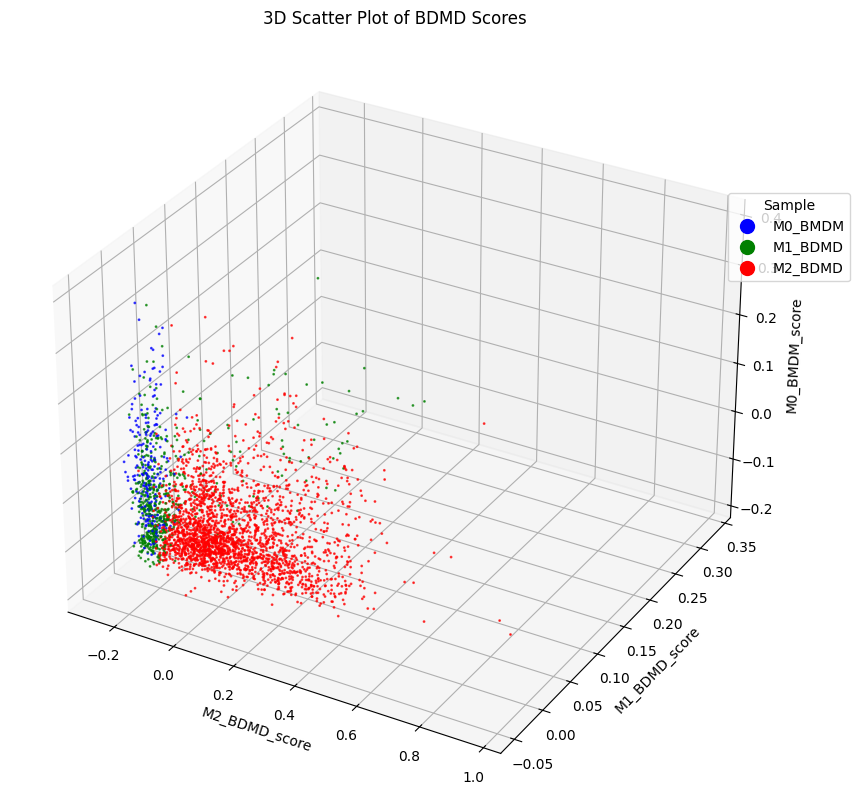

In [183]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from mpl_toolkits.mplot3d import Axes3D

# 3D 데이터 추출
x = XOadata.obs['M2_BDMD_score']
y = XOadata.obs['M1_BDMD_score']
z = XOadata.obs['M0_BMDM_score']

# 샘플 그룹 정보 (컬러링 용도) - 문자열로 변환
samples = XOadata.obs['Final_pred'].astype(str)

# 범례 및 산점도 색상 매핑
legend_color_map = {
    'M0_BMDM': 'blue',  # 파랑색
    'M1_BDMD': 'green', # 녹색
    'M2_BDMD': 'red'    # 빨강색
}

# 샘플별 색상 적용
colors = samples.map(legend_color_map)

# 3D 플롯 생성
fig = plt.figure(figsize=(16, 10))
ax = fig.add_subplot(111, projection='3d')

# 산점도 플로팅 (지정한 색상 적용)
sc = ax.scatter(x, y, z, c=colors, alpha=0.7, s=1)

# 범례 추가
handles = [plt.Line2D([0], [0], marker='o', color=legend_color_map[sample], linestyle='', markersize=10) 
           for sample in legend_color_map.keys() if sample in samples.unique()]
ax.legend(handles, legend_color_map.keys(), title="Sample", bbox_to_anchor=(1.1, 0.8))

# 축 및 제목 설정
ax.set_xlabel('M2_BDMD_score')
ax.set_ylabel('M1_BDMD_score')
ax.set_zlabel('M0_BMDM_score')
ax.set_title('3D Scatter Plot of BDMD Scores')

plt.show()


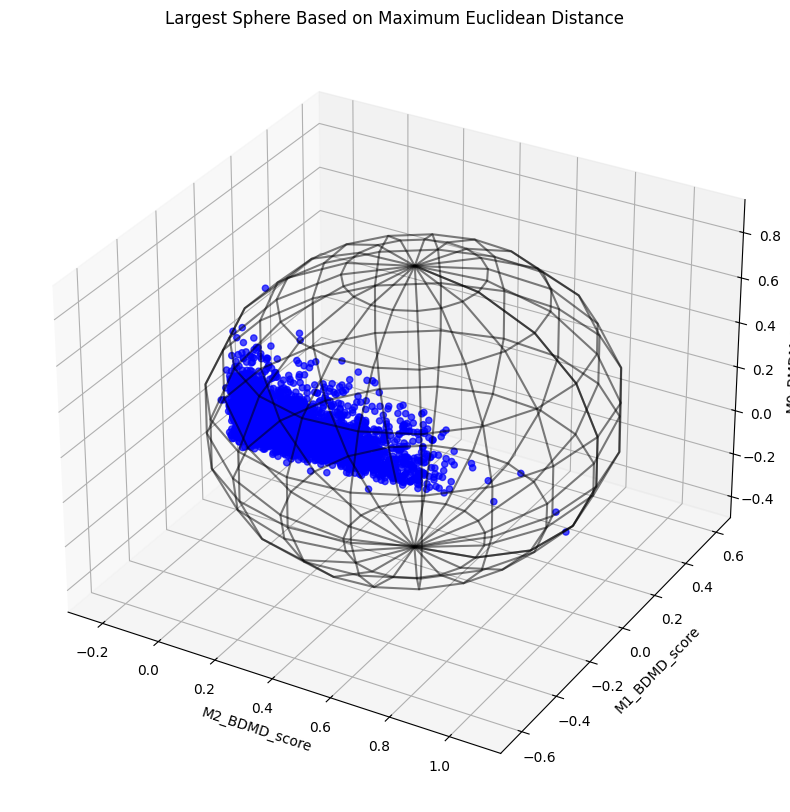

In [619]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from scipy.spatial.distance import cdist

# 3D 데이터 추출
x = XOadata.obs['M2_BDMD_score'].values
y = XOadata.obs['M1_BDMD_score'].values
z = XOadata.obs['M0_BMDM_score'].values

# 3D 좌표 배열
points = np.vstack((x, y, z)).T

# 모든 점들 간의 유클리드 거리 계산
distances = cdist(points, points)

# 자기 자신을 제외한 최대 거리 찾기
np.fill_diagonal(distances, 0)  # 자기 자신은 제외 (0으로 설정)
max_dist_idx = np.unravel_index(np.argmax(distances), distances.shape)

# 가장 큰 유클리드 거리
max_distance = distances[max_dist_idx]

# 가장 큰 구의 반지름은 그 거리의 절반
radius = max_distance / 2

# 구의 중심은 두 점의 중간 지점
center = (points[max_dist_idx[0]] + points[max_dist_idx[1]]) / 2

# 구 좌표 생성
u = np.linspace(0, 2 * np.pi, 20)   # θ (방위각)
v = np.linspace(0, np.pi, 10)       # φ (경도각)
x_sphere = center[0] + radius * np.outer(np.cos(u), np.sin(v))
y_sphere = center[1] + radius * np.outer(np.sin(u), np.sin(v))
z_sphere = center[2] + radius * np.outer(np.ones(np.size(u)), np.cos(v))

# 구의 중심에서 각 점까지의 벡터와 거리 계산
vectors = points - center  # 구의 중심에서 각 점까지의 벡터
distances_to_center = np.linalg.norm(vectors, axis=1)  # 구의 중심에서 각 점까지의 거리

# XOadata.obs['final_predict'] 값 가져오기
final_predict = XOadata.obs['Final_pred'].values

# DataFrame 생성
testdimension = pd.DataFrame({
    'x': x,
    'y': y,
    'z': z,
    'distance_to_center': distances_to_center,
    'vector_x': vectors[:, 0],
    'vector_y': vectors[:, 1],
    'vector_z': vectors[:, 2],
    'final_predict': final_predict
})


# 3D 플롯 생성
fig = plt.figure(figsize=(16, 10))
ax = fig.add_subplot(111, projection='3d')

# 점 플로팅
ax.scatter(x, y, z, c='blue', alpha=0.7)

# 가장 큰 구 플로팅
ax.plot_wireframe(x_sphere, y_sphere, z_sphere, color='black', alpha=0.5)

# 축 및 제목 설정
ax.set_xlabel('M2_BDMD_score')
ax.set_ylabel('M1_BDMD_score')
ax.set_zlabel('M0_BMDM_score')
ax.set_title('Largest Sphere Based on Maximum Euclidean Distance')

plt.show()


In [620]:
testdimension['vector_sum'] = testdimension['vector_x'] + testdimension['vector_y'] + testdimension['vector_z']

In [621]:
testdimension

,x,y,z,distance_to_center,vector_x,vector_y,vector_z,final_predict,vector_sum
0,-0.041627,-0.016533,-0.105379,0.594446,-0.495859,-0.004496,-0.327826,M2_BDMD,-0.828180
1,0.305595,0.023268,0.048469,0.231532,-0.148636,0.035305,-0.173977,M2_BDMD,-0.287308
2,0.053895,-0.011485,-0.065322,0.493032,-0.400336,0.000552,-0.287769,M2_BDMD,-0.687553
3,0.164350,0.000000,-0.003217,0.367560,-0.289882,0.012037,-0.225663,M2_BDMD,-0.503508
4,-0.006814,0.000000,-0.113167,0.570389,-0.461045,0.012037,-0.335614,M2_BDMD,-0.784622
...,...,...,...,...,...,...,...,...,...
3454,0.001118,-0.004737,0.093344,0.471203,-0.453113,0.007300,-0.129102,M1_BDMD,-0.574916
3455,0.101387,-0.009989,-0.057010,0.450110,-0.352844,0.002048,-0.279456,M2_BDMD,-0.630253
3456,0.004604,-0.004316,-0.101060,0.553968,-0.449627,0.007721,-0.323507,M2_BDMD,-0.765413
3457,-0.076140,-0.004140,-0.109377,0.625670,-0.530372,0.007897,-0.331824,M1_BDMD,-0.854298


In [729]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# 구의 중심을 계산 (dimension 객체에서 중간값으로 설정)
center = np.array([0.6224609713, 0.3361790925, -0.136578185])

# 각 점에서 구의 중심까지의 거리 계산
testdimension['distance_to_center'] = np.linalg.norm(
    np.vstack((testdimension['vector_x'], testdimension['vector_y'], testdimension['vector_z'])).T - center, axis=1)

# final_predict 값에 따라 색상 지정
color_map = {
    'M0_BMDM': 'blue',  # 파랑색
    'M1_BDMD': 'green', # 녹색
    'M2_BDMD': 'red'    # 빨강색
}

# 색상을 final_predict 값에 맞게 매핑
colors = testdimension['final_predict'].map(color_map)

# 시각화
plt.figure(figsize=(10, 6))
scatter = plt.scatter(testdimension['vector_sum'], testdimension['distance_to_center'], c=colors, alpha=0.7, s = 10)

# 축 및 제목 설정
plt.xlabel('Vector Sum (vector_x + vector_y + vector_z)')
plt.ylabel('Distance to Center')
plt.title('Vector Sum vs Distance to Center by final_predict Group')

# 범례 설정
handles = [plt.Line2D([0], [0], marker='o', color=color_map[label], linestyle='', markersize=10) 
           for label in color_map]
plt.legend(handles, color_map.keys(), title="final_predict", bbox_to_anchor=(1.05, 1))

plt.show()


KeyError: 'final_predict'

Max vector_sum Point: [0.22119872 0.42589881]
Min vector_sum Point: [-1.02615392  1.34399844]
Special Point (Max x, Min y): [0.22119872 1.34399844]


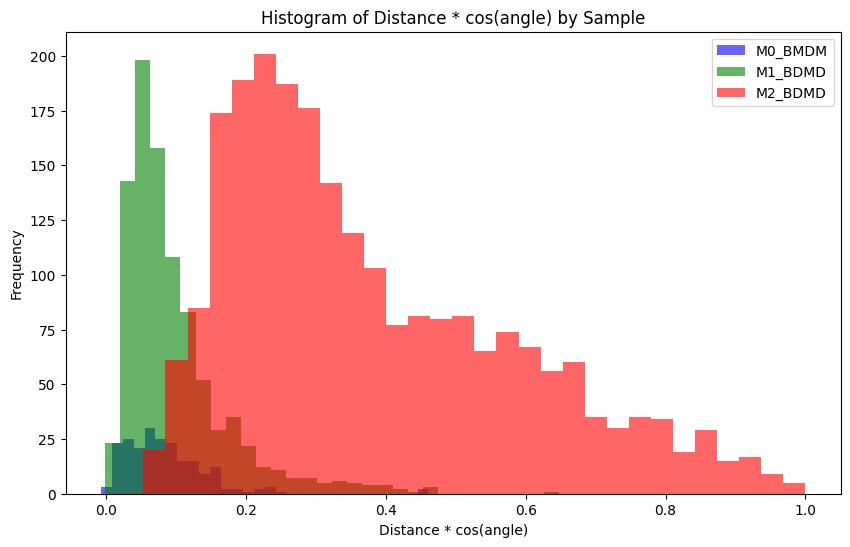

In [623]:
import matplotlib.pyplot as plt
import numpy as np

# 색상 매핑
colors = testdimension['final_predict'].map(color_map)

# 겹치는 spot 찾기: 동일한 (vector_sum, distance_to_center) 값을 가지는 경우
duplicated = testdimension.duplicated(subset=['vector_sum', 'distance_to_center'], keep=False)

# 최댓값과 최솟값 찾기
max_idx = testdimension['vector_sum'].idxmax()
min_idx = testdimension['vector_sum'].idxmin()

max_point = np.array([testdimension.loc[max_idx, 'vector_sum'], testdimension.loc[max_idx, 'distance_to_center']])
min_point = np.array([testdimension.loc[min_idx, 'vector_sum'], testdimension.loc[min_idx, 'distance_to_center']])

# Special dot 좌표 생성 (min의 y, max의 x)
special_point = np.array([max_point[0], min_point[1]])

# 좌표 출력
print(f"Max vector_sum Point: {max_point}")
print(f"Min vector_sum Point: {min_point}")
print(f"Special Point (Max x, Min y): {special_point}")

# 각 점에 대해 (Max - Special - 각 dot) 각도 및 거리 계산
angles = []
distances = []
cos_values = []

for idx, row in testdimension.iterrows():
    dot_point = np.array([row['vector_sum'], row['distance_to_center']])
    
    # 벡터 정의
    vector_a = max_point - special_point
    vector_b = dot_point - special_point

    # 코사인 값 계산
    cos_theta = np.dot(vector_a, vector_b) / (np.linalg.norm(vector_a) * np.linalg.norm(vector_b))
    cos_theta = np.clip(cos_theta, -1.0, 1.0)  # 수치 안정성을 위해 값 제한
    angle = np.degrees(np.arccos(cos_theta))  # 각도 변환

    # 유클리드 거리 계산
    distance = np.linalg.norm(dot_point - special_point)

    # 최종 값: 거리 * cos(각도)
    final_value = cos_theta

    # 저장
    angles.append(angle)
    distances.append(distance)
    cos_values.append(final_value)

# 결과를 데이터프레임에 추가
testdimension['angle'] = angles
testdimension['distance'] = distances
testdimension['cos_value'] = cos_values

# sample별 히스토그램 시각화
plt.figure(figsize=(10, 6))

for sample, color in color_map.items():
    subset = testdimension[testdimension['final_predict'] == sample]
    plt.hist(subset['cos_value'], bins=30, alpha=0.6, color=color, label=sample)

plt.xlabel("Distance * cos(angle)")
plt.ylabel("Frequency")
plt.title("Histogram of Distance * cos(angle) by Sample")
plt.legend()
plt.show()


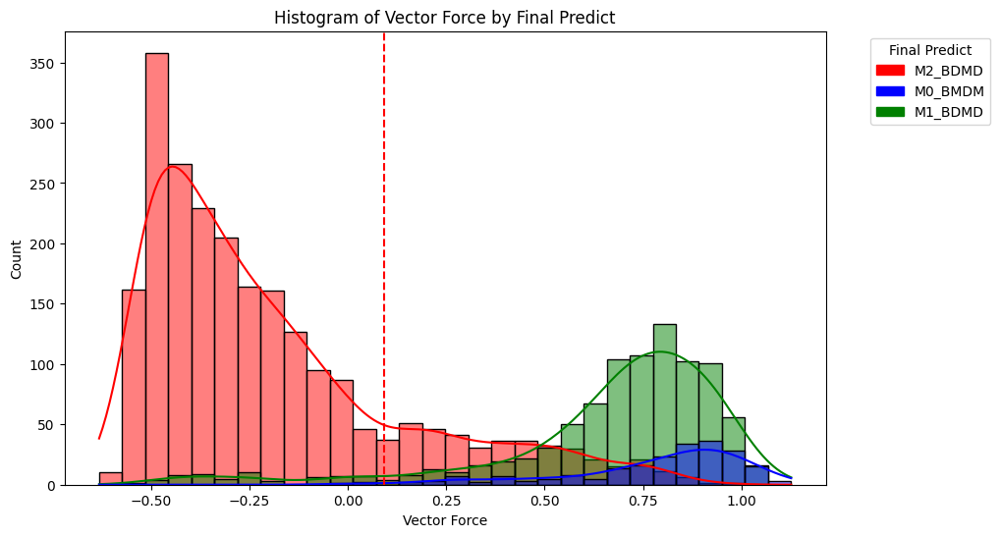

In [627]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
color_map = {
    'M0_BMDM': 'blue',  # 파랑색
    'M1_BDMD': 'green', # 녹색
    'M2_BDMD': 'red'    # 빨강색
}
# vector_force 계산
testdimension['vector_force'] = testdimension['vector_sum'] * testdimension['distance_to_center']

# 센터 좌표 및 원점 정의

origin = np.array([0, 0, 0])

# 각 데이터 포인트의 벡터 생성
vectors = testdimension[['x', 'y', 'z']].to_numpy()  # 각 dot의 좌표 가져오기

# 벡터 간의 각도(θ) 계산
dot_products = np.einsum('ij,j->i', vectors, center)  # 각 벡터와 센터 벡터의 내적
magnitudes = np.linalg.norm(vectors, axis=1) * np.linalg.norm(center)  # 크기 곱
cos_theta = dot_products / magnitudes  # cos(θ) 계산

# vector_force에 cos(θ) 곱하기
testdimension['vector_force'] *= cos_theta

# 색상 팔레트 설정
unique_classes = testdimension['final_predict'].unique()
palette = sns.color_palette('tab10', n_colors=len(unique_classes))
color_dict = dict(zip(unique_classes, palette))

# 히스토그램 시각화
plt.figure(figsize=(10, 6))
sns.histplot(data=testdimension, x='vector_force', hue='final_predict', kde=True, bins=30, palette=color_map)

# 범례 설정
handles = [plt.Rectangle((0,0),1,1, color=color_dict[label]) for label in unique_classes]
plt.legend(handles, unique_classes, title='Final Predict', bbox_to_anchor=(1.05, 1), loc='upper left')
handles = [plt.Rectangle((0,0),1,1, color=color_map[label]) for label in unique_classes]
plt.legend(handles, unique_classes, title='Final Predict', bbox_to_anchor=(1.05, 1), loc='upper left')

plt.xlabel('Vector Force')
plt.ylabel('Count')
plt.title('Histogram of Vector Force by Final Predict')

# 센터 좌표와 원점을 연결하는 선 추가
plt.axvline(x=np.mean(testdimension['vector_force']), color='red', linestyle='dashed', label='Center-Origin Line')

plt.show()


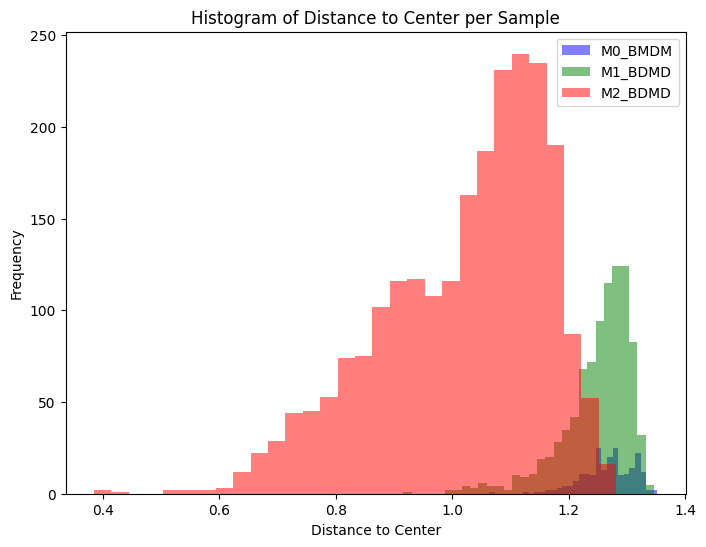

In [625]:
import matplotlib.pyplot as plt

# 히스토그램 색상 매핑
color_map = {
    'M0_BMDM': 'blue',  # 파랑색
    'M1_BDMD': 'green', # 녹색
    'M2_BDMD': 'red'    # 빨강색
}

# 샘플별 히스토그램 그리기
plt.figure(figsize=(8, 6))

for sample, color in color_map.items():
    subset = testdimension[testdimension['final_predict'] == sample]
    plt.hist(subset['distance_to_center'], bins=30, alpha=0.5, label=sample, color=color)

plt.xlabel('Distance to Center')
plt.ylabel('Frequency')
plt.legend()
plt.title('Histogram of Distance to Center per Sample')
plt.show()


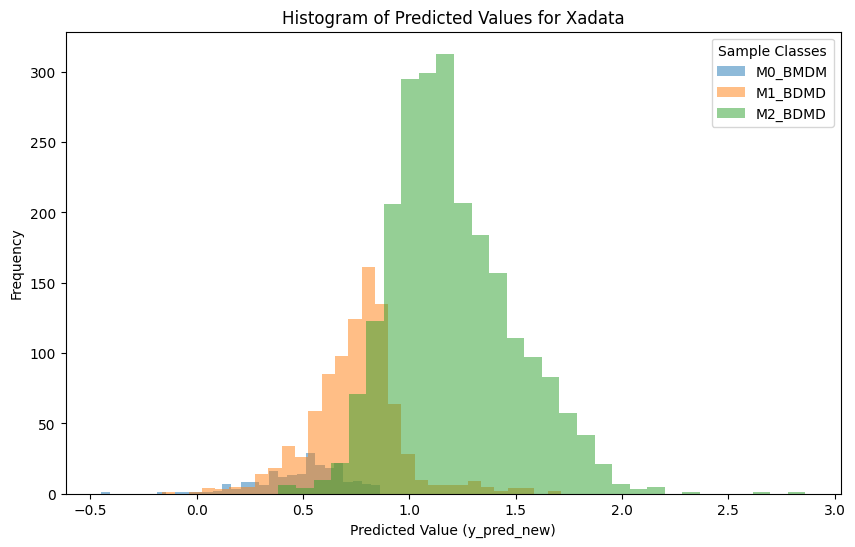

In [626]:
import numpy as np
import matplotlib.pyplot as plt

# Xadata에서 예측값 생성
X_new = XOadata.obs[['M2_BDMD_score', 'M1_BDMD_score', 'M0_BMDM_score']]
y_pred_new = model.predict(X_new)

# Xadata의 sample 클래스 정보 가져오기
y_new = XOadata.obs['Final_pred']
y_new_encoded = label_encoder.transform(y_new)  # 새로운 데이터의 sample을 숫자로 변환

# 히스토그램 플롯
plt.figure(figsize=(10, 6))

# sample 값에 따라 예측값 색상 입히기
for sample_class in label_encoder.classes_:
    mask = y_new_encoded == label_encoder.transform([sample_class])[0]  # 새로운 데이터에서 해당 샘플 클래스 마스크
    plt.hist(y_pred_new[mask], bins=30, alpha=0.5, label=sample_class)

# 그래프 레이블 설정
plt.title("Histogram of Predicted Values for Xadata")
plt.xlabel("Predicted Value (y_pred_new)")
plt.ylabel("Frequency")

# 범례 추가
plt.legend(title="Sample Classes")

# 그래프 출력
plt.show()


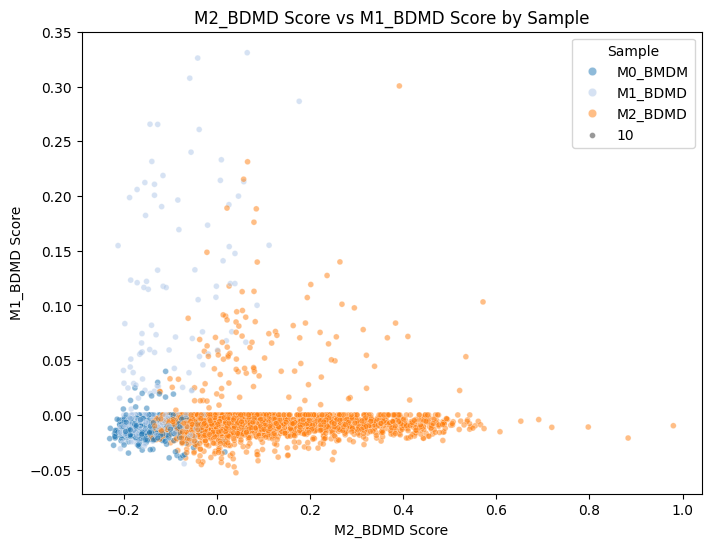

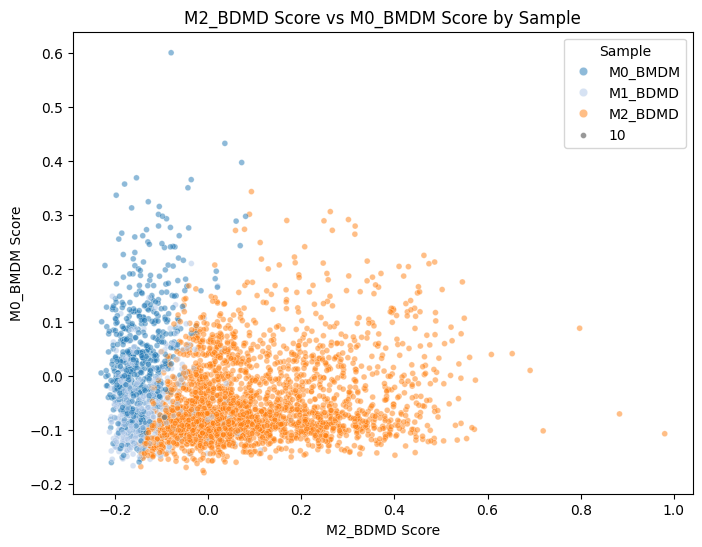

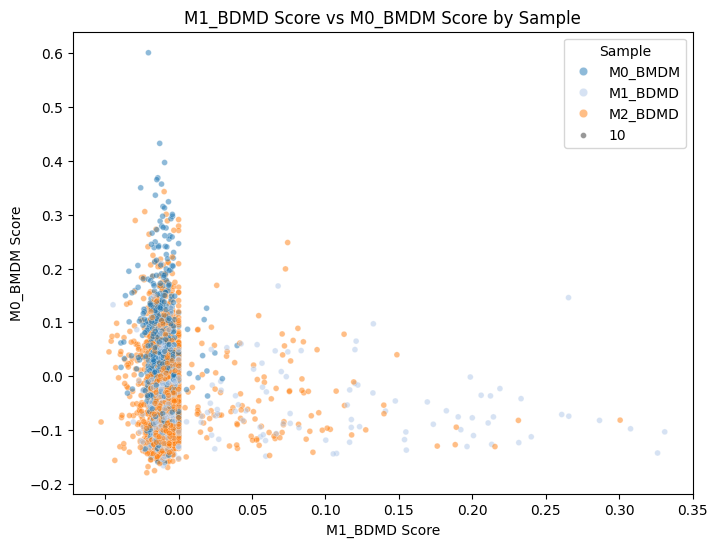

In [581]:
import scanpy as sc
def filter_existing_genes(gene_list):
    return [gene for gene in gene_list if gene.capitalize() in var_names_capitalized]

# 비교할 조합 설정
comparisons = [("M2_BDMD", M2_BDMD), ("M1_BDMD", M1_BDMD), ("M0_BMDM", M0_BMDM)]
for (name1, genes1), (name2, genes2) in combinations(comparisons, 2):
    existing_genes1 = filter_existing_genes(genes1)
    existing_genes2 = filter_existing_genes(genes2)
    
    sc.tl.score_genes(XOadata, gene_list=existing_genes1, score_name=f'{name1}_score')
    sc.tl.score_genes(XOadata, gene_list=existing_genes2, score_name=f'{name2}_score')
    
    plt.figure(figsize=(8, 6))
    sns.scatterplot(x=f'{name1}_score', y=f'{name2}_score', hue='Final_pred', data=XOadata.obs, palette='tab20', alpha=0.5, size=10)
    
    plt.title(f'{name1} Score vs {name2} Score by Sample')
    plt.xlabel(f'{name1} Score')
    plt.ylabel(f'{name2} Score')
    plt.legend(title='Sample')
    plt.show()

In [ ]:
import scanpy as sc
# OXPHOS = [
#     "ATP12A", "ATP4A", "ATP4B", "ATP5A1", "ATP5B", "ATP5C1", "ATP5D", "ATP5E", 
#     "ATP5F1", "ATP5G1", "ATP5G2", "ATP5G3", "ATP5H", "ATP5I", "ATP5J", "ATP5J2", 
#     "ATP5L", "ATP5O", "ATP6AP1", "ATP6V0A1", "ATP6V0A2", "ATP6V0A4", "ATP6V0B", 
#     "ATP6V0C", "ATP6V0D1", "ATP6V0D2", "ATP6V0E1", "ATP6V1A", "ATP6V1B1", "ATP6V1B2", 
#     "ATP6V1C1", "ATP6V1C2", "ATP6V1D", "ATP6V1E1", "ATP6V1E2", "ATP6V1F", "ATP6V1G1", 
#     "ATP6V1G2", "ATP6V1G3", "ATP6V1H","COX1", "COX10", "COX15", "COX17", "COX2", 
#     "COX3", "COX4I1", "COX4I2", "COX5A", "COX5B", "COX6A1", "COX6A2", "COX6B1", 
#     "COX6B2", "COX6C", "COX7A1", "COX7A2", "COX7B", "COX7B2", "COX7C", "COX8A", 
#     "COX8C"
# ]
sc.tl.score_genes(XOadata, gene_list=OXPHOS, score_name='OXPHOS_score')
sns.violinplot(x=XOadata.obs['Final_pred'], y=XOadata.obs['OXPHOS_score'], palette="Set2", inner=None)
sns.stripplot(x=XOadata.obs['Final_pred'], y=XOadata.obs['OXPHOS_score'], color="black", size=1, jitter=True, alpha=0.7)
plt.show()


In [264]:
M2up = ['Rbp4', 'Cldn11', 'Msx3', 'Ppp1r1a', 'Shisa9', 'Bok', 'Gm8113', 'Scn3a', 'Il1rl1', 'Nptx1', 'Ccl17', 'Kcnd3', 'Bcat1', 'Eef1a2', 'Ccnb2', 'Fgfr1', 'Gm15496', '4933417E11Rik', 'Gfra2', 'Epas1', 'Rgs16', 'Il31ra', 'Shisa2', 'Ang2', 'Adipoq', 'Btbd17', 'Retnla', 'Tmem26', 'Fn1', 'Rnase2a', 'Bex1', 'Arg1', 'Mgl2', 'Lrrc32', 'Ear2', 'Galnt9', 'Mt3', 'Stab2', 'Chil3', 'Mmp12', 'Ccna2', 'Jsrp1', 'Ffar4', 'Cdh1', 'Ppp1r3c', 'Egr2', 'Agmo', 'Hebp2', 'Clstn1', 'Slc9a3r2', 'Mamdc2', 'Fbln5', 'Gprc5c', 'Ptgs1', 'Chst7', 'Flt1', 'Lrrc39', 'Map2', 'Rhoj', 'Itgax', 'Ncs1', 'Lyzl4', 'Lat', 'Tuba8', '3300005D01Rik', 'Cmbl', 'F13a1', 'Mrc1', 'Camk2n1', 'Matk', 'P2ry1', 'Wwc1', 'Sardh', 'Ube2c', 'Pkp2', 'Pdlim1', 'Plekhf1', 'March10', 'Fcrls', 'Penk', 'Ramp1', 'Cpeb1', 'Tacc2', 'Dnmt3aos', 'Cbr2', 'Clec4b1', 'Asb4', 'Lipn', 'Gm42835', 'Atp6v0d2', 'Itgb3', 'Htr2b', 'Cck', 'Armc2', 'Cass4', 'Clec1a', 'Mmp8', 'Ccl6', 'Sult1a1', 'Mmp27', 'Ryr1', 'Ptrf', 'Mcf2l', '2810417H13Rik', 'Plxdc2', 'Ank', 'Cyp2ab1', 'Fam78b', 'Gpr176', 'Adam19', 'Irf4', 'Tmem158', 'Man2a2', 'Dclk1', 'Vasn', 'Wbscr27', 'Nes', 'Abcd2', 'Fgf11', 'Rab11fip4', '9430020K01Rik', 'Rasgrp3', 'Coro2b', 'Mmp9', 'Dhcr24', 'Tk1', 'Ptprn', 'Igf1', 'Clec10a', 'Smo', 'Il1rl2', 'Ldlrad3', 'Flnc', 'Ccl9', 'Cbx2', 'B3glct', 'Rpl10a', 'Stxbp6', 'Rasgrp2', 'Dcstamp', 'Flywch2', 'Dusp9', 'Ttll11', 'Rnase4', 'Myrf', 'Gpc1', 'Gm44206', 'Pde3b', 'Myc', 'Scd1', 'Ksr2', 'Olfm1', 'Mmp13', 'Gatm', 'Cenpf', 'Tmem37', 'Nrcam', 'Rras2', 'Tpm2', 'Knstrn', 'Cib2', 'Gpt2', 'Vldlr', 'Adcy3', 'Itgb8', 'Pla2g5', 'Gfra4', 'Cd300ld', 'Ablim1', 'Prrg1', 'E330009J07Rik', 'Fbxo32', 'Ppic', 'Nptxr', 'Fmo5', 'Map6', 'Trf', 'Ccr3', 'B3gnt9', 'Deptor', 'Dab2ip', 'Il27ra', 'Dhrs9', 'Gm15261', 'F3', 'Colec12', 'Prss46', '9130008F23Rik', 'Padi2', 'Col18a1', 'Pgm5', 'Gpr68', 'Rab4a', 'Socs2', 'Pxdc1', 'Gm21967', 'Arfgef3', 'Fsd1l', 'Igf1r', 'Gsg1', 'Dnah6', 'Ets1', 'Dlg3', 'Fah', '1700061G19Rik', 'Fabp4', 'Spef2', 'Mgll', 'Dusp4', 'Arhgap6', 'Ang', 'Mrgpre', 'Il7r', 'Macrod1', 'Cd300lh', 'Cenpm', 'Myo1b', 'Dut', 'S100a4', 'Sort1', 'Tcp11l2', 'Pmepa1', 'Tle1', 'Npdc1', 'Gm30074', 'Lix1', 'Stmn1', 'Zfp532', 'Spp1', 'Daglb', 'Ccl24', 'Dnm1', 'Ak8', 'Rasgef1a', 'Chn2', 'Gmpr', 'Cdca3', 'Sgk1', 'Xylt1', 'Ypel2', 'Rab3il1', 'Rnf144b', 'Tnfaip8l3', 'Actn1', 'Vwf', 'Angptl2', 'Abcb4', 'Ckap4', 'Ankrd13b', 'Rgs11', 'Ahr', 'Pparg', 'Cd28', 'Proser2', 'Man1a', 'F7', 'Gstm2', 'Rpl12', 'Cst6', 'Timp2', 'Klk1b11', 'Fat3', 'Cxcr4', 'Tex9', 'Vsig10', 'Il6st', 'Zfp36l1', 'Echdc3', 'Apex1', '2610035D17Rik', 'Gm13431', 'Mfge8', 'Ltbp3', 'Cd300lb', 'Pdcd4', 'Cystm1', 'Klf9', 'Atg9b', 'Gm14461', 'Adgrg3', 'Gm21887', 'Prune2', 'Emp1', 'Mxd4', 'Tox2', 'Ephx1', 'Crip1', 'Prkcb', 'Gab1', 'Cks1b', 'Kctd12b', 'Rtkn', 'Fhit', 'Tspan5', 'Efr3b', 'Lefty1', 'Ctsl', 'Ptprs', 'Tfdp2', 'Prps1', '4932438H23Rik', '6430531B16Rik', 'Cd109', 'Pcyox1l', 'Iqgap3', 'Slc30a4', 'Ctsk', 'Acy1', 'Fam110b', 'Slc9a9', 'Dhrs3', 'Zranb3', 'Gramd4', 'Fkbp9', 'Gm16287', 'Arvcf', 'Slc7a2', 'Rpl22l1', 'Ddx4', 'Fcgr2b', 'Ckb', 'Frat2', 'Lhfpl2', 'Oit3', 'Dio2', 'Bhlhe40', 'Prkar1b', 'Gm10521', 'Afap1', 'Rgs10', 'Pkdcc', 'Lims2', 'Eya1', 'Cd22', 'Phgdh', 'Ldhb', 'Arl15', 'Rps18', 'Asap2', 'Cish', 'Zfp697', 'Gcnt1', 'Rptoros', 'Cdk20', 'Frmd6', 'Adgrl2', 'Gpr155', 'Lpin1', 'Gm10941', 'Fosl2', 'Nrg4', 'Rac3', 'Agap1', 'Gm10369', 'Rps18-ps3', 'Abca2', 'Plxnc1', 'Cnrip1', 'S1pr1', 'Slc46a3', 'Pde4d', 'Mmp19', 'Npas2', 'Crip2', 'Rpl3', 'Sel1l3', 'Mtss1', 'Slc25a23', 'Slc39a10', 'Ms4a4a', 'Nos1ap', '1700025G04Rik', 'Irs2', 'Fam198b', 'Aplp2', 'Dnmt3a', 'Hist2h3c1', 'Fam132a', 'Sulf2', 'Gm15856', 'Cgref1', 'Clec4a2', 'Ak1', 'Rpl36a', 'Mpzl1', 'Bcar3', 'Zfp101', 'Gpr34', 'Gm28875', 'Rcbtb2', 'Trib1', 'Slc25a13', 'Itgb5', 'Kank2', 'St6gal1', 'Cblb', 'Vkorc1', 'Csrp2', 'Pcp4l1', 'Ctsf']
M0up = ['Ccnb2', 'Nptx1', 'Shisa9', 'Ppp1r1a', 'Pbk', 'Fam64a', 'Slco2b1', 'Rgs16', 'Ska1', 'Pde1c', 'Smpd3', 'Lrr1', 'Dkk2', 'Il1rl1', 'Sapcd2', 'Ccna2', 'Mamdc2', 'Stab2', 'Gprc5c', 'Galnt9', 'F13a1', 'Hist1h1b', 'Ube2c', 'Lrrc39', 'Agmo', 'Fn1', 'Lrrc32', 'Cmbl', 'Gm29291', 'Aspm', 'Mmp12', 'Mxd3', 'Jsrp1', 'Lyzl4', 'Rhoj', 'Tk1', 'Cd163', '2810417H13Rik', 'Neil3', 'Clstn1', 'Acot1', 'Ckap2', 'Ncs1', 'Ramp1', 'Mmp27', 'Esco2', 'Ckap2l', 'Kmo', 'Htr2b', 'Chst7', 'Armc2', 'Fcrls', 'Egr2', 'Anln', 'Cpeb1', 'Nat8l', 'Cass4', 'Gm568', 'Fbln5', 'Arap3', 'Cenpf', 'Kif20a', 'Gpr176', 'Gfra4', 'Clec1a', 'Pcp4l1', 'Tox2', 'Rasgrp3', 'Ptgs1', 'Mmp8', 'Mrc1', 'Knstrn', 'Casc5', 'Kcne3', 'Lat', 'Gpr34', 'Cbr2', 'Hs3st1', 'Coro2b', 'Ptchd1', 'Sult1a1', 'Nes', 'Matk', 'F630028O10Rik', 'Nek2', 'Angptl4', 'Dhcr24', 'Dnph1', 'BC030867', 'Stmn1', 'Cenpm', 'Man2a2', 'Deptor', 'Ppp1r9a', 'Cdca3', 'Sox4', 'Fam78b', 'Adam19', 'Smo', 'Bmp2', 'Tacc2', 'Slc9a9', 'Cdc20', 'C030034L19Rik', 'Mpz', 'Ccr3', 'Dnmt3aos', 'Asb4', 'Samd4', 'Ccl6', 'Adcy3', 'Gm44206', 'Spp1', 'Ank', 'Rpl10a', 'Fmo5', 'Atp6v0d2', 'Clec4b1', 'Tceal1', 'Nuf2', 'Frat2', 'Igf1r', 'Sepp1', 'Cfh', 'Cdca7', 'P2ry1', 'Cib2', 'Rad51ap1', 'Rgs11', 'Fat3', 'Igfbp4', 'Pde3b', '3300005D01Rik', 'Itga6', 'Kif11', 'S1pr1', 'Mmp9', 'Ppic', 'Tmem37', 'Ncaph', 'Rasgrp2', 'Dusp9', 'Cbx2', 'Lix1', 'B3gnt9', 'Macrod1', 'Abcb4', 'Rrm2', 'Chn2', 'Arhgap19', 'Smim1', 'Ctnnd2', 'Phgdh', 'Colec12', 'Nxpe5', 'Gm10419', 'Cep55', 'Tcf19', 'Gm15261', 'Kif4', 'Sgol1', 'Slc39a8', 'Rad51', 'Cks1b', 'Npdc1', 'Trf', 'Cdca2', 'Rnf150', 'Enho', 'Gm43573', 'Prr11', 'Gatm', 'Hist1h2ap', 'Rnf144b', 'Padi2', 'Fhit', 'Cd300lh', 'Ldlrad3', 'Plk1', 'Nanos1', 'Cit', 'Cxcr4', 'Itgax', 'Iqgap3', 'Cd5l', 'Hmga2', '2610035D17Rik', 'Hoxa7', 'Rgs10', 'Zranb3', 'Apoc1', 'Cd28', 'Ccdc18', 'Slc25a23', 'Pgm2l1', 'Myc', 'Pgm5', 'Gpr155', 'Mgl2', 'Gm43603', 'Foxm1', 'Kctd12b', 'Gm14461', 'Col18a1', 'Abcd2', 'Ccl9', 'Cenpn', 'Sesn1', 'Sort1', 'Slc46a3', 'Ube2t', 'Cyp27a1', 'Echdc3', 'Kif20b', 'Wbscr27', 'Rab4a', 'Gm1673', 'Bub1', 'Zfyve28', 'Prrg1', 'Rnase4', 'Rapsn', 'Gas6', 'Rasgef1a', 'Ptrf', 'Rac3', 'Tfdp2', 'Nptxr', 'Kif2c', 'Brca2', 'Spag5', 'Ptprn', 'Atp2a3', 'Frmd6', 'Dcstamp', 'Spef2', 'Arhgap6', 'Iqgap2', 'Efr3b', 'Pdcd4', 'Fbxo32', 'Prc1', 'S100a4', 'Gadd45a', 'Nusap1', 'Folr1', 'Clspn', 'Mxd4', 'Ttk', 'Prune2', 'Adgrl2', 'Igf1', 'Rpl12', 'Atg9b', 'Tcp11l2', 'Ncapg2', 'Tle1', 'Fbxo5', 'Fam110b', 'Ephx1', 'E2f8', 'Lifr', 'Xylt1', 'Plxdc2', 'Fabp4', 'B3glct', 'Nme4', 'Ang', '2610318N02Rik', 'Mcm7', 'Clec10a', 'Fignl1', 'Abcg2', 'Tnni2', 'Sgol2a', 'Trim47', 'Ldhb', 'C5ar2', 'Cenph', 'Kif15', 'Myo1b', 'Hmgb3', 'Tmem150b', 'Cers4', 'Hist2h3c1', 'Vsig10', 'Ctsf', 'Sh3pxd2a', 'Daglb', 'Psd3', 'Lpin1', 'Dhrs3', '1810011H11Rik', 'Cdk15', 'Csrp2', 'Cd24a', 'Zfp30', 'Rgs18', 'Agap1', 'Rab3il1', 'Ngfrap1', 'Reps2', 'Nckap5l', 'Gm13710', 'Ypel2', 'Svip', 'Pik3cg', 'Zfp532', 'Zfp36l1', 'Dbp', 'Ccsap', 'Npl', 'Adam33', 'Tmem191c', 'Gab1', 'Ms4a4a', 'Slc40a1', 'St6gal1', 'Fkbp9', 'Rcbtb2', 'Gm16845', 'Sulf2', '2900026A02Rik', 'Thbd', 'Tsc22d1', 'Il7r', 'Rpl3', 'Klk1b11', 'Bmyc', 'Lefty1', 'Tns1', 'Birc5', 'Agpat2', 'Lhfpl2', 'Add3', 'Kcnj2', 'Diaph3', 'Ndc80', 'Hmmr', 'Itgb5', 'Ltbp3', 'Pam', 'Cenpi', 'Itgb3', 'Mmp13', 'Plau', 'Zdhhc14', 'Kif23', 'Lyz2', 'Acsl3', 'Gm5150', 'Gmpr', 'Mef2c', 'Cyb5rl', 'Cdc45', 'Kank2', 'Cnrip1', 'Hnmt', 'Rpl22l1', 'Rgs2', 'Hist1h2ae', 'Cdkn3', 'Cd300lb', 'Top2a', 'Actn1', 'Mras', 'Rpp40', 'Pde4d', 'Rps18', 'Rab34', 'Qpct', 'Mcm10', 'Mki67', 'Hdac9', 'Wwp1', 'Rps18-ps3', 'Ddah2', 'Ctps', 'Map6', 'Gipc2', 'Tfap4', 'Gm28875', 'Eya1', 'Gmds', 'Arhgef4', 'Asap2', 'Aplp2', 'Bub1b', 'Nfia', 'Ier5l', 'Apex1', 'Cela1', 'Slc26a11', 'Plekhf1', 'Ect2', 'Adgrg3', 'Immp2l', 'Mturn', 'Mpzl1', 'Tbc1d4']

PSGonly1 = list(set(PSG) - set(M2up) - set(M0up))
print(PSGonly1)
print(len(PSGonly1))

['Ccl8', 'Bst1', 'Irf1', 'Il18', 'Myd88', 'Aif1', 'Pou3f1', 'Cxcl9', 'Tmem2', 'Gbp2', 'Trim30a', 'Gbp5', 'Snx10', 'Rpl10-ps3', 'Irf7', 'Wbp5', 'Nmi', 'Slc31a2', 'Rtp4', 'Gbp3', 'Gbp2b', 'Trafd1', 'Gm4955', 'Isg20', 'Ptpre', 'Pttg1', 'Nod1', 'Ddx60', 'Mafb', 'Pdia4', 'Isg15', 'Ifit3b', 'H2-K1', 'Snx20', 'Csrp1', 'Fpr2', 'Gbp9', 'Igtp', 'Mx1', 'Cycs', 'Rpl13', 'Tspo', 'Cfb', 'Slfn2', 'Upp1', 'Gpr18', 'Anxa1', 'Cd274', 'Atp6v0a1', 'Il11ra1', 'Tuba1a', 'Zbp1', 'Tmem140', 'Sp110', 'Ifit1bl1', 'Ube2l6', 'Gbp4', 'Sod2', 'Picalm', 'Rpl39', 'Anxa3', 'Pla2g4a', 'Ass1', 'Prm1', 'Gmfg', 'Lmo4', 'Gbp6', 'H2-M3', 'Tapbp', 'Clec4e', 'Rps4x', 'Il2rg', 'Casp4', 'Pou2f2', 'Fcgr1', 'Rpl28', 'Usp18', 'AW112010', 'Plpp1', 'Cd40', 'Tmem65', 'Acsl1', 'Trim30d', 'Stat2', 'Ccnd2', 'Arhgdib', 'Ms4a4c', 'Rpl10', 'Rhoh', 'Phf11b', 'Ms4a6b', 'Rpl38', 'Glrx', 'Trim30b', 'Saa3', 'Pgs1', 'Lgals9', 'Slc28a2', 'H2-DMa', 'Gda', 'Il1b', 'Ly6e', 'Serpina3g', 'Nupr1', 'Hbegf', 'H2-T23', 'Clec4n', 'Sema4a', 'Rmdn3', 'Batf',

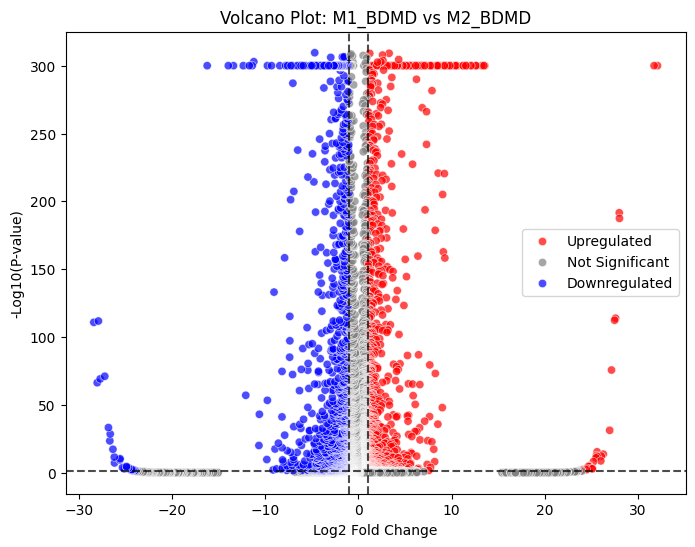

['Cxcl9', 'Ubd', 'Prm1', 'Pydc3', 'Cfb', 'Gm4841', 'Mir155hg', 'Krt16', 'Pcp4', 'Gm15056', 'Ido1', 'Apol9b', 'Gbp10', 'Wdr20rt', 'Gm44293', 'Mycl', 'Marco', 'Coch', 'Gm16685', 'C1s1', 'Pcsk1', 'Il23r', 'Gm28347', 'Sct', 'Heatr9', 'Tlr12', 'Meikin', 'Olfr433', 'Ccl5', 'Serpina3f', 'Ly6a', 'Irg1', 'Cxcl10', 'Saa3', 'Tgtp1', 'Gbp4', 'Oasl1', 'Fpr2', 'Iigp1', 'Serpina3g', 'Ly6i', 'Gbp2b', 'Ms4a4c', 'Slfn1', 'Trim30b', 'Nos2', 'Slco3a1', 'Tgtp2', 'Ifi44', 'Pydc4', 'Ifit1bl1', 'Gbp6-1', 'Lysmd2', 'Ifit1', 'Ifi205', 'Gbp5', 'Irf7', 'Gm13822', 'Slc6a19', 'Fpr1', 'Ifit2', 'Ifit3', 'Clic5', 'Kynu', 'Pacsin1', 'Ptgs2', 'F830016B08Rik', 'Ifit3b', 'AC125149.3', 'Fam26f', 'Gm20497', 'Sectm1a', 'Dnase1l3', 'Bcl2l14', 'Upp1', 'Igtp', 'B3gnt4', 'Trim30c', 'Isg15', 'Fam3b', 'Tnfsf10', 'Vwa3b', 'Lcn2', 'Il6', 'Cd69', 'Plac8', 'C3', 'AW112010', 'H2-Oa', 'A530040E14Rik', '2310031A07Rik', 'Mx1', 'Phf11a', 'Socs3', 'Rtp4', 'Klrk1', 'Gm4955', 'Procr', 'Gbp2', 'Il27', 'Aif1', 'Gm4951', 'Cmpk2', 'Cnn3', 'Csprs'

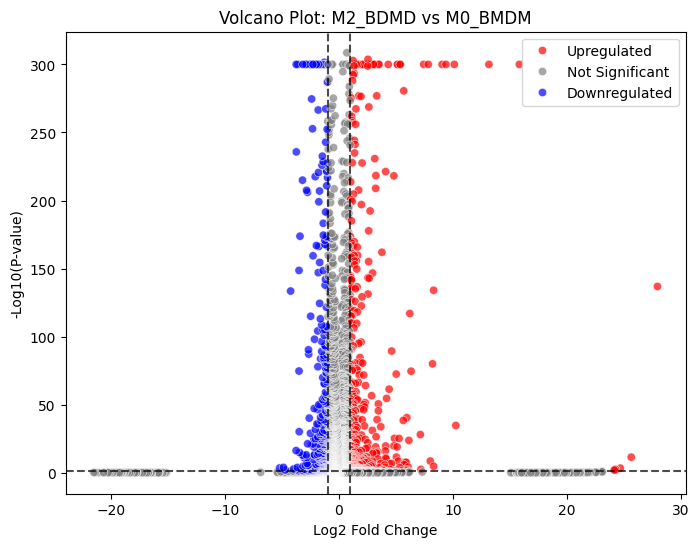

['Msx3', 'Kcnd3', 'Cdh1', 'Dclk1', 'Il31ra', 'Pmepa1', 'Retnla', 'Rnase2a', 'Scn3a', 'Tmem26', 'Chil3', 'Arg1', 'Gm15496', 'Rbp4', 'Cldn11', 'Ccl17', 'Slc7a2', 'Mgl2', 'Ang2', 'Gm8113', 'Pdcd1lg2', 'Tuba8', 'Ear2', 'Ch25h', 'Pdlim1', 'Shisa2', 'Edn1', 'Ttll11', 'Ablim1', 'Map2', 'Socs1', 'Bok', 'Adipoq', 'Flt1', 'Cish', 'Lipn', 'Fn1', 'Ppp1r3c', 'March10', 'Mcf2l', 'Wwc1', 'Ddx4', 'Bcat1', 'Ccl24', 'Gm15856', '9530059O14Rik', 'Ffar4', 'AA467197', 'Socs2', 'Itgb8', 'Gfra2', '9430020K01Rik', 'Bex1', 'Ccl8', 'Irf4', 'Pkp2', 'Tarm1', 'Slc9a3r2', 'Plekhf1', 'Myrf', 'Eef1a2', 'Slamf1', 'Rasgrp1', 'Cyp2ab1', 'Ocstamp', 'Tnfaip8l3', 'Afap1', 'Gm42835', 'Vasn', 'Itgax', 'Gda', 'Tex9', 'Slc7a11', 'Src', 'Pecam1', 'Hebp2', 'Lrrc32', 'Ccl22', 'Penk', 'Pla2g5', 'Inadl', 'Gpc1', 'Tppp3', 'Cst7', 'Mmp19', 'Flywch2', 'Itgb3', 'Car2', 'Rnf19b', 'F10', 'Arfgef3', 'Rmi2', 'Acp5', 'Mt3', 'Serpinb9b', 'Camk2n1', 'Bhlhe40', 'Gm44205', 'Ltb4r1', 'Gm16315', 'Gm15726', 'Rgcc', 'Il1rl2', 'Srgn', 'Cgref1', 'Rras

In [370]:
import pandas as pd
import numpy as np
import scanpy as sc
import matplotlib.pyplot as plt
import seaborn as sns

# 🔹 특정 그룹을 묶어서 새로운 참조 그룹 생성 (수정)
def merge_groups(Madata, groupby, group1, ref_groups):
    Madata = Madata.copy()
    
    if isinstance(ref_groups, str):  # 만약 단일 그룹이면 리스트로 변환
        ref_groups = [ref_groups]
    
    if len(ref_groups) == 1:
        ref_name = ref_groups[0]  # 참조 그룹이 하나라면 이름 그대로 사용
    else:
        ref_name = "_".join(ref_groups)  # 여러 그룹이면 합쳐서 새로운 참조 그룹 생성 (ex: "M2_M3")
    
    Madata.obs[groupby] = Madata.obs[groupby].astype(str)
    
    # 여러 개의 참조 그룹이 있다면 하나로 병합
    if len(ref_groups) > 1:
        Madata.obs[groupby] = Madata.obs[groupby].replace(ref_groups, ref_name)
    
    return Madata, ref_name

# 🔹 볼케이노 플롯 함수
def plot_volcano(deg_results, group1, reference):
    plt.figure(figsize=(8, 6))
    sns.scatterplot(data=deg_results, x="logFC", y="neg_log_pval", hue="significance",
                    palette={"Upregulated": "red", "Downregulated": "blue", "Not Significant": "gray"},
                    alpha=0.7)

    plt.axvline(x=1, linestyle='--', color='black', alpha=0.7)
    plt.axvline(x=-1, linestyle='--', color='black', alpha=0.7)
    plt.axhline(y=-np.log10(0.05), linestyle='--', color='black', alpha=0.7)
    plt.xlabel("Log2 Fold Change")
    plt.ylabel("-Log10(P-value)")
    plt.title(f"Volcano Plot: {group1} vs {reference}")
    plt.legend()
    plt.show()

# 🔹 DEG 분석 & Upregulated 유전자 100개 반환 (수정)
def run_deg_analysis(Madata, groupby, group1, ref_groups, logfc_threshold=1, pval_threshold=0.05, top_n=400):
    # M2 + M3 그룹 합치기 (또는 단일 그룹 유지)
    Madata, reference = merge_groups(Madata, groupby, group1, ref_groups)
    
    # 🔹 DEG 분석 수행 (Wilcoxon test)
    sc.tl.rank_genes_groups(Madata, groupby=groupby, groups=[group1], reference=reference, method='wilcoxon')

    # 🔹 결과 저장
    result = Madata.uns['rank_genes_groups']
    deg_results = pd.DataFrame({
        "gene": result['names'][group1],
        "logFC": result['logfoldchanges'][group1],
        "pval": result['pvals'][group1]
    })

    # 0을 작은 값으로 변경하여 log 변환 가능하게 함
    deg_results["pval"] = deg_results["pval"].replace(0, 1e-300)
    deg_results["neg_log_pval"] = -np.log10(deg_results["pval"])

    # 🔹 DEG 필터링
    deg_results["significance"] = "Not Significant"
    deg_results.loc[(deg_results["logFC"] > logfc_threshold) & (deg_results["pval"] < pval_threshold), "significance"] = "Upregulated"
    deg_results.loc[(deg_results["logFC"] < -logfc_threshold) & (deg_results["pval"] < pval_threshold), "significance"] = "Downregulated"

    # 🔹 볼케이노 플롯 출력
    plot_volcano(deg_results, group1, reference)

    # 🔹 상위 100개 Upregulated 유전자 리스트 반환
    upregulated_genes = deg_results[
        (deg_results["logFC"] > logfc_threshold) & (deg_results["pval"] < pval_threshold)
    ].sort_values("logFC", ascending=False)["gene"].head(top_n).tolist()
    
    return upregulated_genes
upregulated_gene_list = run_deg_analysis(Madata, groupby="sample", group1="M1_BDMD", ref_groups="M2_BDMD")
print(upregulated_gene_list)
upregulated_gene_list = run_deg_analysis(Madata, groupby="sample", group1="M2_BDMD", ref_groups="M0_BMDM")
print(upregulated_gene_list)

In [ ]:
Xxadata = M0M1
# sc.external.pp.bbknn(Xxadata, batch_key="sample")
# sc.pp.normalize_total(Xxadata)
# sc.pp.log1p(Xxadata)
Xxadata.X = Xxadata.X.astype("float64")
sc.pp.recipe_zheng17(Xxadata)
sc.tl.pca(Xxadata, svd_solver="arpack")
sc.pp.neighbors(Xxadata, n_neighbors=200, n_pcs=50)
sc.tl.draw_graph(Xxadata)
sc.pl.draw_graph(Xxadata, color="Final_pred", legend_loc="on data")
sc.tl.rank_genes_groups(Xxadata, groupby="Final_pred", method="wilcoxon")
sc.tl.dendrogram(Xxadata, groupby='Final_pred')

sc.pl.rank_genes_groups_heatmap(
    Xxadata,
    n_genes=50,
    use_raw=False,
    swap_axes=True,
    show_gene_labels=False,
    vmin=-3,
    vmax=3,
    cmap="bwr",
)

# X2
sc.tl.diffmap(Xxadata)
sc.pp.neighbors(Xxadata, n_neighbors=100, use_rep="X_diffmap")
sc.tl.draw_graph(Xxadata)
sc.pl.draw_graph(Xxadata, color="Final_pred", legend_loc="on data")
sc.tl.louvain(Xxadata, resolution=1.0)
sc.tl.paga(Xxadata, groups="Final_pred")
sc.pl.paga(Xxadata, color=["Final_pred"])
sc.pl.draw_graph(Xxadata, color="louvain", legend_loc="on data")
sc.pl.draw_graph(Xxadata, color="Final_pred", legend_loc="on data")
sc.tl.paga(Xxadata, groups="Final_pred")
sc.pl.paga(Xxadata, threshold=0.03, show=False)
sc.tl.draw_graph(Xxadata, init_pos="paga")
sc.pl.draw_graph(
    Xxadata, color=["Final_pred"], legend_loc="on data"
)
sc.tl.paga(Xxadata, groups="louvain")
Xxadata.uns["iroot"] = np.flatnonzero(Xxadata.obs["louvain"] == "0")[0]
sc.tl.dpt(Xxadata)
gene_names = [
    *['Ccnb2', 'Nptx1', 'Shisa9', 'Ppp1r1a', 'Pbk', 'Fam64a', 'Slco2b1', 'Rgs16', 'Ska1', 'Pde1c', 'Smpd3', 'Lrr1', 'Dkk2', 'Il1rl1', 'Sapcd2', 'Ccna2', 'Mamdc2', 'Stab2', 'Gprc5c', 'Galnt9', 'F13a1', 'Hist1h1b', 'Ube2c', 'Lrrc39', 'Agmo', 'Fn1', 'Lrrc32', 'Cmbl', 'Gm29291', 'Aspm', 'Mmp12', 'Mxd3', 'Jsrp1', 'Lyzl4', 'Rhoj', 'Tk1', 'Cd163', '2810417H13Rik', 'Neil3', 'Clstn1', 'Acot1', 'Ckap2', 'Ncs1', 'Ramp1', 'Mmp27', 'Esco2', 'Ckap2l', 'Kmo', 'Htr2b', 'Chst7', 'Armc2', 'Fcrls', 'Egr2', 'Anln', 'Cpeb1', 'Nat8l', 'Cass4', 'Gm568', 'Fbln5', 'Arap3', 'Cenpf', 'Kif20a', 'Gpr176', 'Gfra4', 'Clec1a', 'Pcp4l1', 'Tox2', 'Rasgrp3', 'Ptgs1', 'Mmp8', 'Mrc1', 'Knstrn', 'Casc5', 'Kcne3', 'Lat', 'Gpr34', 'Cbr2', 'Hs3st1', 'Coro2b', 'Ptchd1', 'Sult1a1', 'Nes', 'Matk', 'F630028O10Rik', 'Nek2', 'Angptl4', 'Dhcr24', 'Dnph1', 'BC030867', 'Stmn1', 'Cenpm', 'Man2a2', 'Deptor', 'Ppp1r9a', 'Cdca3', 'Sox4', 'Fam78b', 'Adam19', 'Smo', 'Bmp2'],  # M0
    *['Cxcl9', 'Ubd', 'Prm1', 'Gm4841', 'Krt16', 'Pcp4', 'Gm15056', 'Ido1', 'Apol9b', 'Gbp10', 'Gpr55', 'Wdr20rt', 'Gm44293', 'Il6', 'Il23r', 'B3gnt4', 'Sct', 'Heatr9', 'Meikin', 'Vwa3b', 'Olfr433', 'Tnp2', 'Nos2', 'Gbp2b', 'Ccl5', 'Serpina3g', 'Irg1', 'Tgtp1', 'Serpina3f', 'Saa3', 'Upp1', 'Gbp4', 'Iigp1', 'Cxcl10', 'Ly6i', 'Lcn2', 'Oasl1', 'Cfb', 'Ly6a', 'Dnase1l3', 'Fpr1', 'Ptgs2', 'Sectm1a', 'Marco', 'Fpr2', 'Clic5', 'Mir155hg', 'Gbp5', 'Tgtp2', 'Socs1', 'Slc6a19', 'F830016B08Rik', 'Coch', 'Slfn1', 'Kynu', 'Gbp6-1', 'AA467197', 'Ifi205', 'Ly75', 'Wnk2', 'Gm28347', 'Gm26902', 'Gbp2', '2310031A07Rik', 'Slco3a1', 'C3', 'Cnn3', 'Ifit1bl1', 'Adora2a', 'Ifi44', 'Ifit1', 'Gm16685', 'AC125149.3', 'Gm20497', 'Ifit2', 'Ccl8', 'Mmp25', 'Gm4955', 'Il1a', 'Pydc4', 'Irf7', 'Fam3b', 'C1s1', 'Lysmd2', 'Pcsk1', 'Gm13822', 'Isg15', 'Ms4a4c', 'Tlr12', 'Gm4951', 'Cst7', 'Rasgrp1', 'Bcl2l14', 'Pacsin1', 'Igtp', 'Gm12185', 'Pydc3', 'Bcl2a1a', 'AW112010', 'Ido2'],  # M1
    # *['Msx3', 'Kcnd3', 'Il31ra', 'Retnla', 'Rnase2a', 'Scn3a', 'Tmem26', 'Cdh1', 'Arg1', 'Chil3', 'Gm15496', 'Rbp4', 'Cldn11', 'Ccl17', 'Mgl2', 'Ang2', 'Gm8113', 'Igsf3', 'Ear2', 'Shisa2', 'Dclk1', 'Tuba8', 'Bok', 'Adipoq', 'Pdlim1', 'Map2', 'Fn1', 'Flt1', 'Ppp1r3c', 'Bcat1', 'March10', 'Wwc1', 'Lipn', 'Ffar4', 'Ttll11', 'Pmepa1', 'Mcf2l', 'Gfra2', 'Ablim1', 'Bex1', '9530059O14Rik', 'Eef1a2', 'Slc9a3r2', 'Pkp2', 'Plekhf1', '9430020K01Rik', 'Itgb8', 'Irf4', 'Slc7a2', 'Ccl24', 'Socs2', 'Myrf', 'Cyp2ab1', 'Gm42835', 'Itgax', 'Ddx4', 'Cish', 'Lrrc32', 'Hebp2', 'Vasn', 'Penk', 'Gm15856', 'Tnfaip8l3', 'Itgb3', 'Pdcd1lg2', 'Gpc1', 'Mt3', 'Pla2g5', 'Flywch2', 'Camk2n1', 'Tex9', 'Afap1', 'Edn1', 'Syt5', 'Arfgef3', '3300005D01Rik', 'Il1rl2', 'Tmem158', 'Adarb1', 'Il1rl1', 'Gda', 'Rras2', 'Inadl', 'Mmp19', 'Ocstamp', 'Ksr2', 'Mmp12', 'Dhrs9', 'Bhlhe40', 'P2ry1', 'Dusp4', 'Pecam1', '4933417E11Rik', 'Flnc', 'Klf9', 'F3', 'Vwf', 'Egr2', 'Cgref1', 'Olfm1']  # M2
]

sc.pl.draw_graph(Xxadata, color=["Final_pred", "dpt_pseudotime"], legend_loc="on data")
paths = [
    ("M1", ['0','3','1','2','4']),
    # ('M2', ['M0_BMDM','M2_BDMD'])
]
Xxadata.obs["distance"] = Xxadata.obs["dpt_pseudotime"]
Xxadata.obs["clusters"] = Xxadata.obs["louvain"]  # just a cosmetic change
Xxadata.uns["clusters_colors"] = Xxadata.uns["louvain"]
groups_names = Xxadata.obs['Final_pred'].unique()  # 클러스터 이름들을 가져옴
print(groups_names)  # 확인해보기
# 소문자로 변환하여 필터링
Xxadata_var_lower = {gene.lower() for gene in Xxadata.var_names}
gene_names = [gene for gene in gene_names if gene.lower() in Xxadata_var_lower]
_, axs = pl.subplots(
    ncols=3, figsize=(6, 2.5), gridspec_kw={"wspace": 0.05, "left": 0.12}
)
pl.subplots_adjust(left=0.05, right=0.98, top=0.82, bottom=0.2)
for ipath, (descr, path) in enumerate(paths):
    data = sc.pl.paga_path(
        Xxadata,
        path,
        gene_names,
        show_node_names=False,
        ax=axs[ipath],
        ytick_fontsize=5,
        left_margin=0.85,
        n_avg=200,
        annotations=["distance"],
        show_yticks=True if ipath == 0 else False,
        show_colorbar=True,
        color_map="Reds",
        groups_key="louvain",
        color_maps_annotations={"distance": "viridis"},
        title="{} path".format(descr),
        return_data=True,
        show=False,
    )

pl.show()

In [ ]:
Xxadata = M0M2
sc.external.pp.bbknn(Xxadata, batch_key="sample")
# sc.pp.normalize_total(Xxadata)
# sc.pp.log1p(Xxadata)
Xxadata.X = Xxadata.X.astype("float64")
# sc.pp.recipe_zheng17(Xxadata)
sc.tl.pca(Xxadata, svd_solver="arpack")
sc.pp.neighbors(Xxadata, n_neighbors=200, n_pcs=50)
sc.tl.draw_graph(Xxadata)
sc.pl.draw_graph(Xxadata, color="Final_pred", legend_loc="on data")
sc.tl.rank_genes_groups(Xxadata, groupby="Final_pred", method="wilcoxon")
sc.tl.dendrogram(Xxadata, groupby='Final_pred')

sc.pl.rank_genes_groups_heatmap(
    Xxadata,
    n_genes=50,
    use_raw=False,
    swap_axes=True,
    show_gene_labels=False,
    vmin=-3,
    vmax=3,
    cmap="bwr",
)

# X2
sc.tl.diffmap(Xxadata)
sc.pp.neighbors(Xxadata, n_neighbors=200, use_rep="X_diffmap")
sc.tl.draw_graph(Xxadata)
sc.pl.draw_graph(Xxadata, color="Final_pred", legend_loc="on data")
sc.tl.louvain(Xxadata, resolution=1)
sc.tl.paga(Xxadata, groups="Final_pred")
sc.pl.paga(Xxadata, color=["Final_pred",])
sc.pl.draw_graph(Xxadata, color="louvain", legend_loc="on data")
sc.pl.draw_graph(Xxadata, color="Final_pred", legend_loc="on data")
sc.tl.paga(Xxadata, groups="Final_pred")
sc.pl.paga(Xxadata, threshold=0.03, show=False)
sc.tl.draw_graph(Xxadata, init_pos="paga")
sc.pl.draw_graph(
    Xxadata, color=["Final_pred"], legend_loc="on data"
)
sc.tl.paga(Xxadata, groups="louvain")
Xxadata.uns["iroot"] = np.flatnonzero(Xxadata.obs["louvain"] == "1")[0]
sc.tl.dpt(Xxadata)
gene_names = [
    *['Cxcr3', 'Rrad', 'Ctnnd2', 'F630028O10Rik', 'Kcne3', 'RP24-416M6.5', 'Igfbp4', 'Ms4a6b', 'Ms4a4c', 'Slc40a1', 'Fcrl1', 'Ctla2b', 'Pou2f2', 'Ly6a', 'Fgd2', 'Sirpb1c', 'Marcksl1', 'Tnfsf8', 'Dkk2', 'Gm43603', 'Pcp4l1', 'Traf3ip3', 'C5ar1', 'Gm43569', 'Adra1a', 'Slc13a2', 'Bank1', 'St3gal6', 'Kmo', 'Ifit3', 'Arap3', 'Enho', 'Hpgds', 'Tlr2', 'Aif1', 'Gpr34', 'Axl', 'Mex3b', 'Sorl1', 'Arhgap19', 'Trim30c', 'Oas2', 'Pilrb2', 'Gm13710', 'Sirpb1b', 'Cdc6', 'Rtp4', 'Adrb2', 'Ifitm6', 'Ms4a6c', 'Dnph1', 'Gm29291', 'Fcgr1', 'Bmp2', 'Tox2', 'Limd2', 'Rapsn', 'Stab1', 'Ssh2', 'C1qa', 'Map3k5', 'Cxcl2', 'Gpr162', 'Ifitm3', 'Apoc1', 'Tnni2', 'M1ap', 'Maf', 'Acot1', 'Gm9949', 'Arhgap24', 'Cped1', 'Mxd3', 'Gipc2', 'Plau', 'Fam26f', 'Trpm2', 'Ophn1', 'Cfh', 'Cd302', 'Lpcat2', 'C030034L19Rik', 'Pilrb1', 'Cdca7', 'Nt5dc2', 'Nanos1', 'Irf7', 'Rhod', 'Dusp6', 'Hs3st1', 'Ccdc63', 'Gm7676', 'C1qc', 'Cd5l', 'Esco2', 'Gm6377', 'Gm16104', 'Sepp1', 'Dmwd', 'Cd14'],  # M0
    # *['Cxcl9', 'Ubd', 'Prm1', 'Gm4841', 'Krt16', 'Pcp4', 'Gm15056', 'Ido1', 'Apol9b', 'Gbp10', 'Wdr20rt', 'Gm44293', 'Il23r', 'Sct', 'Heatr9', 'Serping1', 'Meikin', 'Olfr433', 'Gp6', 'Gm14010', 'Ccl5', 'Irg1', 'Serpina3f', 'Tgtp1', 'Serpina3g', 'Gbp2b', 'Saa3', 'Cxcl10', 'Gbp4', 'Iigp1', 'Nos2', 'Cfb', 'Ly6i', 'Oasl1', 'Ly6a', 'Marco', 'Mir155hg', 'Fpr2', 'Coch', 'Fpr1', 'Slfn1', 'Tgtp2', 'Gbp5', 'Gm28347', 'Ptgs2', 'Slc6a19', 'Gbp6-1', 'B3gnt4', 'Upp1', 'Clic5', 'Ifi205', 'Vwa3b', 'Kynu', 'Dnase1l3', 'F830016B08Rik', 'Sectm1a', 'Il6', 'Slco3a1', 'Gm16685', 'Lcn2', 'Ifi44', 'Ifit1bl1', 'C1s1', 'Ifit1', 'Pcsk1', 'Tlr12', 'Ifit2', 'Ms4a4c', 'Pydc4', 'Irf7', 'Lysmd2', 'AC125149.3', 'Gm13822', 'Gm20497', 'Pydc3', '2310031A07Rik', 'C3', 'Pacsin1', 'Trim30b', 'Fam3b', 'Gpr55', 'Gbp2', 'Isg15', 'Bcl2l14', 'Igtp', 'Ly75', 'Cnn3', 'Gm4955', 'AW112010', 'Rasgrf1', 'Gm4951', 'Adora2a', 'Mycl', 'Fam26f', 'A530040E14Rik', 'Mx1', 'Phf11a', 'Il27', 'Chrna5', 'Gbp8'],  # M1
    *['Msx3', 'Kcnd3', 'Cdh1', 'Dclk1', 'Il31ra', 'Pmepa1', 'Retnla', 'Rnase2a', 'Scn3a', 'Tmem26', 'Chil3', 'Arg1', 'Gm15496', 'Rbp4', 'Cldn11', 'Ccl17', 'Slc7a2', 'Mgl2', 'Ang2', 'Gm8113', 'Pdcd1lg2', 'Tuba8', 'Ear2', 'Ch25h', 'Pdlim1', 'Shisa2', 'Edn1', 'Ttll11', 'Ablim1', 'Map2', 'Socs1', 'Bok', 'Adipoq', 'Flt1', 'Cish', 'Lipn', 'Fn1', 'Ppp1r3c', 'March10', 'Mcf2l', 'Wwc1', 'Ddx4', 'Bcat1', 'Ccl24', 'Gm15856', '9530059O14Rik', 'Ffar4', 'AA467197', 'Socs2', 'Itgb8', 'Gfra2', '9430020K01Rik', 'Bex1', 'Ccl8', 'Irf4', 'Pkp2', 'Tarm1', 'Slc9a3r2', 'Plekhf1', 'Myrf', 'Eef1a2', 'Slamf1', 'Rasgrp1', 'Cyp2ab1', 'Ocstamp', 'Tnfaip8l3', 'Afap1', 'Gm42835', 'Vasn', 'Itgax', 'Gda', 'Tex9', 'Slc7a11', 'Src', 'Pecam1', 'Hebp2', 'Lrrc32', 'Ccl22', 'Penk', 'Pla2g5', 'Inadl', 'Gpc1', 'Tppp3', 'Cst7', 'Mmp19', 'Flywch2', 'Itgb3', 'Car2', 'Rnf19b', 'F10', 'Arfgef3', 'Rmi2', 'Acp5', 'Mt3', 'Serpinb9b', 'Camk2n1', 'Bhlhe40', 'Gm44205', 'Ltb4r1', 'Gm16315']  # M2
]

sc.pl.draw_graph(Xxadata, color=["Final_pred", "dpt_pseudotime"], legend_loc="on data")
paths = [
    # ("M1", ['M0_BMDM','M1_BDMD']),
    ('M2', ['1','2'])
]
Xxadata.obs["distance"] = Xxadata.obs["dpt_pseudotime"]
Xxadata.obs["clusters"] = Xxadata.obs["Final_pred"]  # just a cosmetic change
Xxadata.uns["clusters_colors"] = Xxadata.uns["louvain"]
groups_names = Xxadata.obs['Final_pred'].unique()  # 클러스터 이름들을 가져옴
print(groups_names)  # 확인해보기
# 소문자로 변환하여 필터링
Xxadata_var_lower = {gene.lower() for gene in Xxadata.var_names}
gene_names = [gene for gene in gene_names if gene.lower() in Xxadata_var_lower]
_, axs = pl.subplots(
    ncols=3, figsize=(6, 2.5), gridspec_kw={"wspace": 0.05, "left": 0.12}
)
pl.subplots_adjust(left=0.05, right=0.98, top=0.82, bottom=0.2)
for ipath, (descr, path) in enumerate(paths):
    data = sc.pl.paga_path(
        Xxadata,
        path,
        gene_names,
        show_node_names=False,
        ax=axs[ipath],
        ytick_fontsize=5,
        left_margin=0.85,
        n_avg=200,
        annotations=["distance"],
        show_yticks=True if ipath == 0 else False,
        show_colorbar=True,
        color_map="Reds",
        groups_key="louvain",
        color_maps_annotations={"distance": "viridis"},
        title="{} path".format(descr),
        return_data=True,
        show=False,
    )

pl.show()

In [82]:
!pip install gseapy
!pip install.packages("GSVA")
!pip install rpy2

Defaulting to user installation because normal site-packages is not writeable
/bin/bash: -c: line 1: syntax error near unexpected token `('
/bin/bash: -c: line 1: `pip install.packages("GSVA")'
Defaulting to user installation because normal site-packages is not writeable
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 221.0/221.0 KB 5.6 MB/s eta 0:00:00a 0:00:01
  Installing build dependencies ... done
  Getting requirements to build wheel ... error
  error: subprocess-exited-with-error
  
  × Getting requirements to build wheel did not run successfully.
  │ exit code: 1
  ╰─> [16 lines of output]
      Traceback (most recent call last):
        File "/usr/lib/python3/dist-packages/pip/_vendor/pep517/in_process/_in_process.py", line 363, in <module>
          main()
        File "/usr/lib/python3/dist-packages/pip/_vendor/pep517/in_process/_in_process.py", line 345, in main
          json_out['return_val'] = hook(**hook_input['kwargs'])
        File "/usr/lib/python3/dist-packages/pip/_ve